In [10]:
pip install lightkurve

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 1.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 270.4/270.4 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 93.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 999.4/999.4 kB 43.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 79.8 MB/s eta 0:00:00
  Created wheel for fbpca: filename=fbpca-1.0-py3-none-any.whl size=11373 sha256=63de08063f06922142e02db1450a4b2b16319a26f46471e03f0a80184aaac234
  Stored in directory: /root/.cache/pip/wheels/71/ae/f7/5b7e1e16a133d094431428169e9a8d9f750afe5459f0333c9b
  Created wheel for memoization: filename=memoization-0.4.0-py3-none-

In [11]:
# Import Statements
import numpy as np
import pandas as pd
import lightkurve as lk
import matplotlib.pyplot as plt
from google.colab import files
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from tensorflow.keras import models
from tensorflow.keras.preprocessing import image_dataset_from_directory
import matplotlib.pyplot as plt
import pandas as pd
import sklearn as sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import zipfile
import shutil
from google.colab import files

In [ ]:
# Optional - Upload your own training image files

with zipfile.ZipFile('training_images.zip', 'r') as zip_ref:
    zip_ref.extractall('training_images')

In [14]:
# Functions

# Finds the sectors with SNR above a set threshold and returns the good indices of the TESS search results
def find_good_sectors(tess_id, SNR_threshold):
    search_result = lk.search_lightcurve('TIC ' + str(tess_id))
    good_indices = []
    for i, result in enumerate(search_result):
        try:
            lcf = result.download()
            if lcf is None or lcf.flux is None:
                continue
            flux = lcf.flux.value
            median_flux = np.nanmedian(flux)
            std = np.nanstd(flux)
            if std != 0:
              SNR = median_flux / std
            else:
              SNR = 0
            if SNR >= SNR_threshold:
                good_indices.append(i)
        except Exception as e:
            print(f"Skipping- Index {i} due to error: {e}")
            continue
    return good_indices

# Finds the planet data from TESS above an SNR threshold, combines them, removes outliers using sigma clipping, and folds them
# to create the phase folded plot
def find_and_plot_LC(tess_id, period, transit_duration_hours):
    indices_to_use = find_good_sectors(tess_id, SNR_threshold=100)
    if len(indices_to_use)==0:
        print(f"Skipping - No light curves passed SNR threshold for TIC {tess_id}")
        return None, None
    search_result = lk.search_lightcurve(f"TIC {tess_id}")
    good_search_results = search_result[indices_to_use]
    all_time = []
    all_flux = []
    for result in good_search_results:
        try:
            lcf = result.download()
            if lcf is None or lcf.flux is None:
                continue
            time = lcf.time.value
            flux = lcf.flux.value
            if np.any(np.isnan(time)) or np.any(np.isnan(flux)):
                continue
            median_flux = np.nanmedian(flux)
            norm_flux = flux / median_flux
            all_time.append(time)
            all_flux.append(norm_flux)
        except Exception as e:
            print(f"Skipping - {e}")
            continue
    if len(all_time)==0:
        print(f"Skipping - No light curve sectors found for TIC {tess_id}")
        return None, None
    combined_time = np.concatenate(all_time)
    combined_flux = np.concatenate(all_flux)
    clean_lc = lk.LightCurve(time=combined_time, flux=combined_flux)
    folded = clean_lc.fold(period=period, epoch_time=1367.2755)
    transit_duration = transit_duration_hours/24
    in_transit = np.abs(folded.time.value) < (transit_duration/2)
    out_of_transit = ~in_transit
    cleaned = folded[out_of_transit].remove_outliers(sigma=5.7)
    masked_lcf = cleaned.append(folded[in_transit])
    masked_lcf.bin(time_bin_size=0.025).plot(label=f"TIC {tess_id}")
    return masked_lcf.time.value, masked_lcf.flux.value

# Finds the binary data from TESS above an SNR threshold, combines them, removes outliers using sigma clipping, and folds them
# to create the phase folded plot
def find_and_plot_LC_EB(tess_id, period):
    indices_to_use = find_good_sectors(tess_id, SNR_threshold = 10)
    if len(indices_to_use)==0:
        print(f"Skipping -No light curves passed SNR threshold for TIC {tess_id}")
        return None, None
    search_result = lk.search_lightcurve(f"TIC {tess_id}")
    good_search_result = search_result[indices_to_use]
    all_time = []
    all_flux = []
    for result in good_search_result:
        try:
            lcf =result.download()
            if lcf is None or lcf.flux is None:
                continue
            time= lcf.time.value
            flux = lcf.flux.value
            if np.any(np.isnan(time)) or np.any(np.isnan(flux)):
                continue
            median_flux = np.nanmedian(flux)
            norm_flux = flux/median_flux
            all_time.append(time)
            all_flux.append(norm_flux)
        except Exception as e:
            print(f"Skipping- A sector due to error: {e}")
            continue
    if len(all_time)==0:
        raise ValueError("Skipping -No valid light curve segments found.")
    combined_time = np.concatenate(all_time)
    combined_flux = np.concatenate(all_flux)
    clean_lc = lk.LightCurve(time=combined_time, flux=combined_flux)
    folded = clean_lc.fold(period=period, epoch_time=1367.2755)
    folded.bin(time_bin_size=0.025).plot(label=f"TIC {tess_id}")
    cleaned = folded.remove_outliers(sigma=10)
    return cleaned.time.value, cleaned.flux.value

# Finds and plots the LC data from the TESS for the input TIC ID
def find_and_plot_LC_Input(tess_id, period):
    all_time = []
    all_flux = []
    search_result = lk.search_lightcurve(f"TIC {tess_id}")
    for result in search_result:
        try:
            lcf =result.download()
            if lcf is None or lcf.flux is None:
                continue
            time= lcf.time.value
            flux = lcf.flux.value
            if np.any(np.isnan(time)) or np.any(np.isnan(flux)):
                continue
            median_flux = np.nanmedian(flux)
            norm_flux = flux/median_flux
            all_time.append(time)
            all_flux.append(norm_flux)
        except Exception as e:
            print(f"Skipping- A sector due to error: {e}")
            continue
    if len(all_time)==0:
        raise ValueError("Skipping -No valid light curve segments found.")
    combined_time = np.concatenate(all_time)
    combined_flux = np.concatenate(all_flux)
    clean_lc = lk.LightCurve(time=combined_time, flux=combined_flux)
    folded = clean_lc.fold(period=period, epoch_time=1367.2755)
    folded.bin(time_bin_size=0.025).plot(label=f"TIC {tess_id}")
    cleaned = folded.remove_outliers(sigma=3)
    return cleaned.time.value, cleaned.flux.value

# Predicts the classification with the CNN Model and writes the stellar values into a txt file for MCMC code in other notebook
def give_TIC_ID_get_class(tess_id, period, model):
  time, flux = find_and_plot_LC_Input(tess_id, period)
  plt.savefig(f"predict/predict_curve_{tess_id}.png", dpi=150)
  plt.show()
  def load_image_for_prediction(img_path):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(64, 64), color_mode='grayscale')
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array
  img_path = f"predict/predict_curve_{tess_id}.png"
  image = load_image_for_prediction(img_path)
  prediction = model.predict(image)
  predicted_class = np.argmax(prediction, axis=1)[0]
  if predicted_class == 1:
    print(f"Prediction: Planet Signal (confidence: {np.max(prediction):.7f})")
    print('Yay, you found a planet, use MCMC code in next notebook to get planetary parameters')
  elif predicted_class == 0:
     print(f"Prediction: Binary Signal (confidence: {np.max(prediction):.7f})")
  df = pd.DataFrame({ 'TIC_ID': tess_id, 'Period [days]': period, 'Time:': time, 'Flux': flux})
  df.to_csv("object_parameters.txt", sep="\t")

In [15]:
# Upload the txt file with the data for the planetary signal and puts it into a pandas dataframe
uploaded = files.upload()
columns = ["TIC", "Rad_Rjup", "Rad", "BJD_d", "P_orb_d", "Dur_h", "Depth_ppm", "Simbad", "RA_deg", "Dec_deg"]
df_planets = pd.read_fwf("TESS_Planet_Data.txt", skiprows=3, names=columns)
df_planets_175 = df_planets.head(175)

Saving TESS_Planet_Data.txt to TESS_Planet_Data.txt


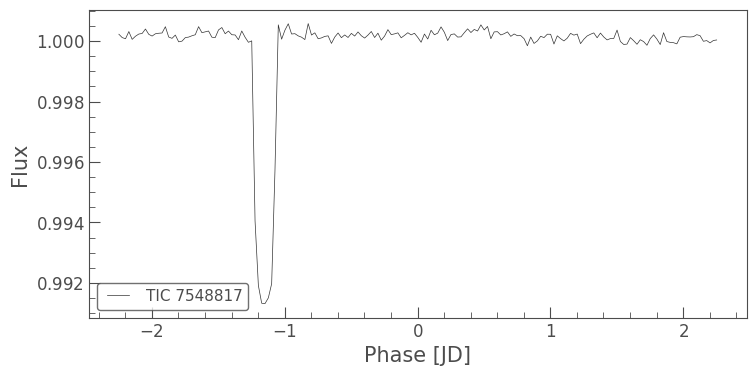

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

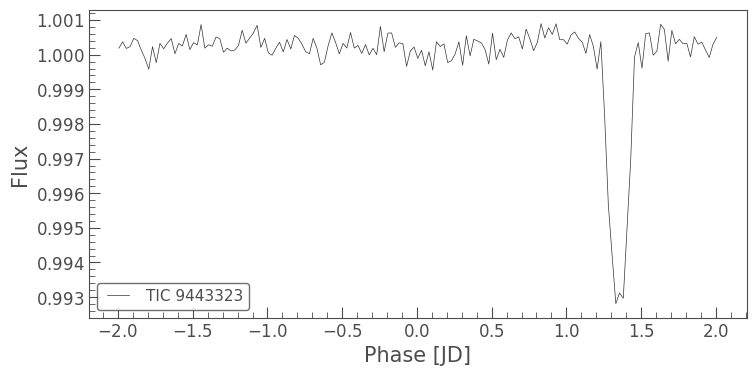

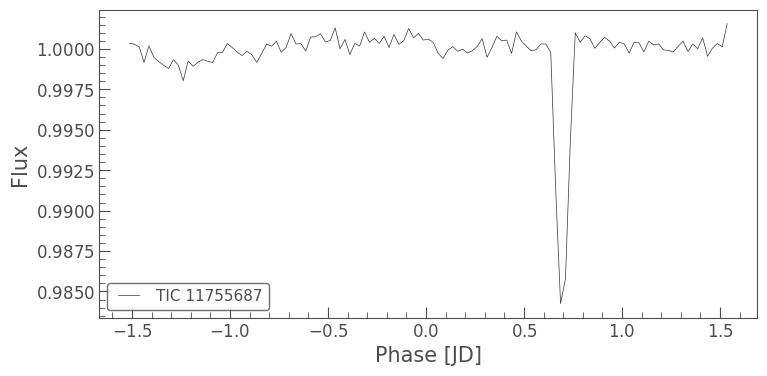

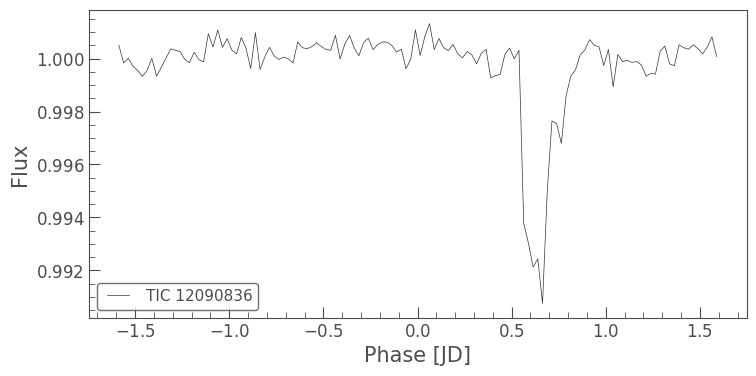

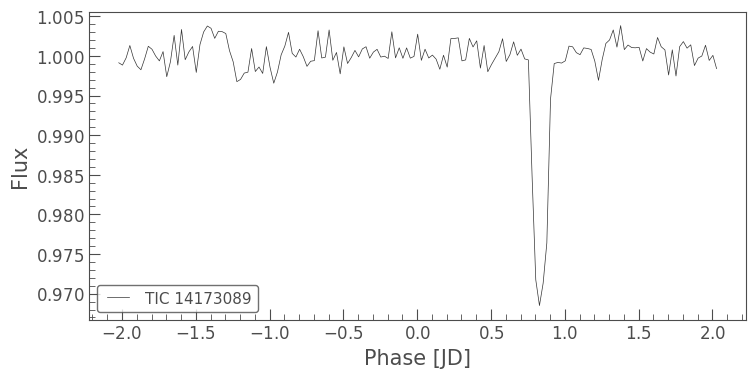

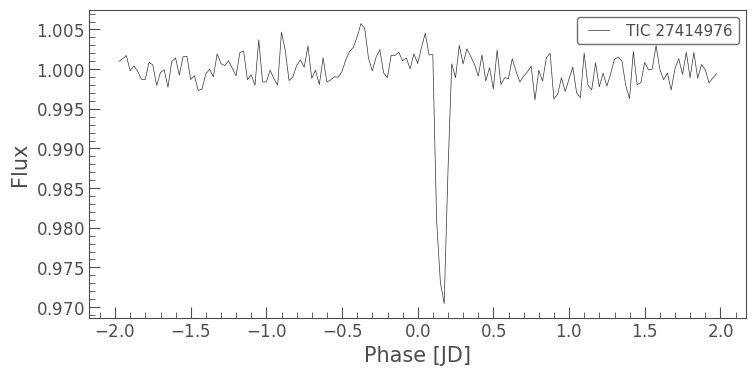

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

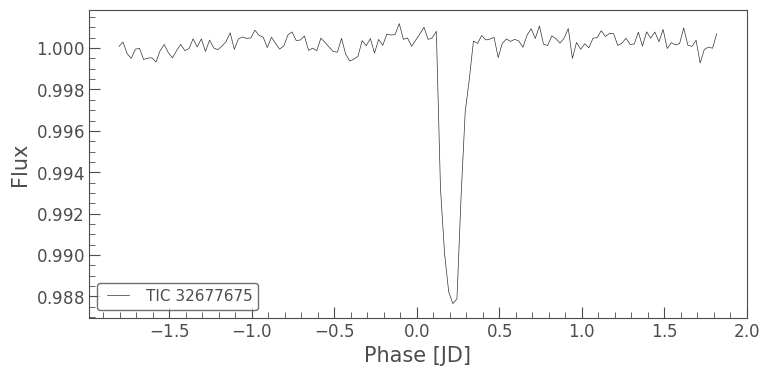

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

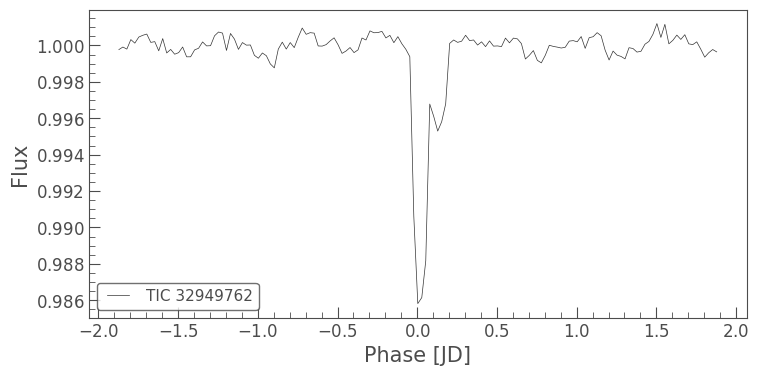

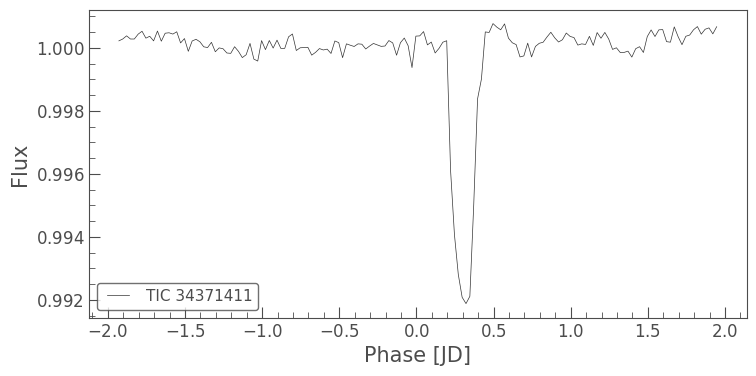

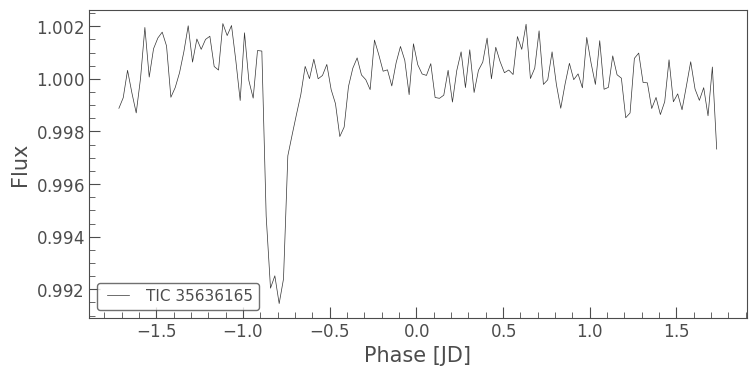

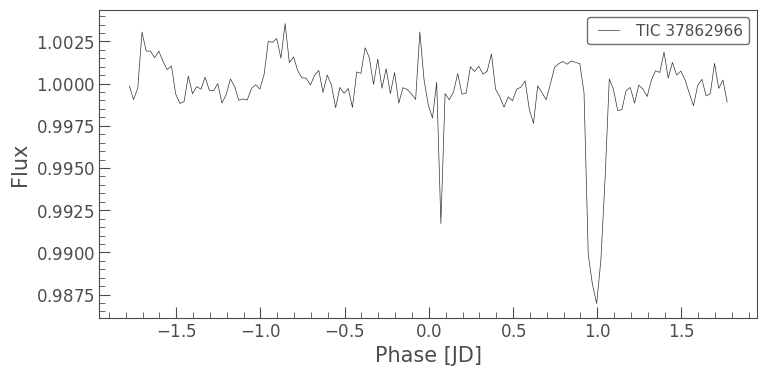

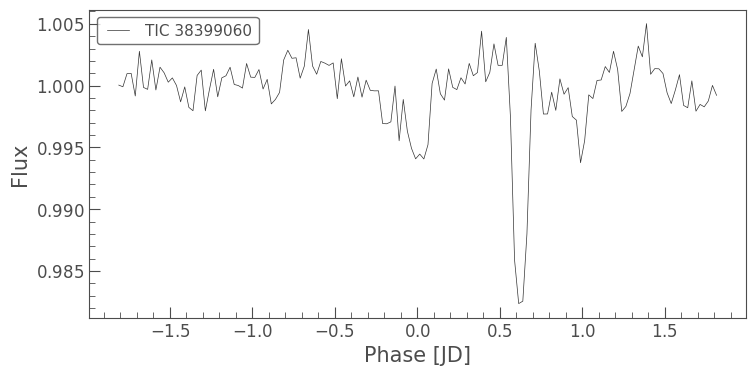

Skipping- Index 16 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam3-ccd1-04705440348431828864_tess_v01/hlsp_t16_tess_ffi_s0001-cam3-ccd1-04705440348431828864_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


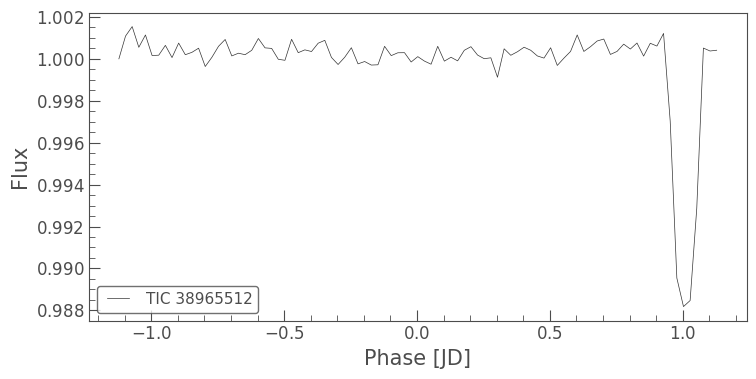

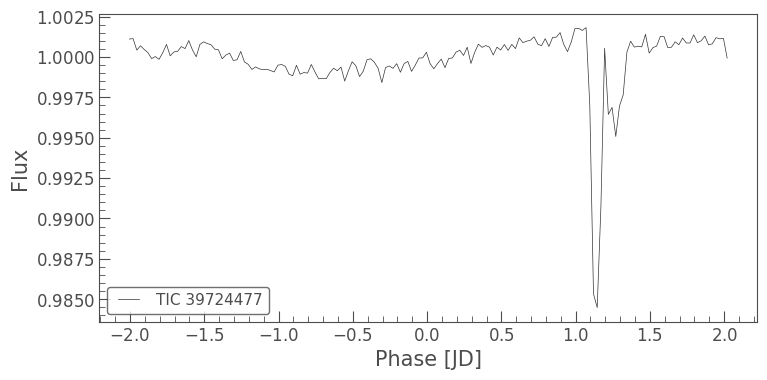

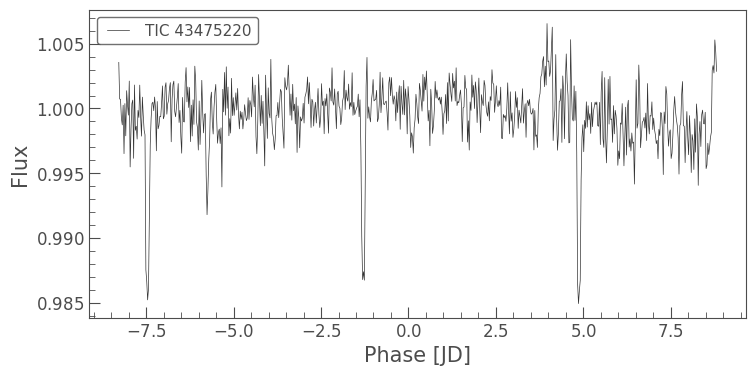

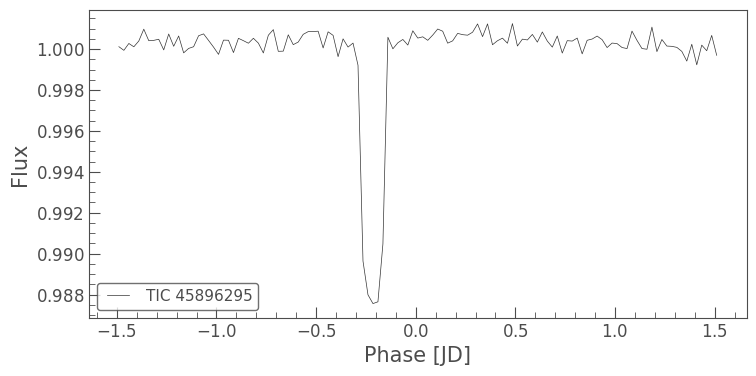

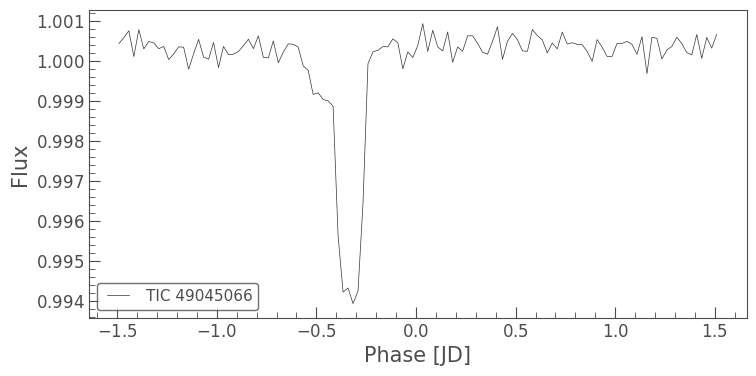

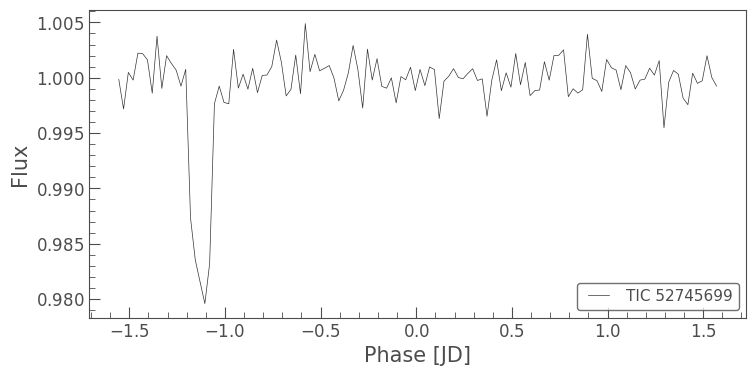

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

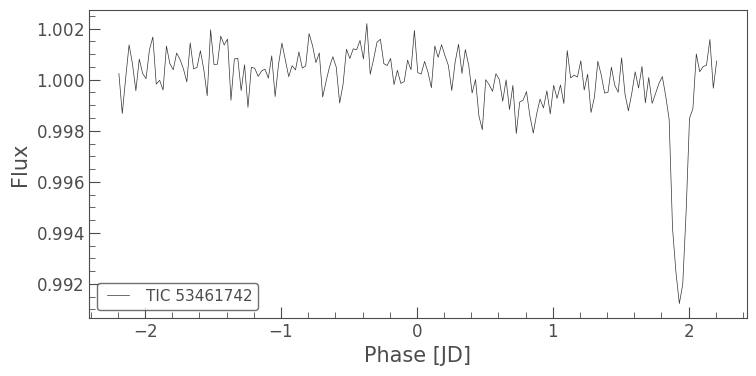

Skipping- Index 27 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04762018364939348480_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04762018364939348480_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


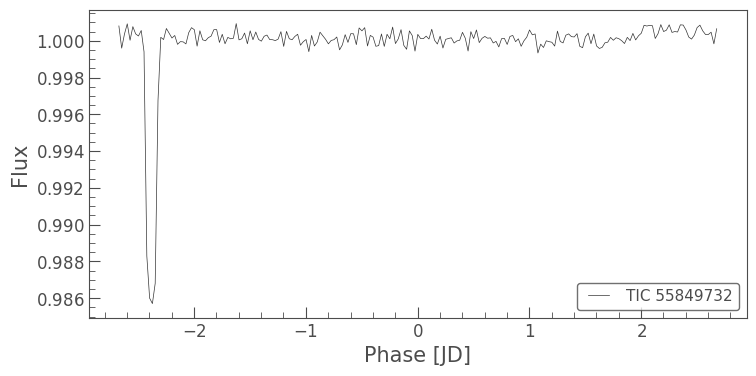

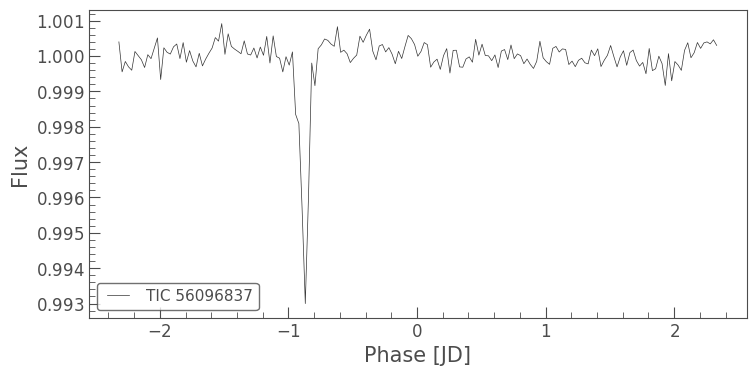

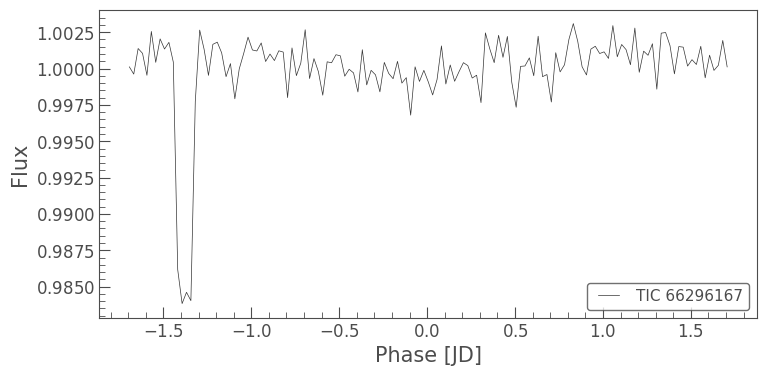

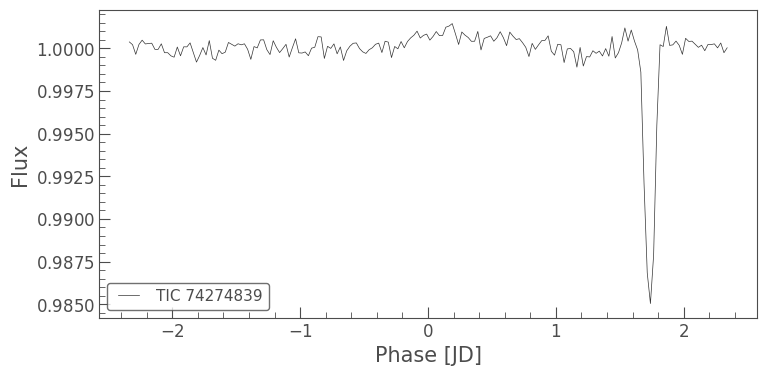

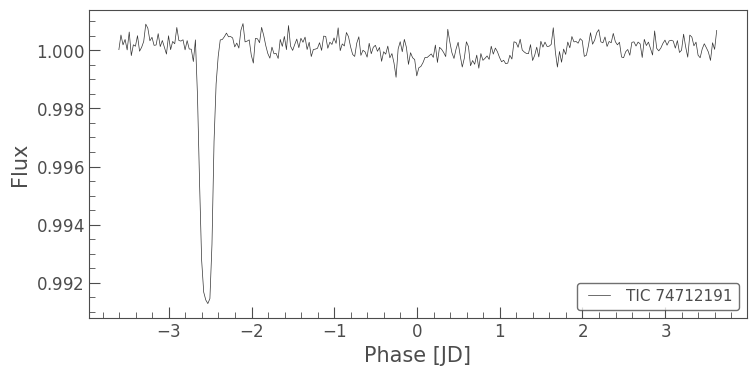

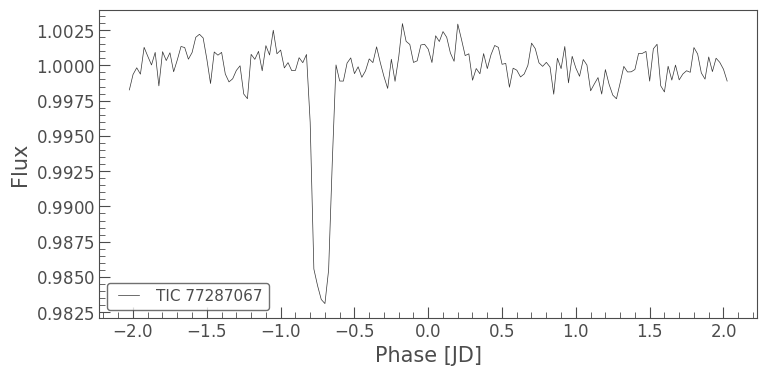

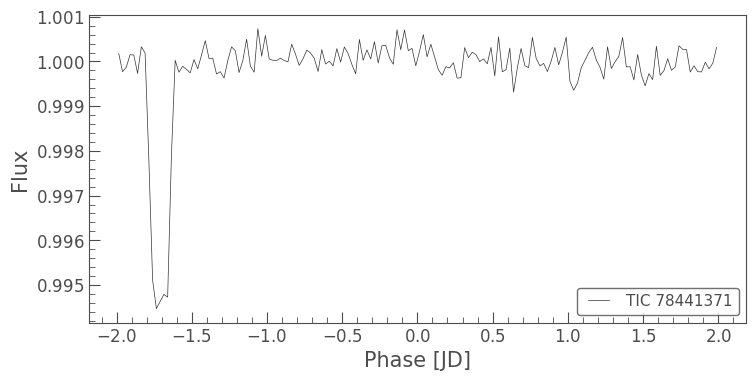

Skipping- Index 14 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000085429139_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000085429139_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


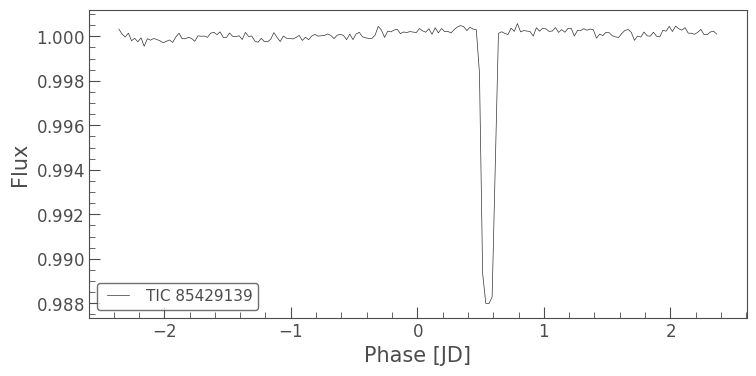

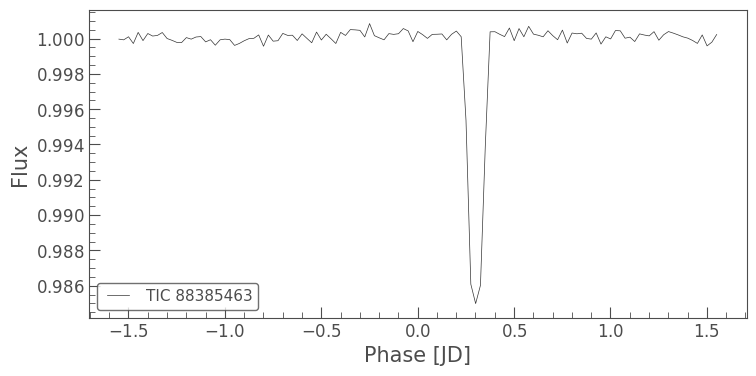

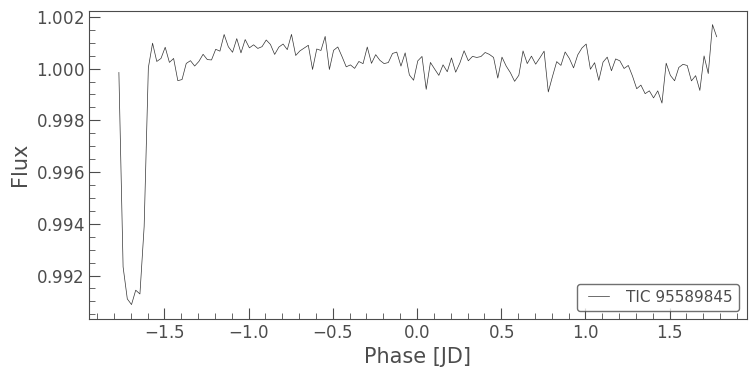

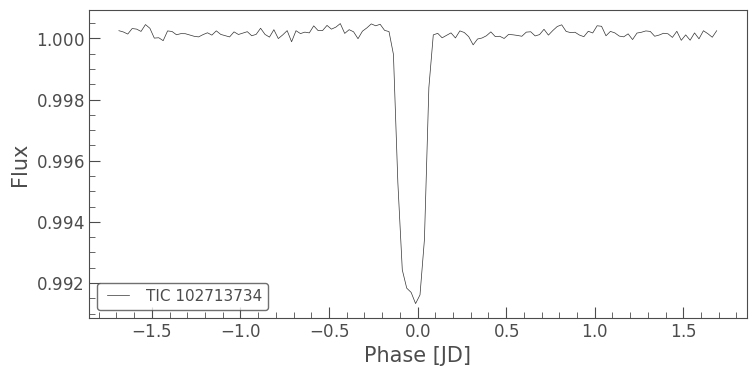

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')


Skipping- Index 23 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000103751498_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000103751498_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

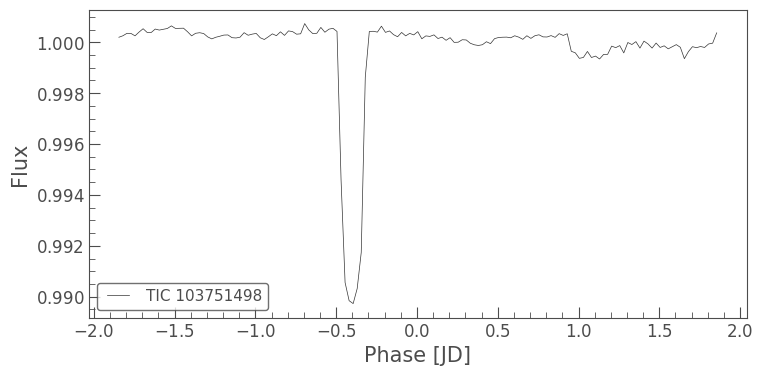

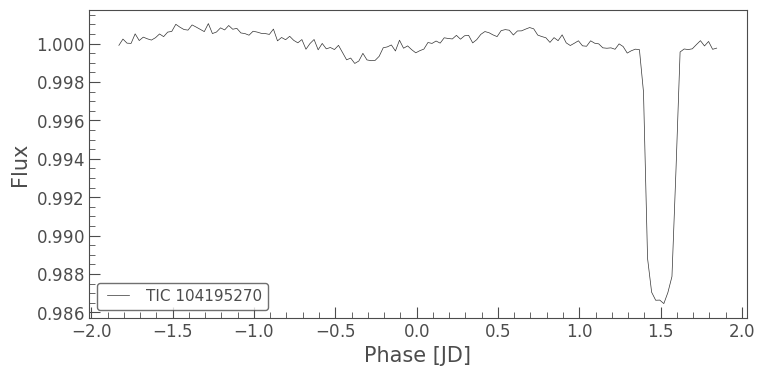

Skipping- Index 9 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000104986789_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000104986789_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


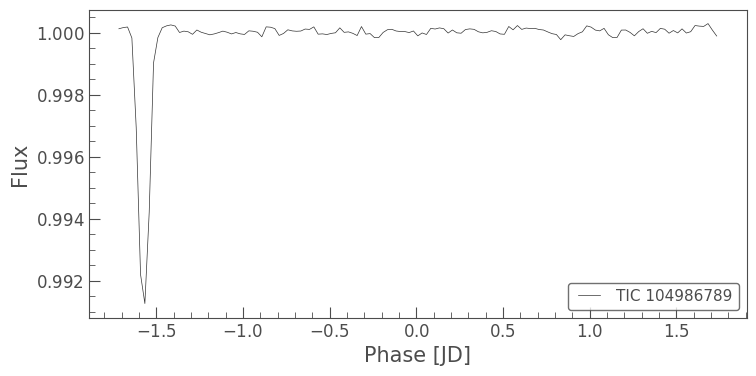

Skipping - No light curves passed SNR threshold for TIC 105379013


<Figure size 640x480 with 0 Axes>

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

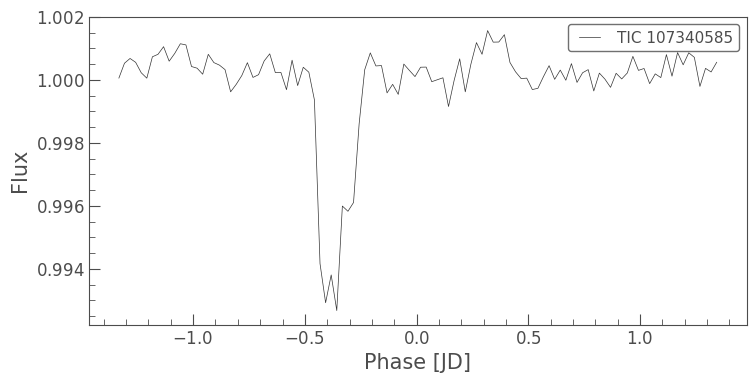

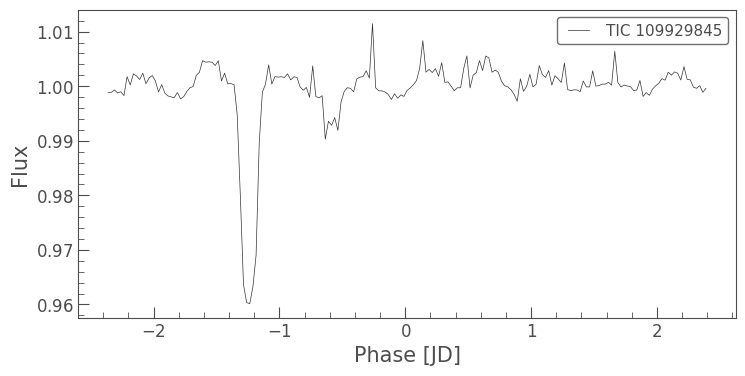

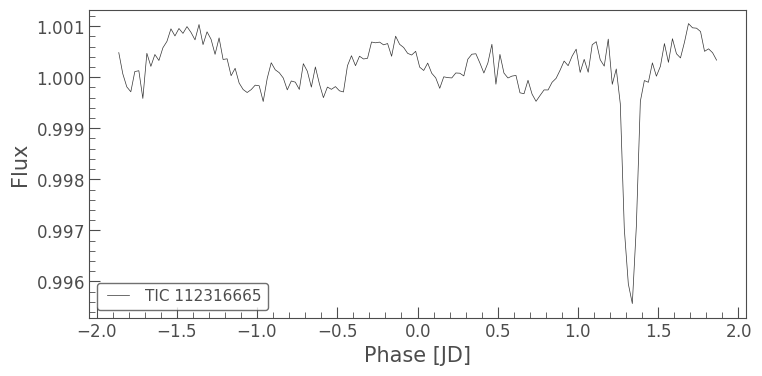

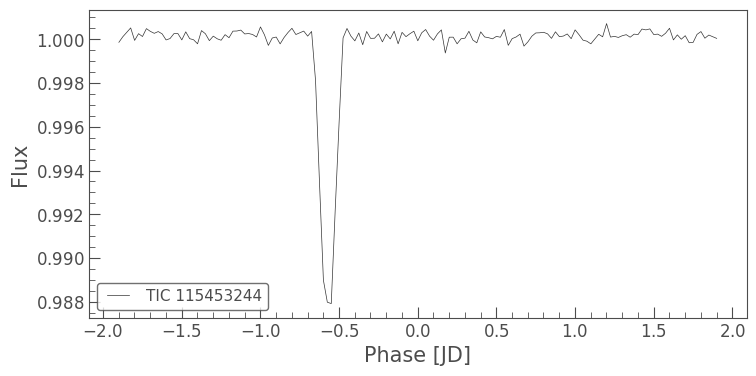

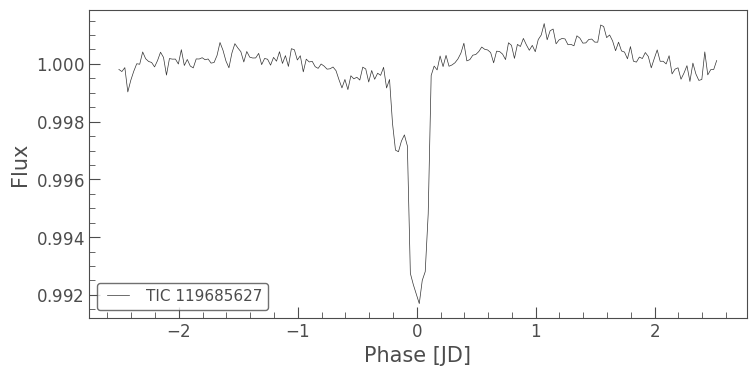

Skipping - No light curves passed SNR threshold for TIC 120232318


<Figure size 640x480 with 0 Axes>

Skipping - No light curves passed SNR threshold for TIC 120232321


<Figure size 640x480 with 0 Axes>

Skipping- Index 18 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000137389526_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000137389526_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


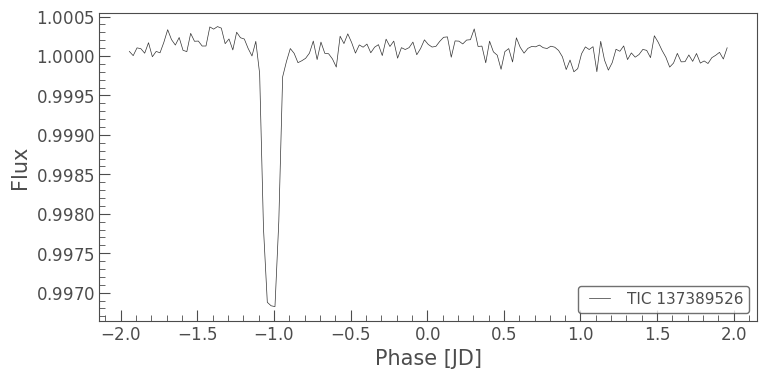

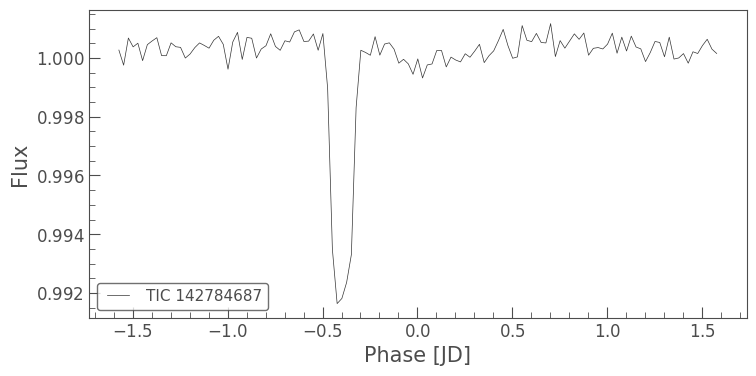

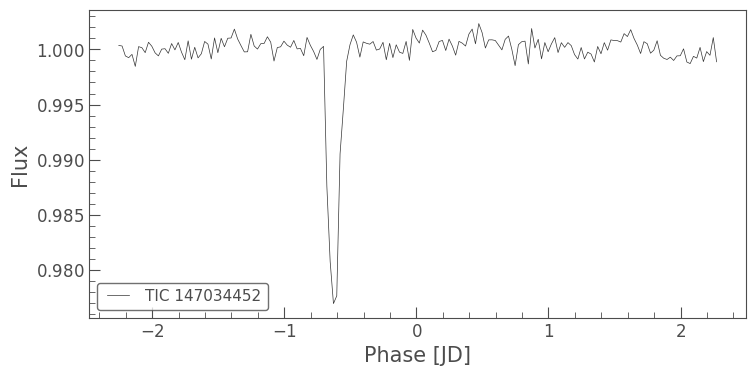

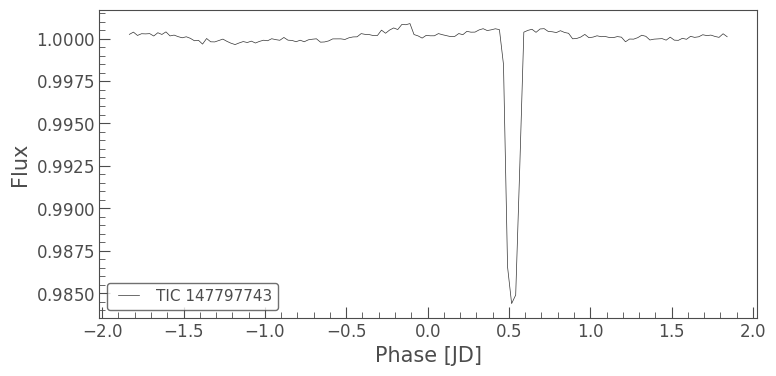

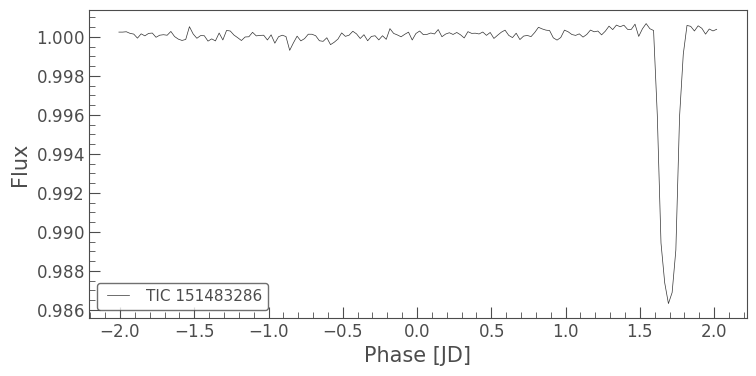

...

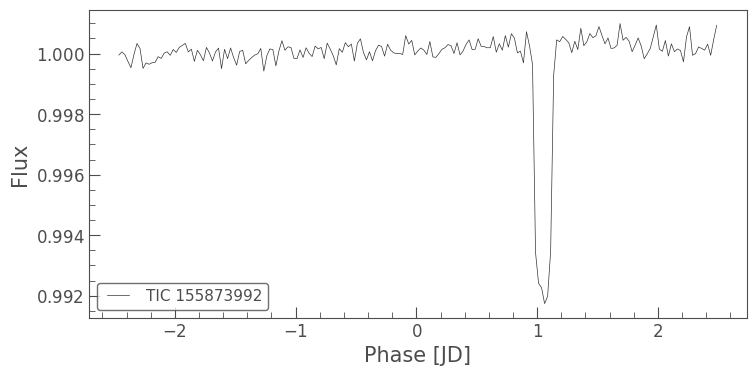

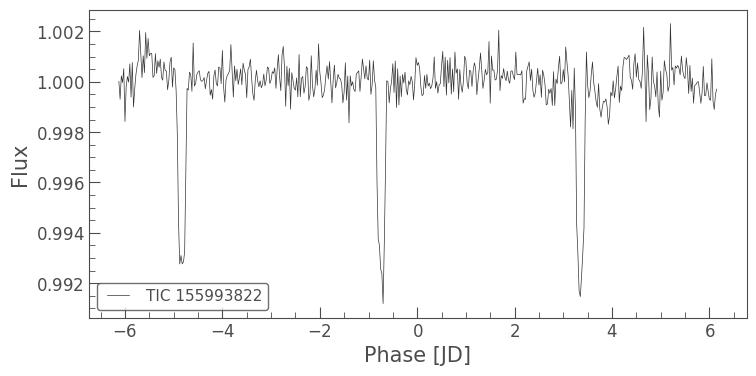

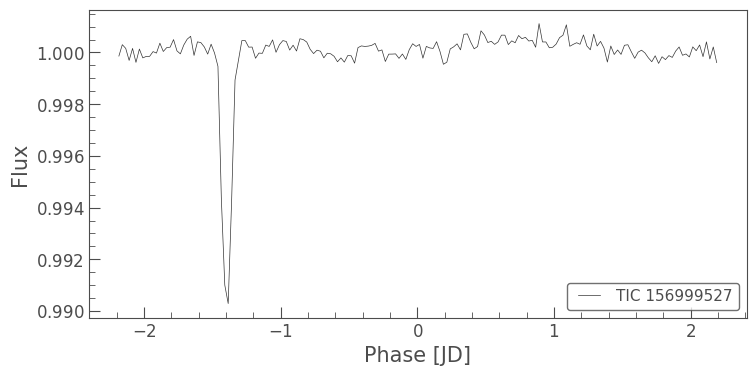

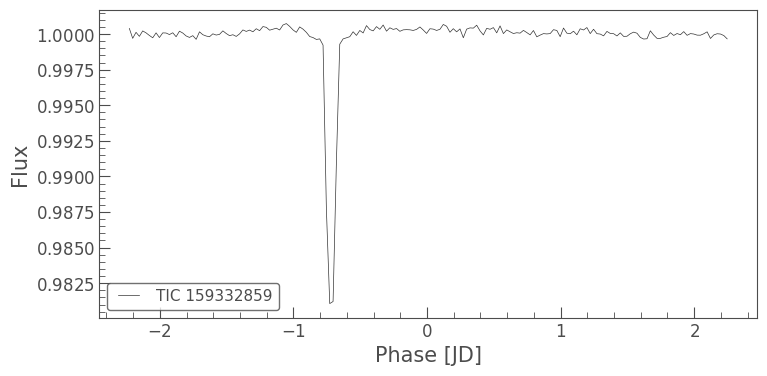

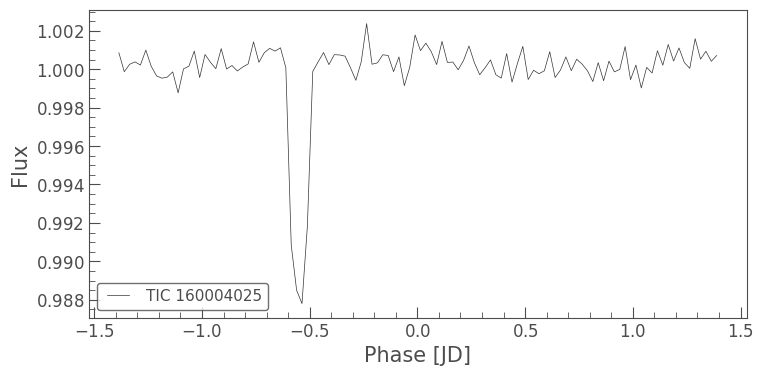

Skipping- Index 7 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam1-ccd2-06593678533494466944_tess_v01/hlsp_t16_tess_ffi_s0001-cam1-ccd2-06593678533494466944_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


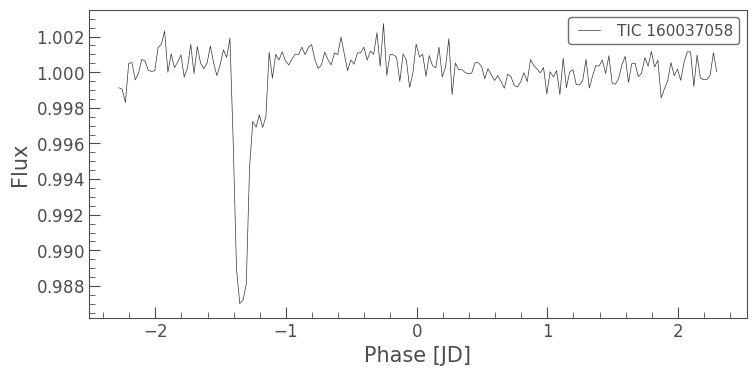

Skipping- Index 9 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000160432093_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000160432093_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


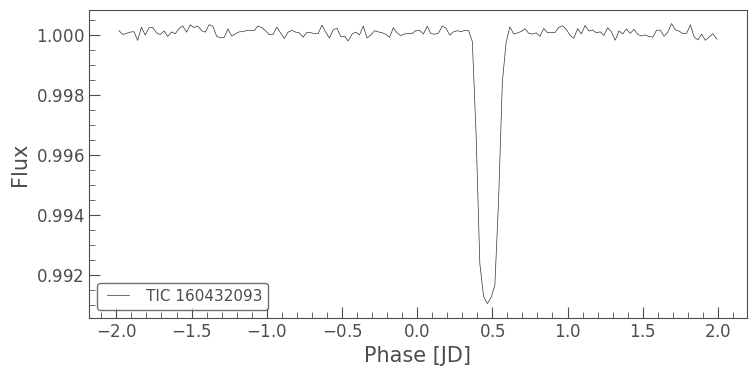

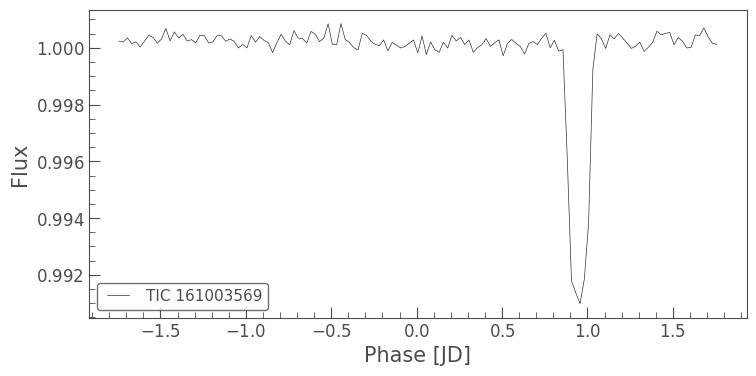

Skipping- Index 11 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000165464482_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000165464482_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


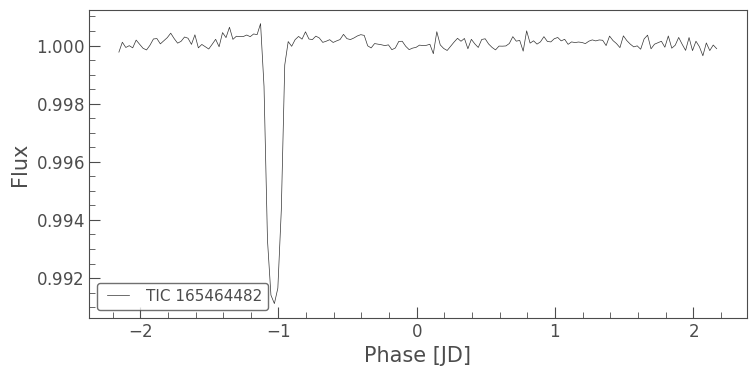

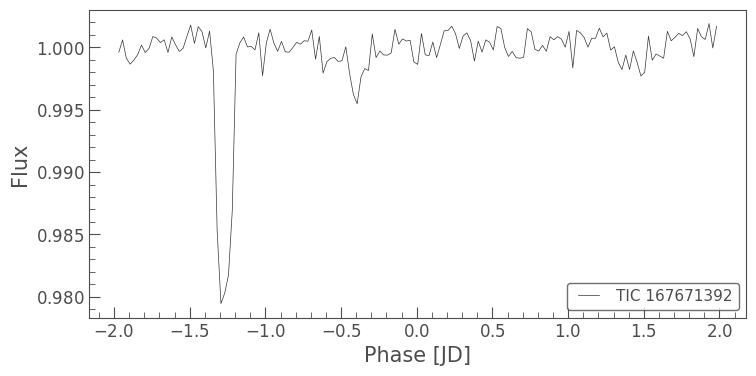

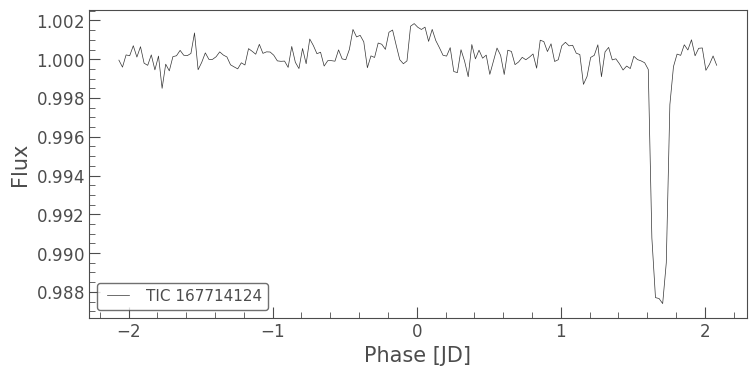

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


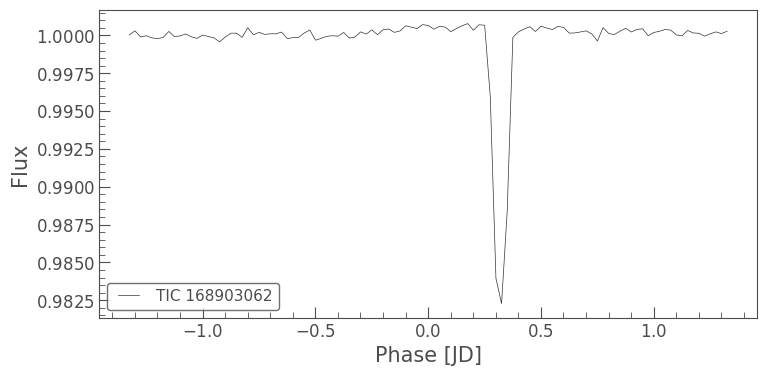

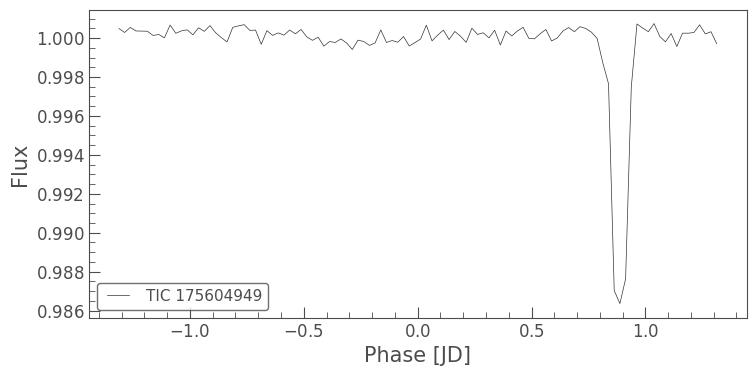

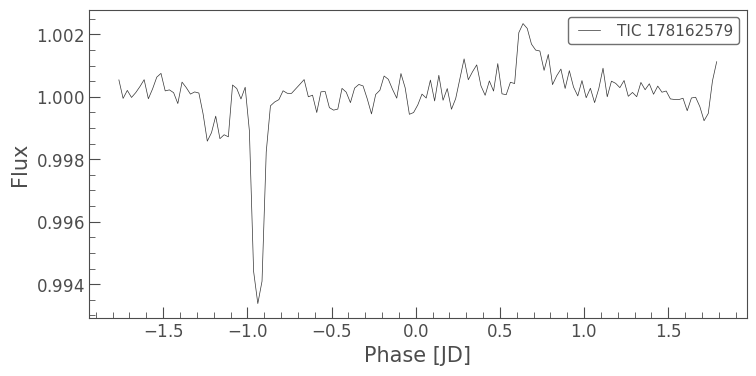

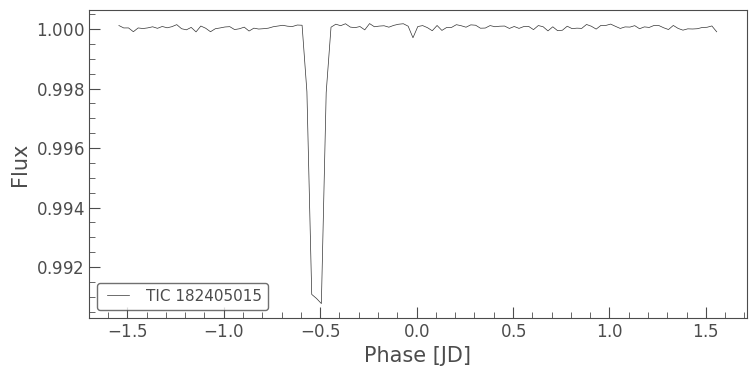

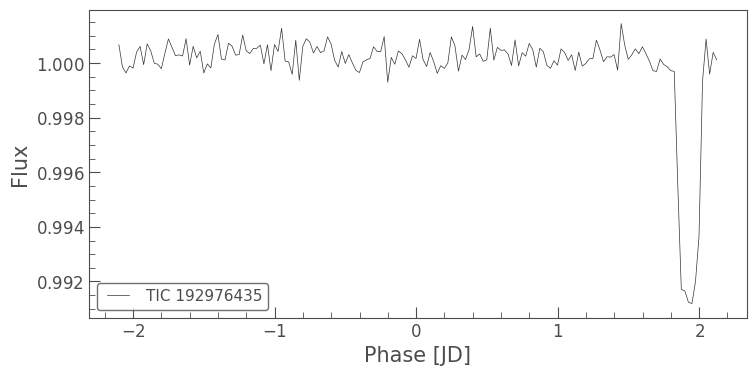

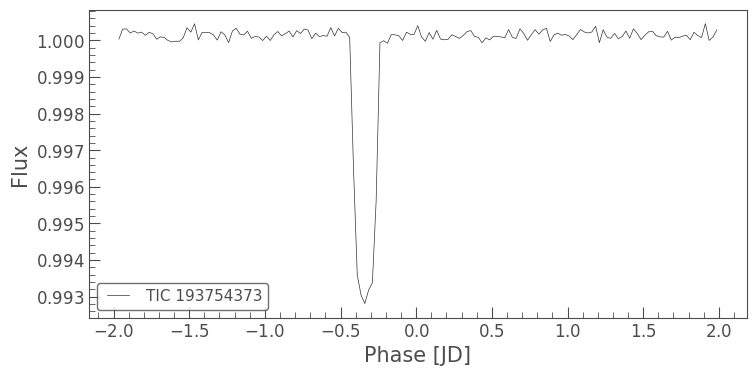

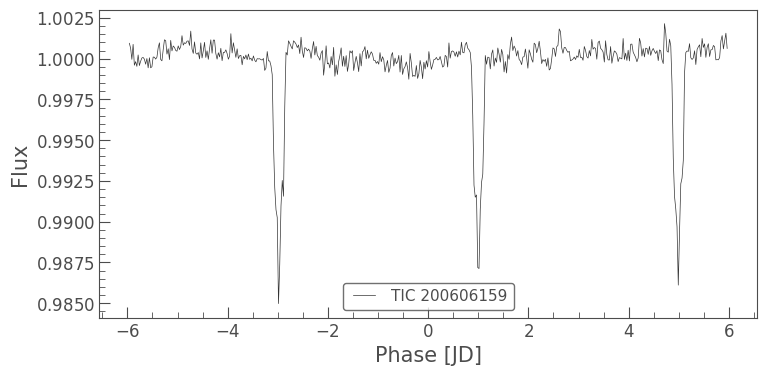

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

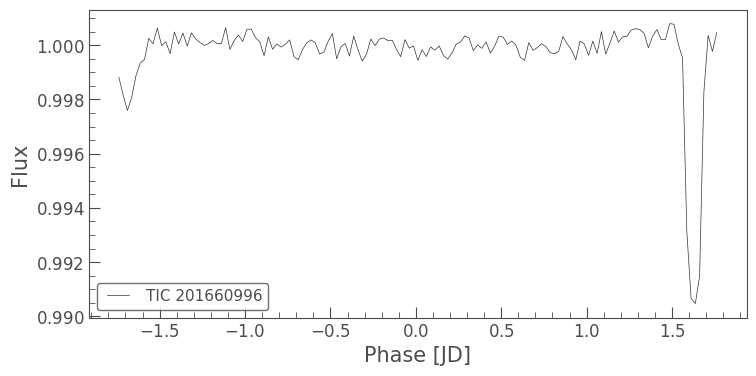

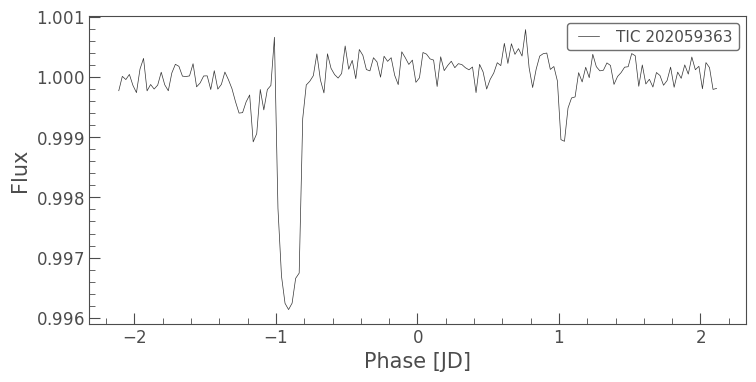

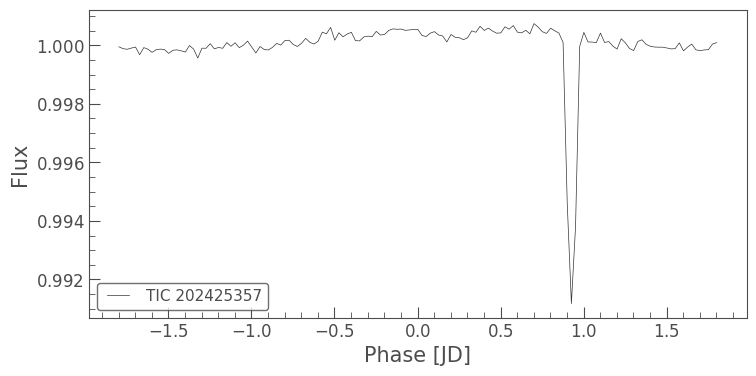

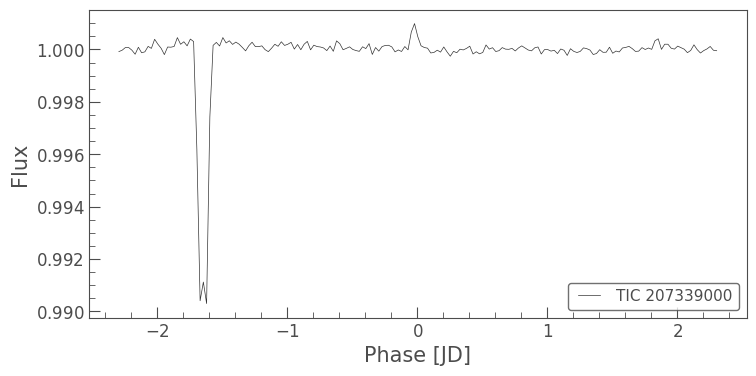

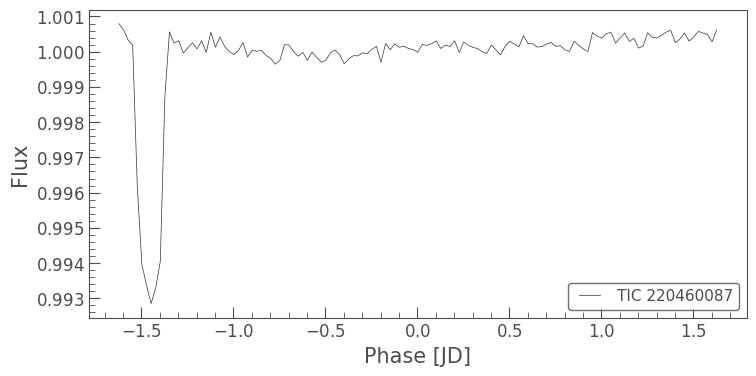

Skipping- Index 12 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam3-ccd4-04721402508488386048_tess_v01/hlsp_t16_tess_ffi_s0001-cam3-ccd4-04721402508488386048_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


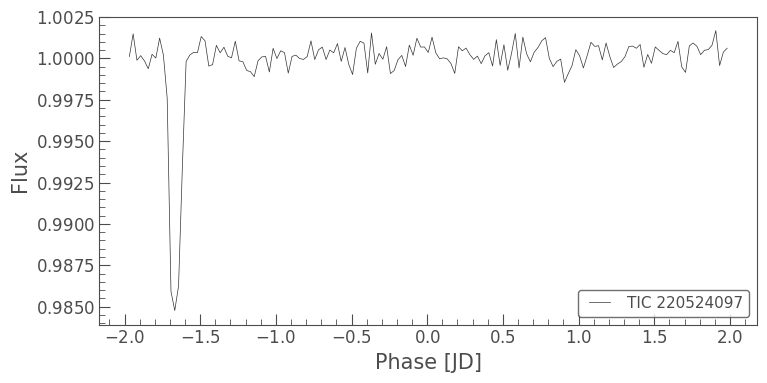

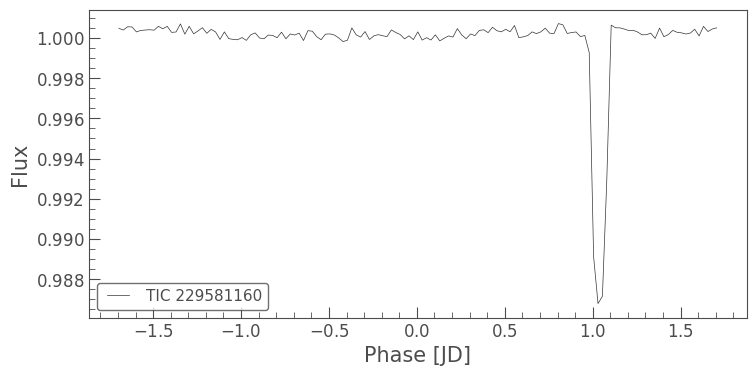

Skipping- Index 99 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000229671380_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000229671380_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


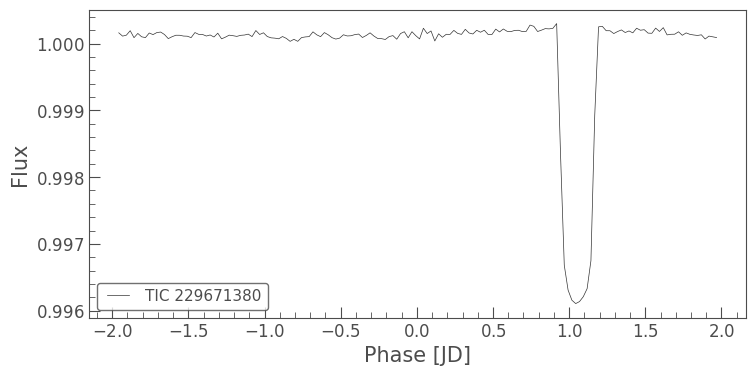

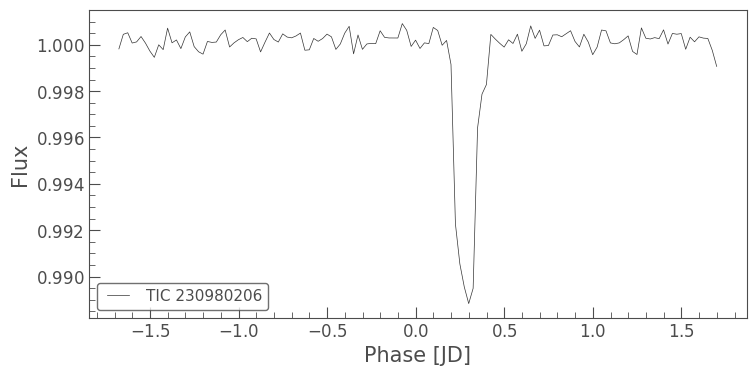

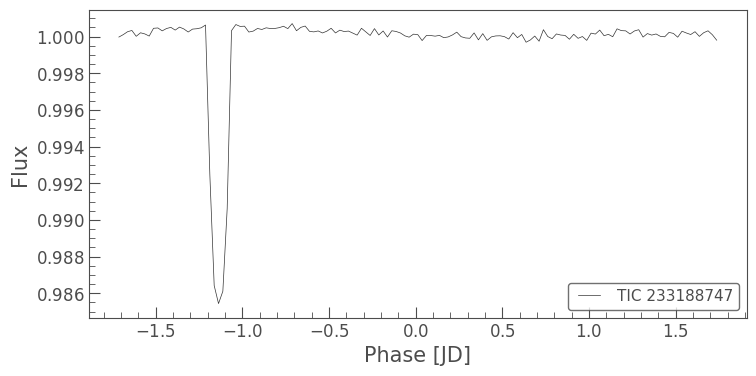

Skipping- Index 21 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000233823679_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000233823679_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


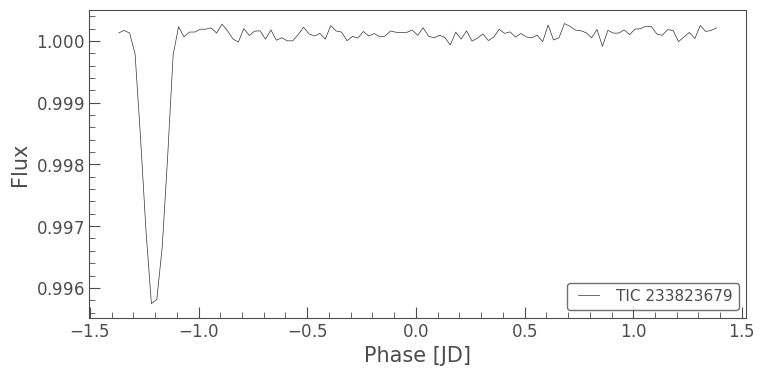

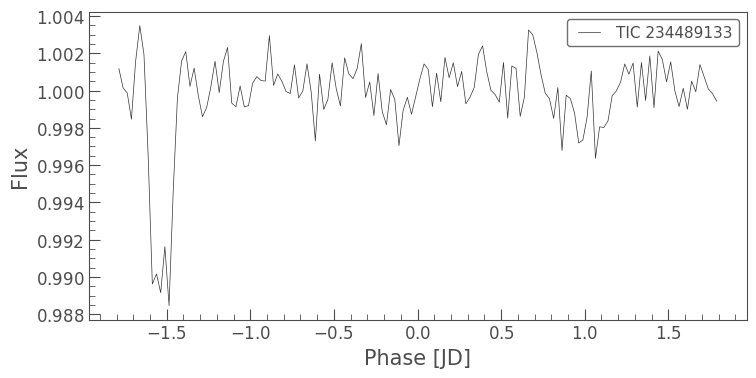

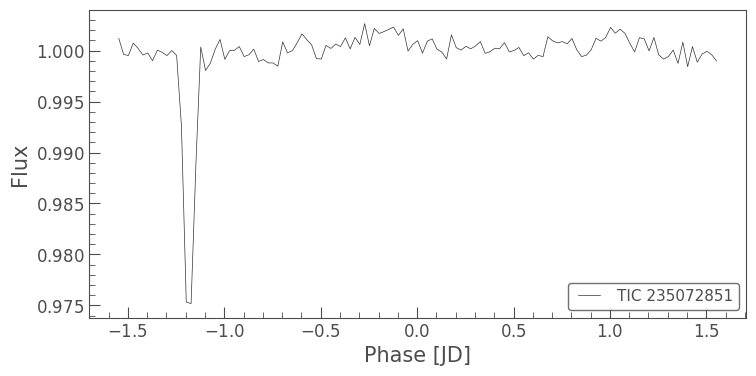

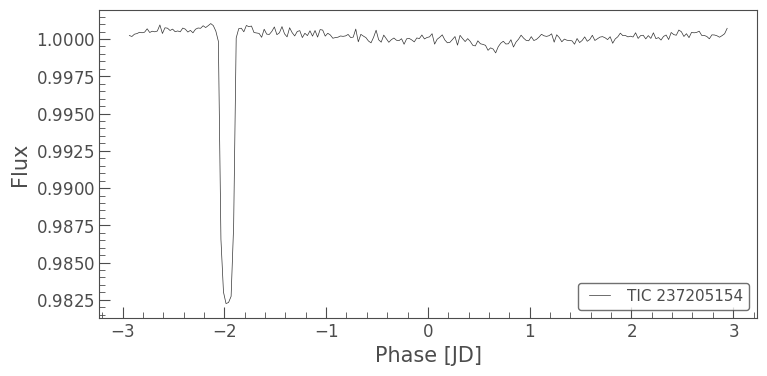

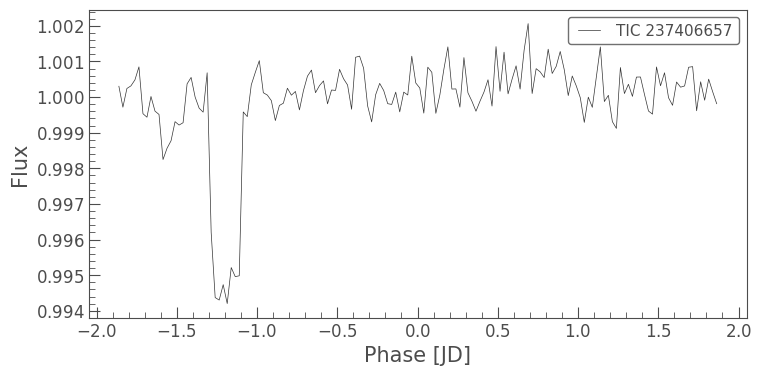

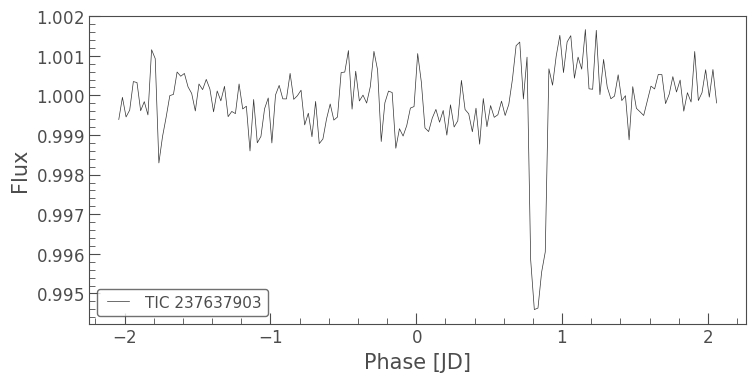

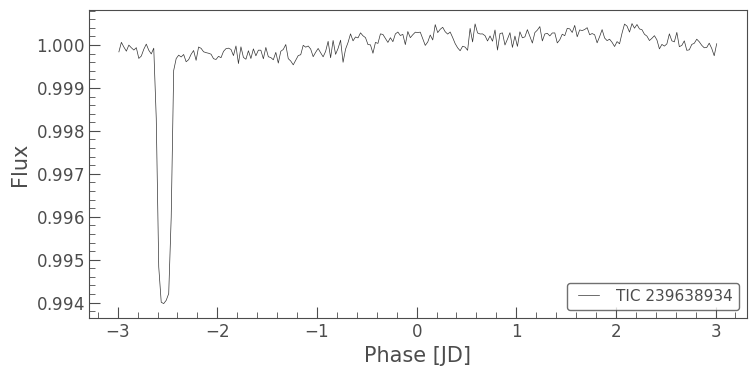

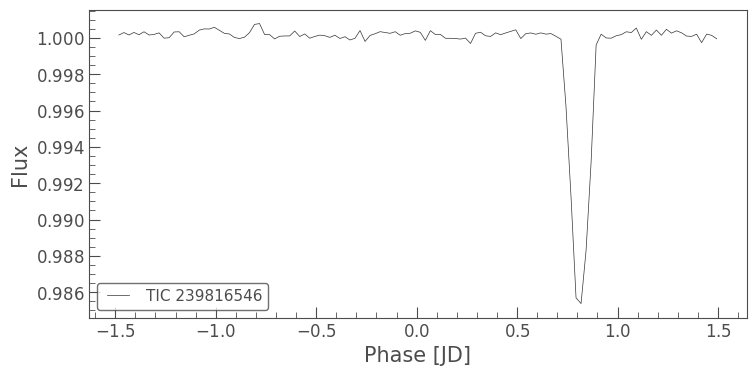

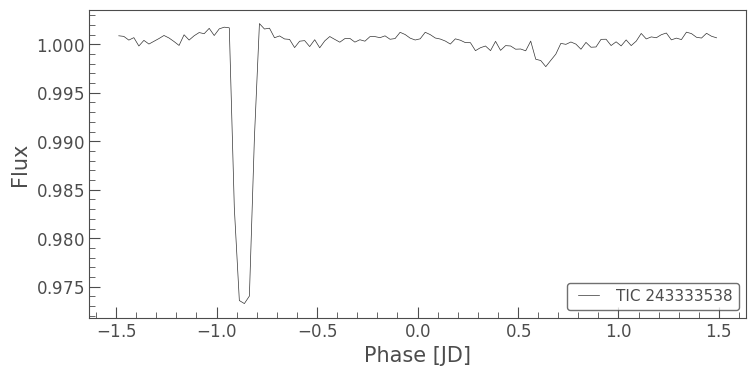

Skipping - No light curves passed SNR threshold for TIC 248655096


<Figure size 640x480 with 0 Axes>

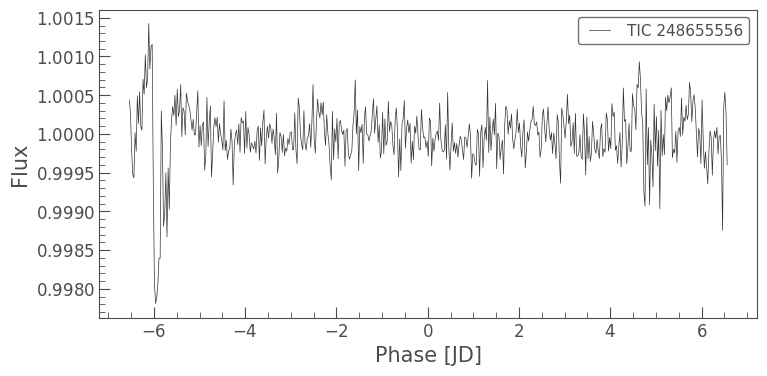

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

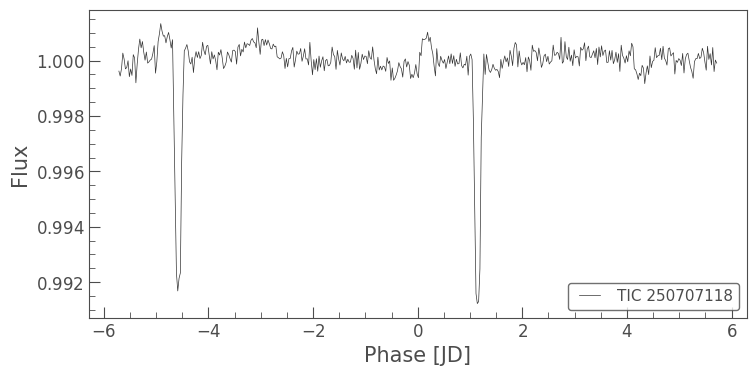

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


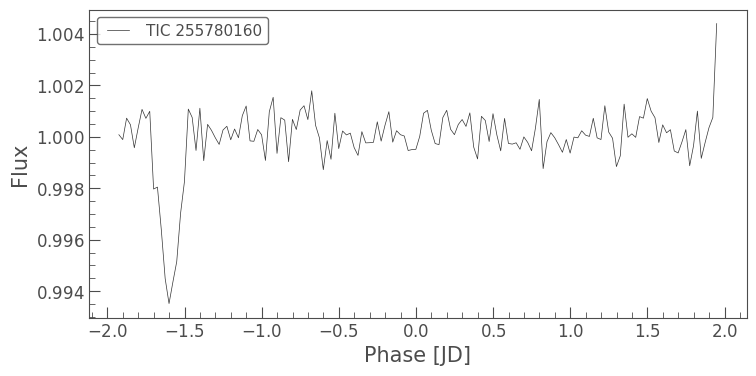

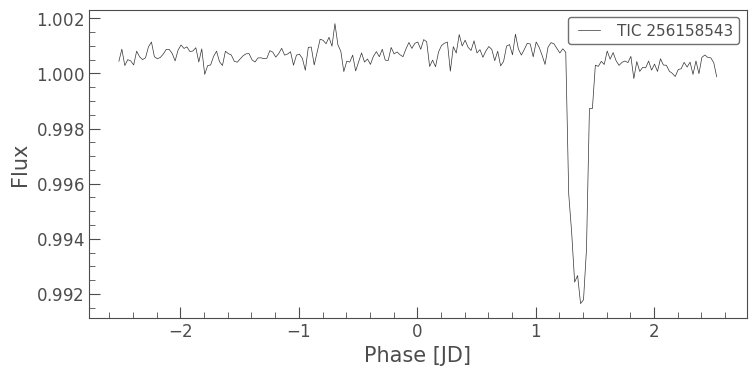

Skipping- Index 59 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000257060897_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000257060897_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


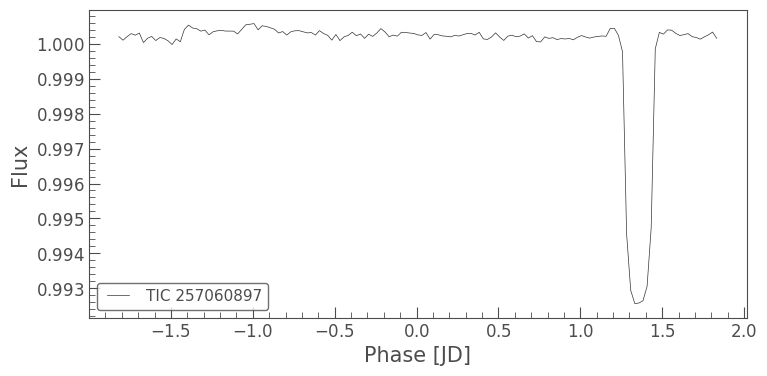

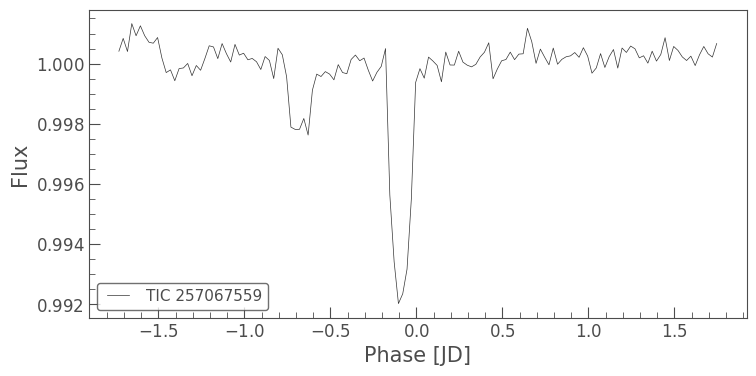

Skipping- Index 102 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000258920431_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000258920431_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


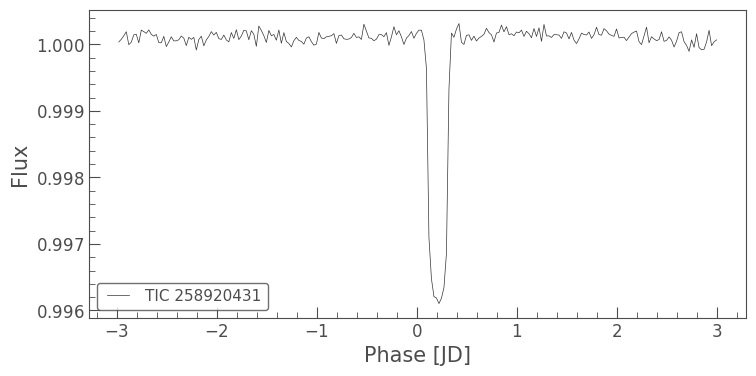

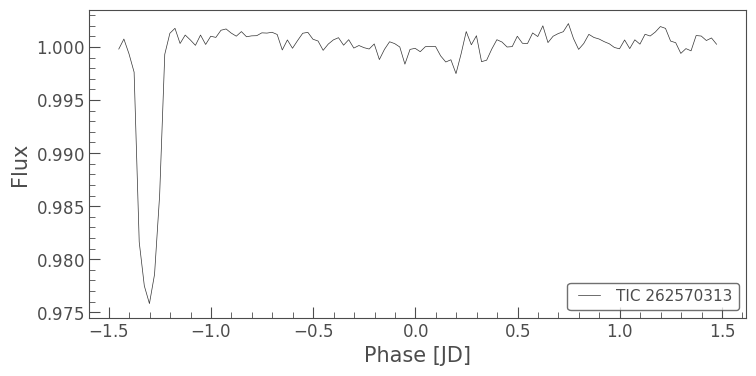

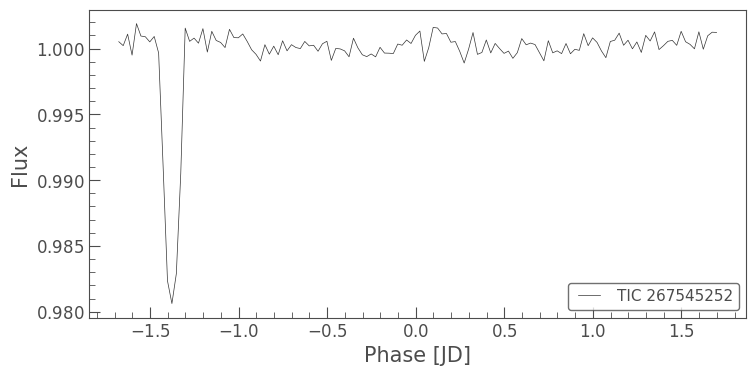

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

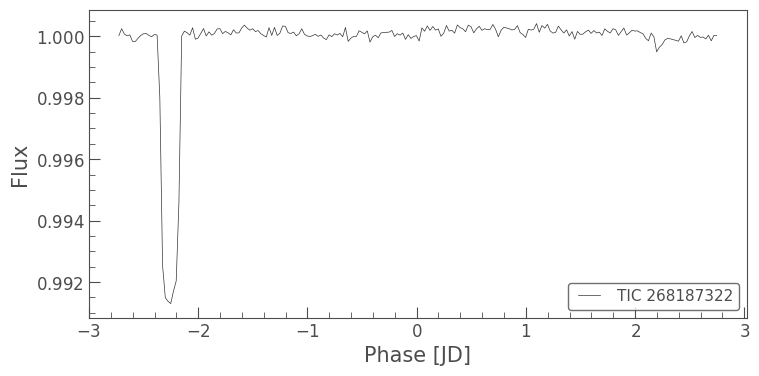

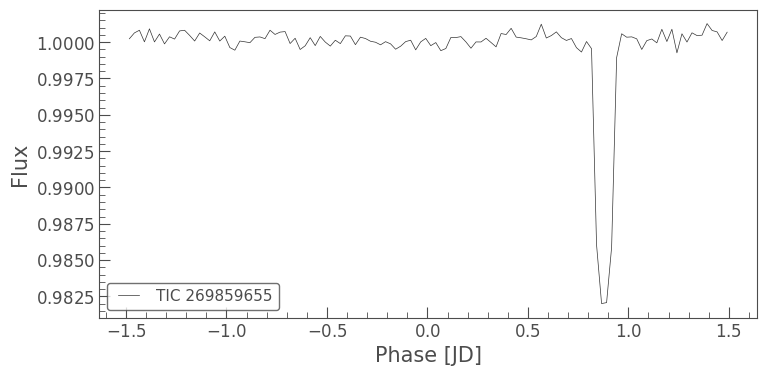

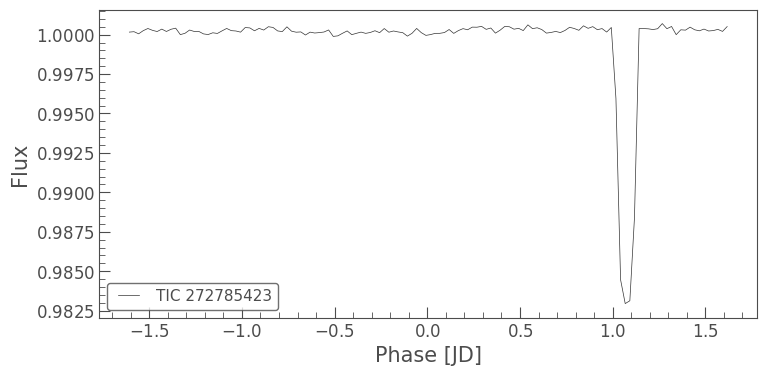

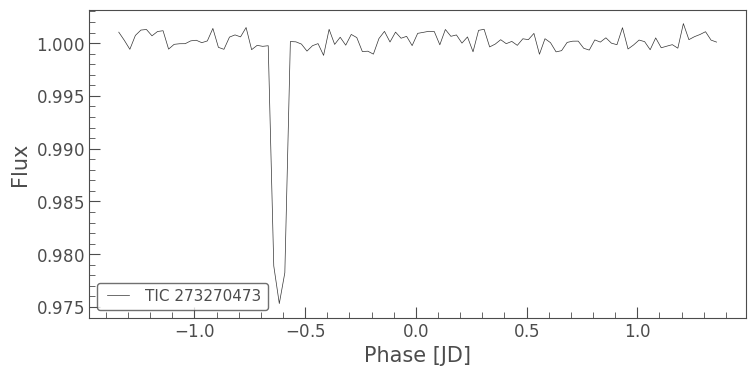

Skipping- Index 28 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05484706570235460608_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05484706570235460608_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


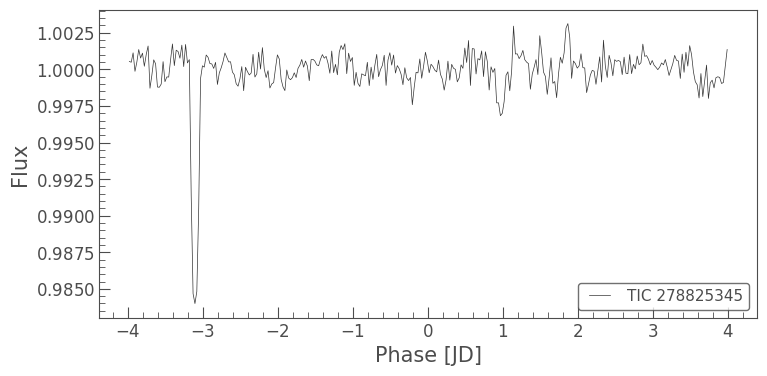

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

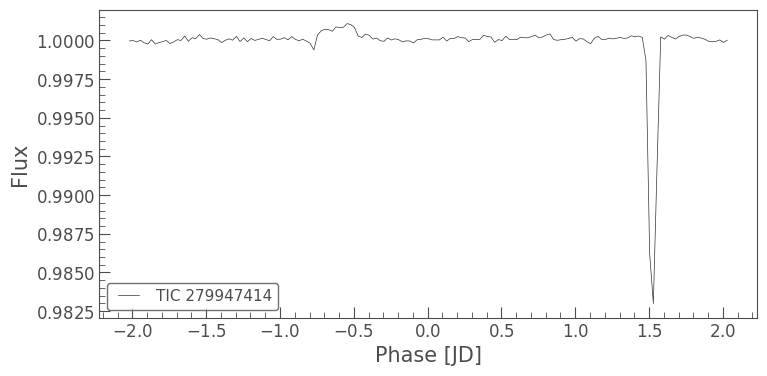

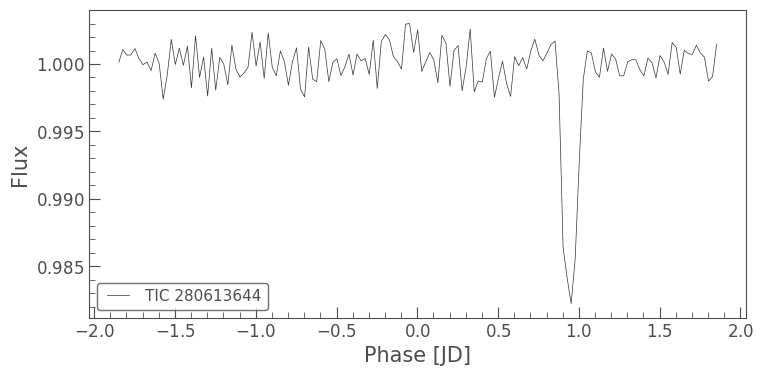

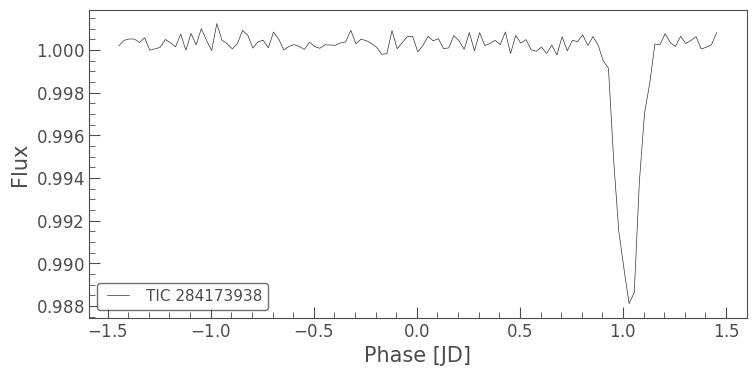

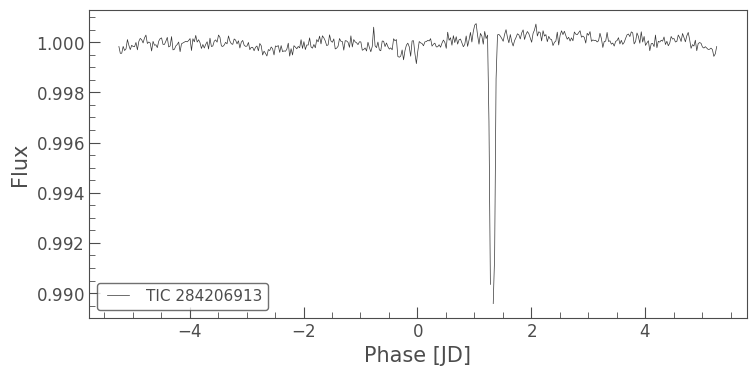

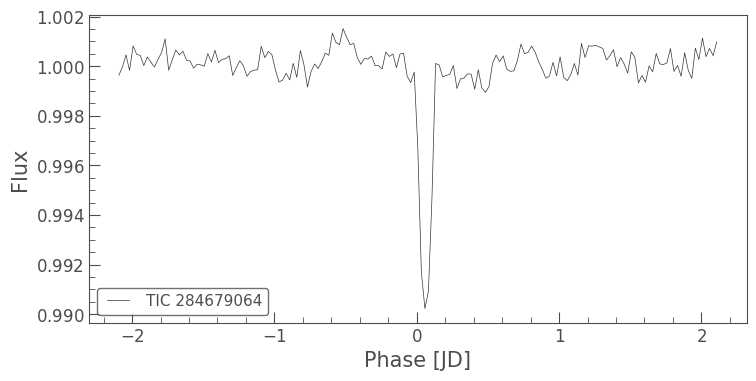

Skipping - No light curves passed SNR threshold for TIC 284706890


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


<Figure size 640x480 with 0 Axes>

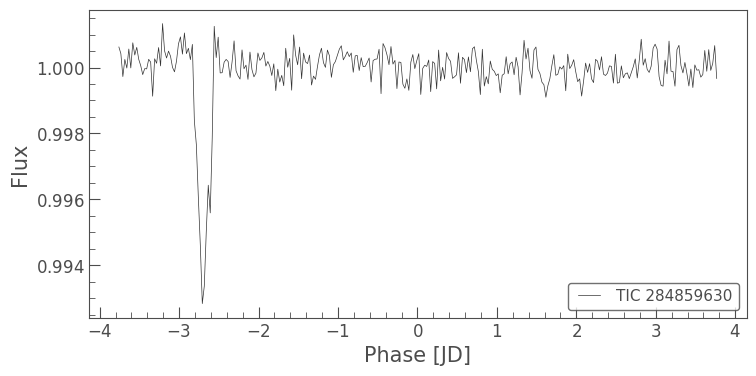

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

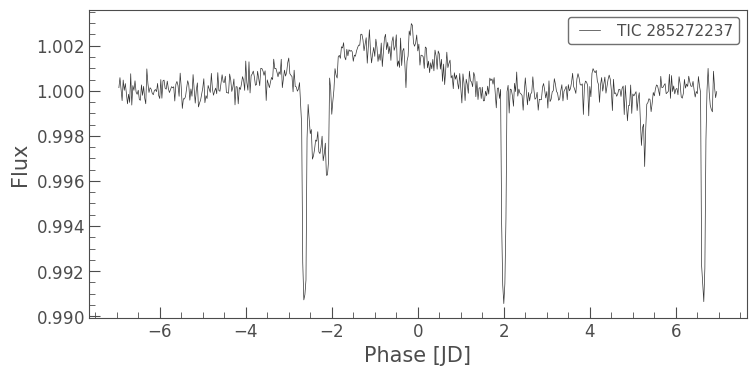

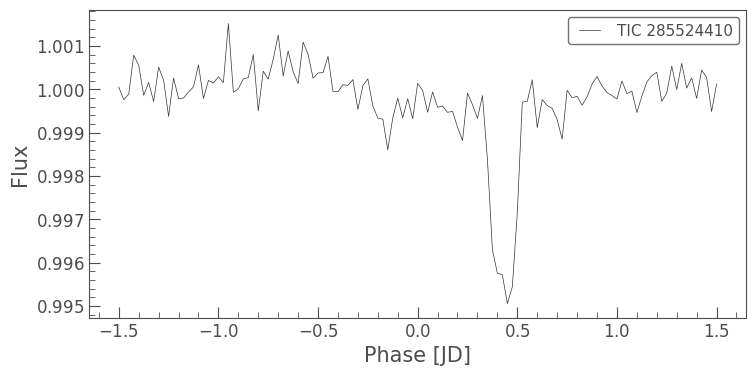

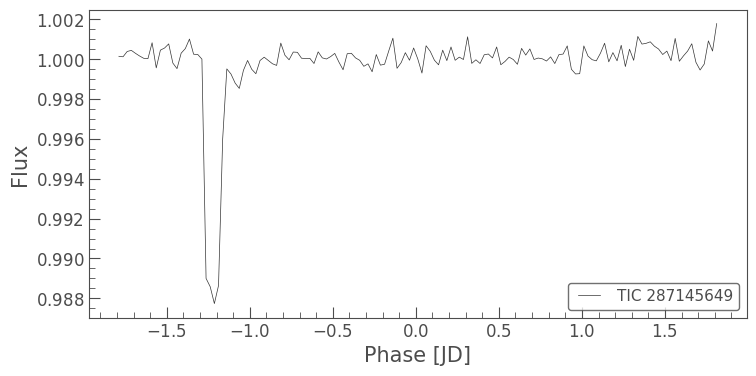

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

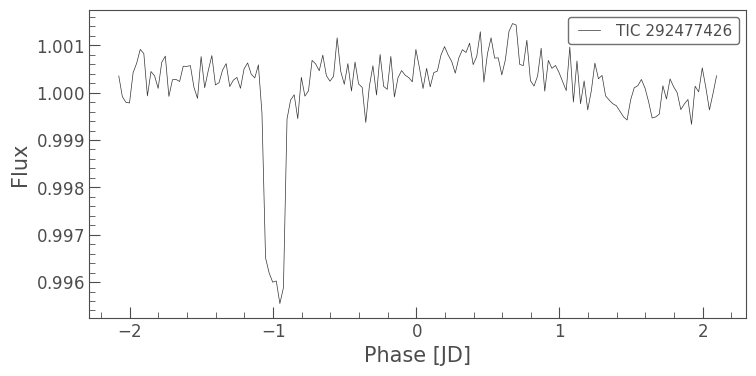

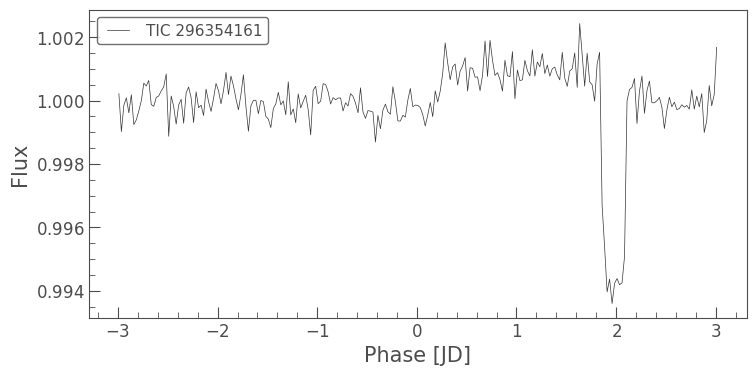

Skipping- Index 63 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05268854433200639488_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05268854433200639488_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


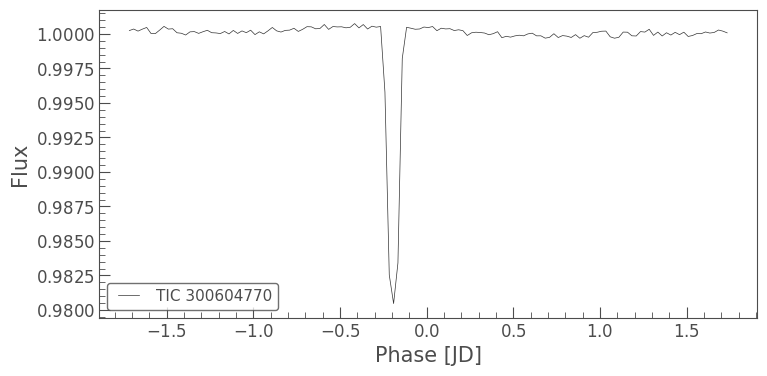

Skipping- Index 22 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000302381397_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000302381397_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


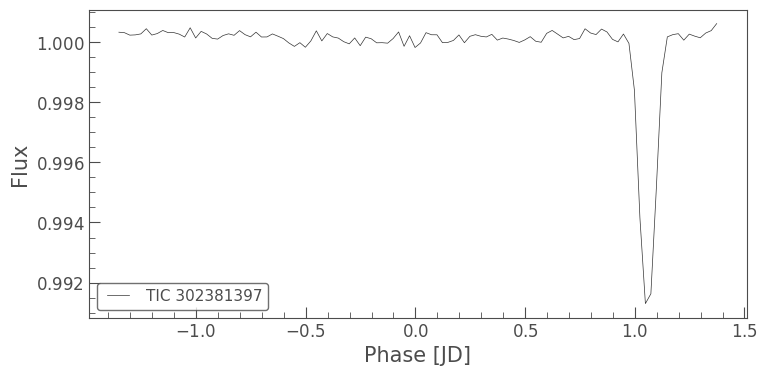

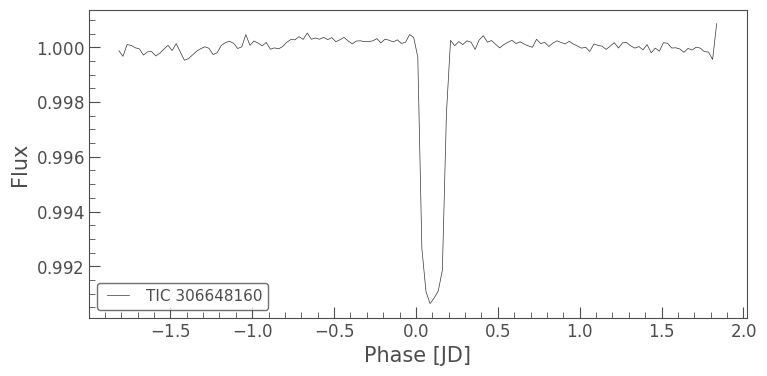

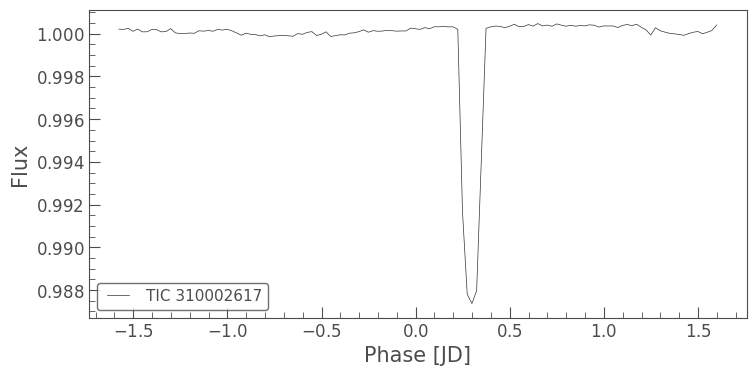

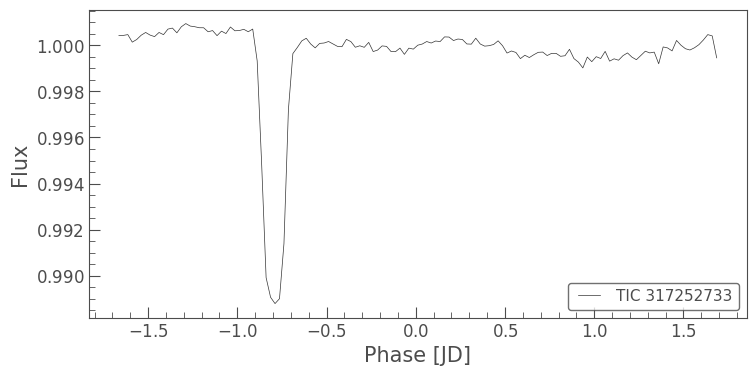

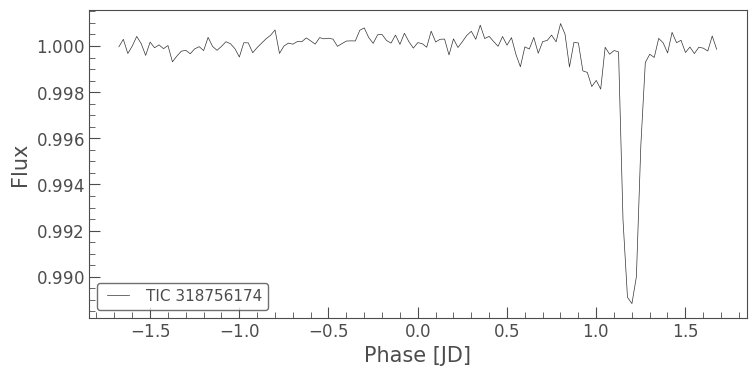

Skipping - No light curves passed SNR threshold for TIC 323194443


<Figure size 640x480 with 0 Axes>

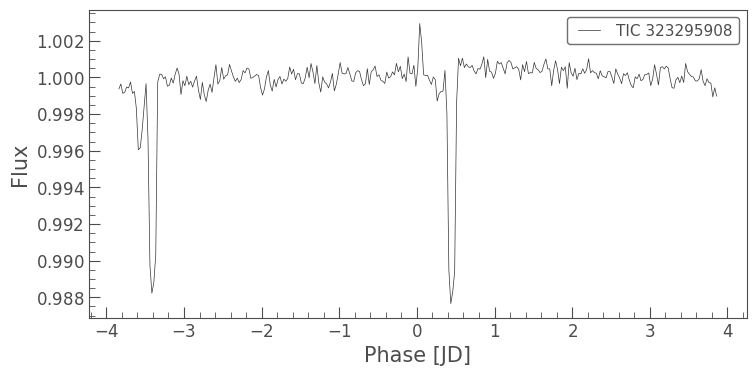

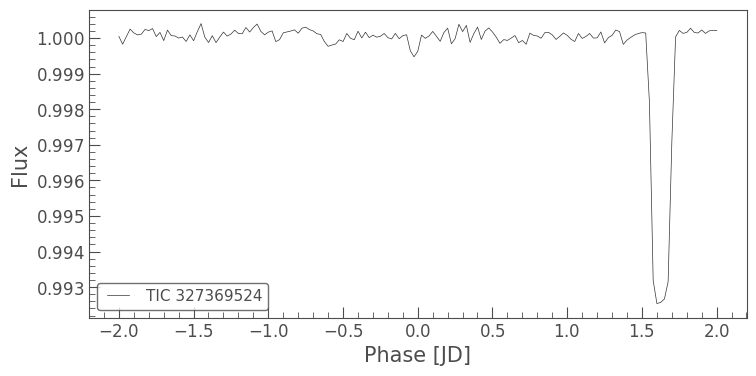

Skipping- Index 29 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000328814605_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000328814605_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


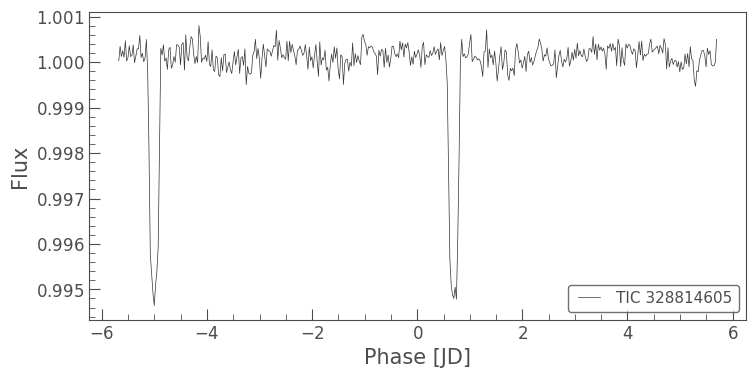

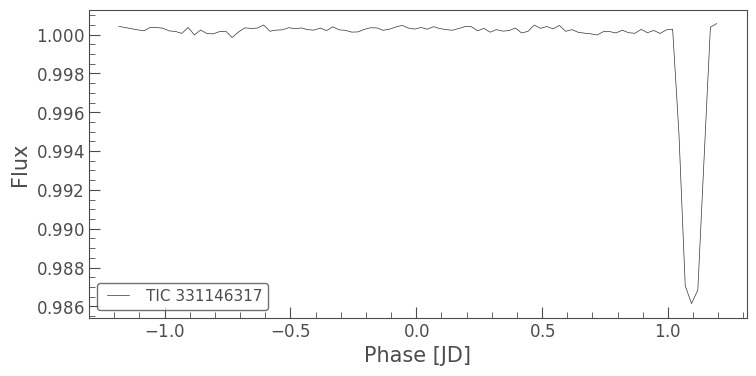

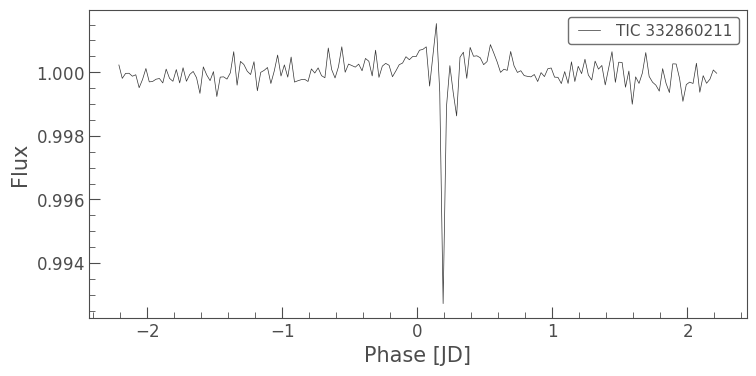

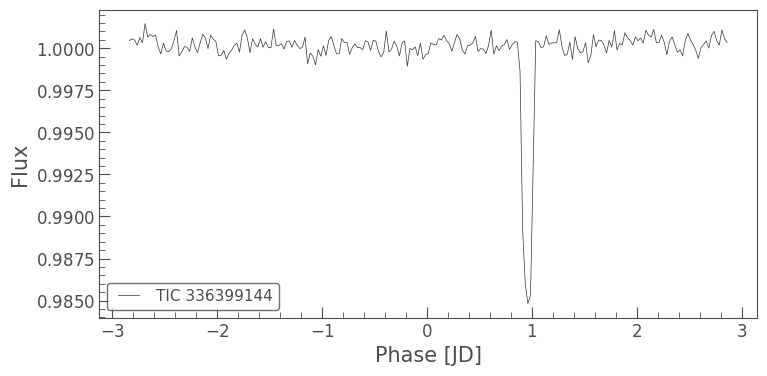

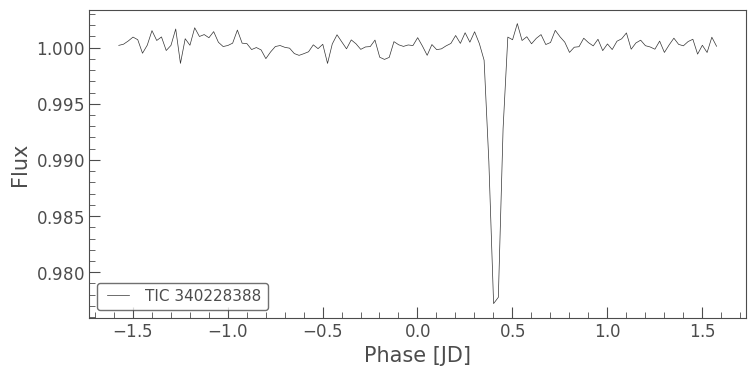

Skipping - No light curves passed SNR threshold for TIC 343933335


<Figure size 640x480 with 0 Axes>

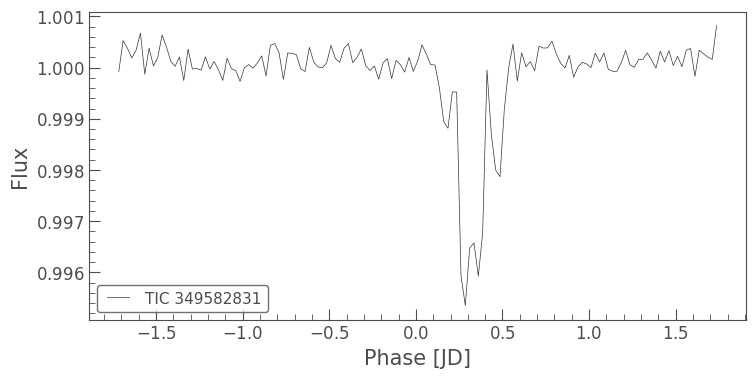

Skipping- Index 65 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04759957330393171072_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04759957330393171072_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


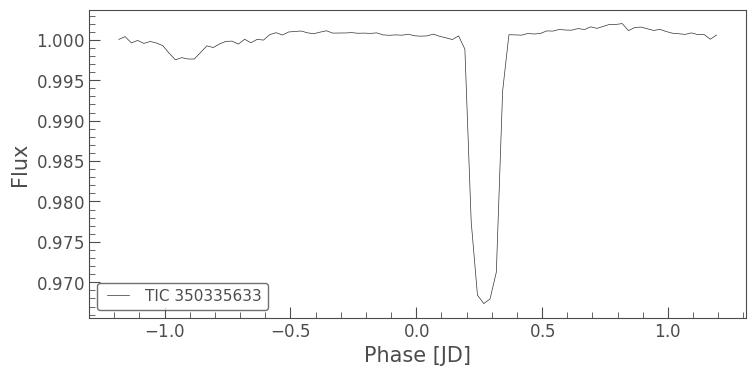

Skipping - No light curves passed SNR threshold for TIC 353960022


<Figure size 640x480 with 0 Axes>

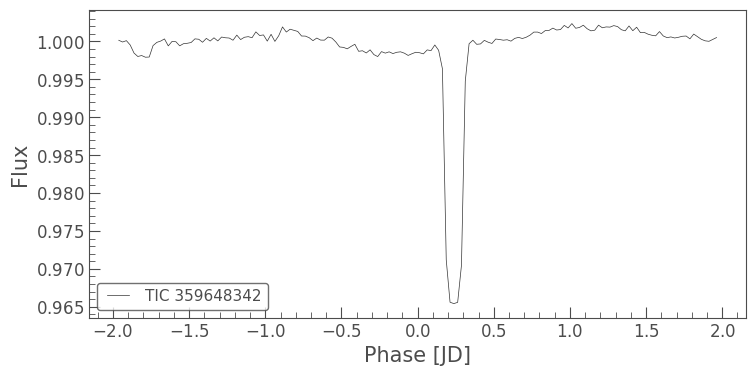

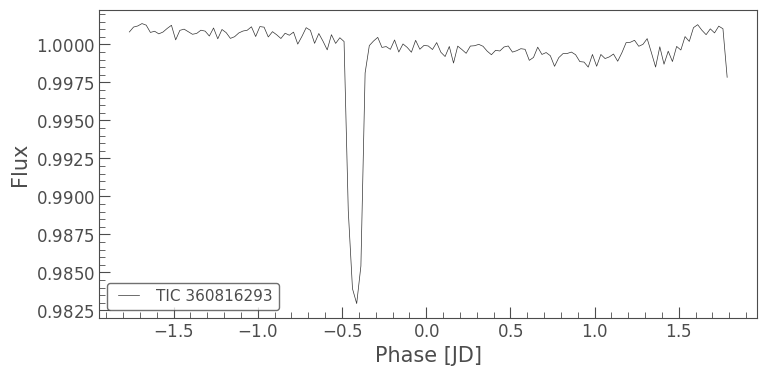

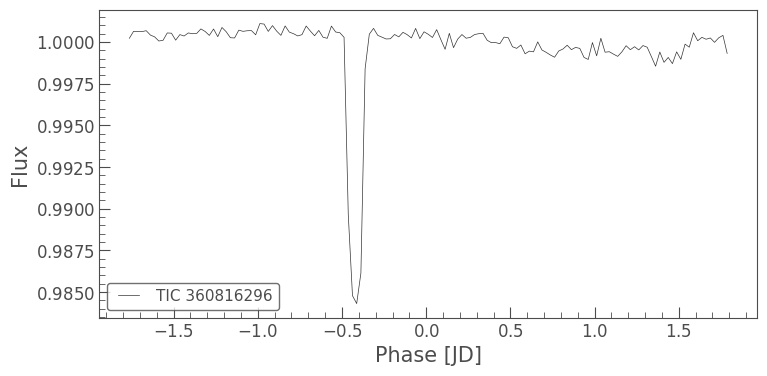

Skipping- Index 12 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam3-ccd4-04671757290751410816_tess_v01/hlsp_t16_tess_ffi_s0001-cam3-ccd4-04671757290751410816_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


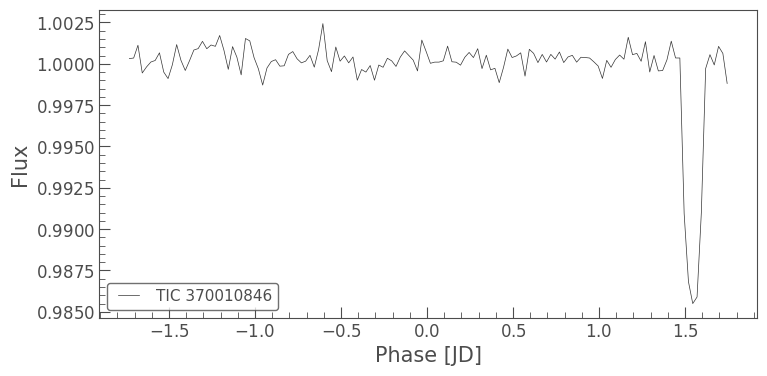

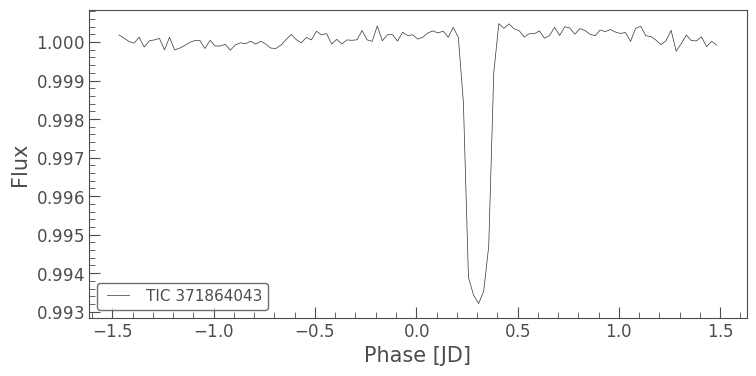

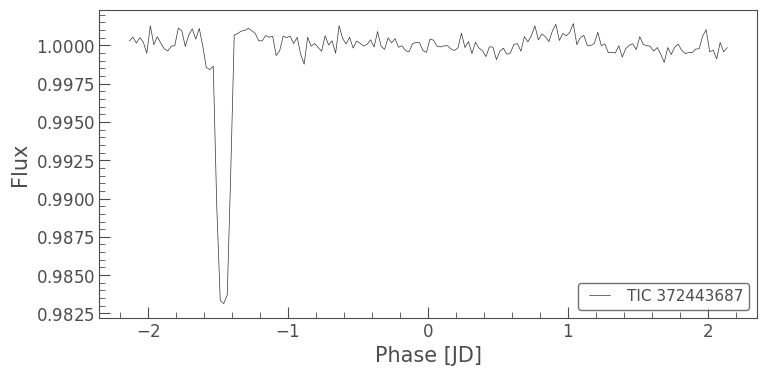

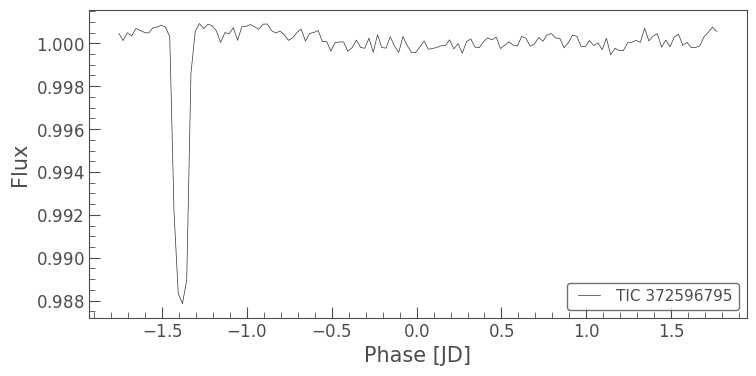

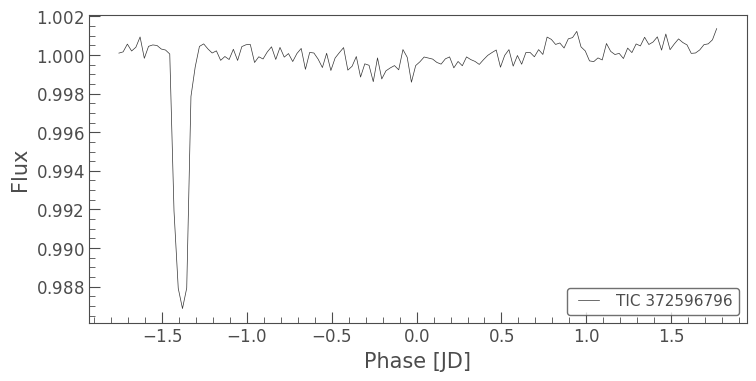

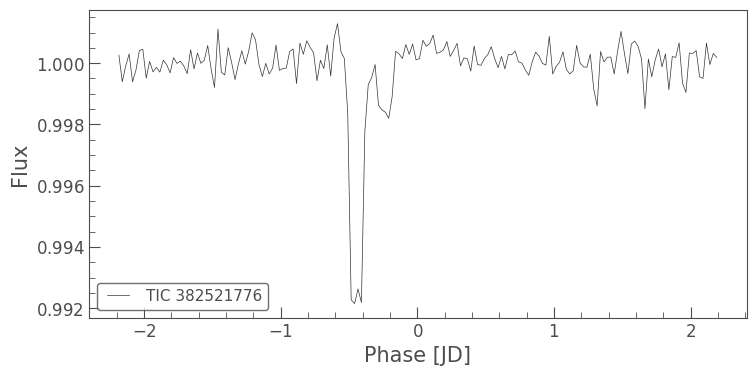

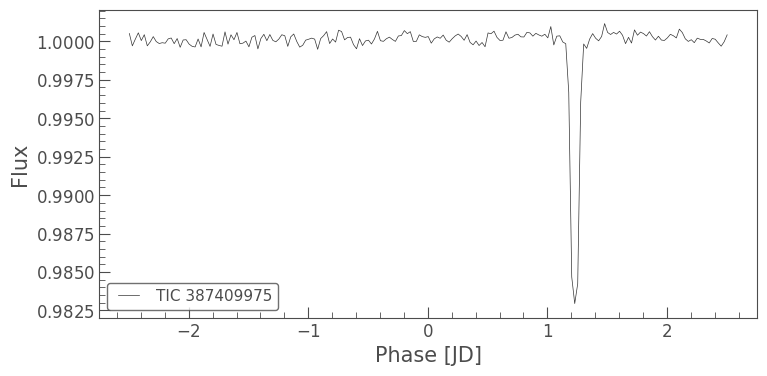

Skipping- Index 23 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam3-ccd3-04619775061049918464_tess_v01/hlsp_t16_tess_ffi_s0001-cam3-ccd3-04619775061049918464_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


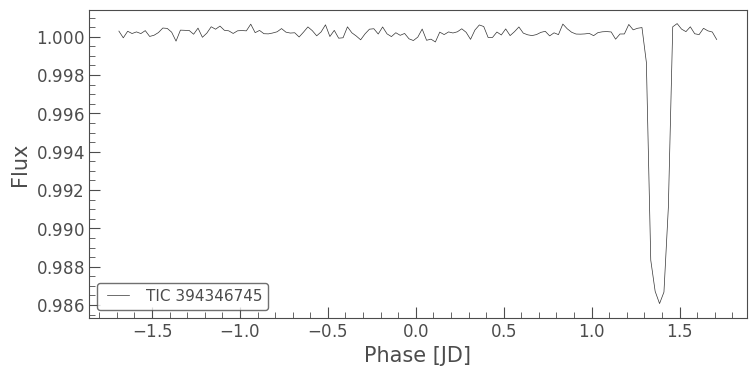

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


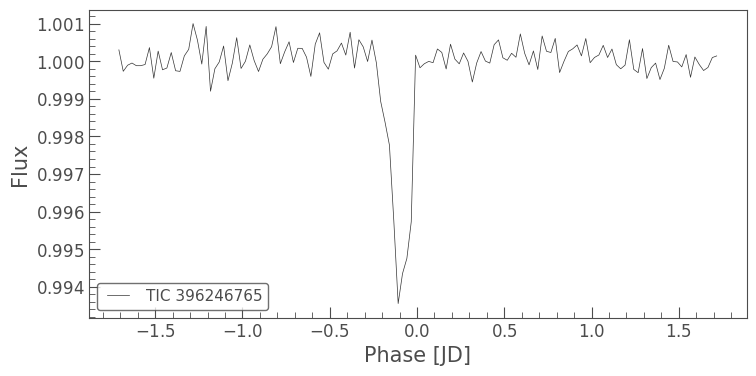

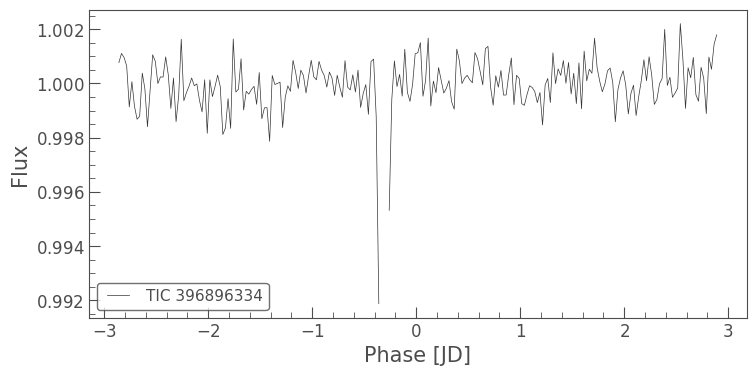

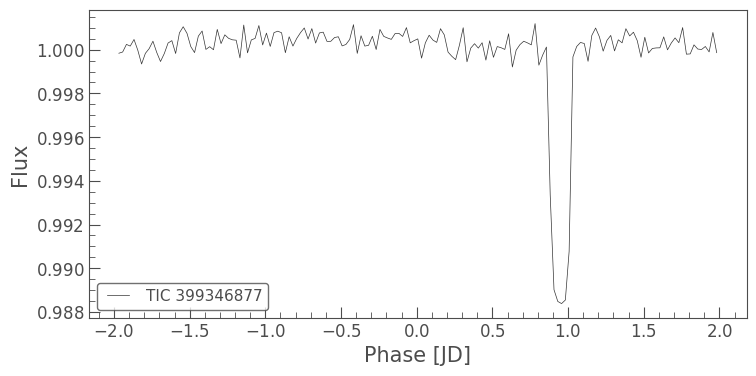

Skipping- Index 22 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000400103802_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000400103802_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


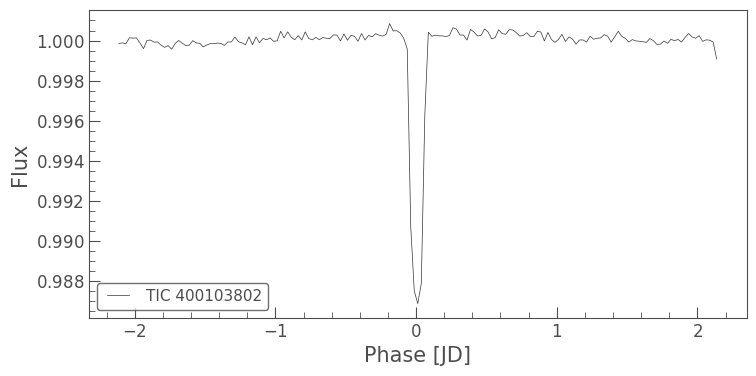

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

Skipping- Index 46 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000400432230_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000400432230_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

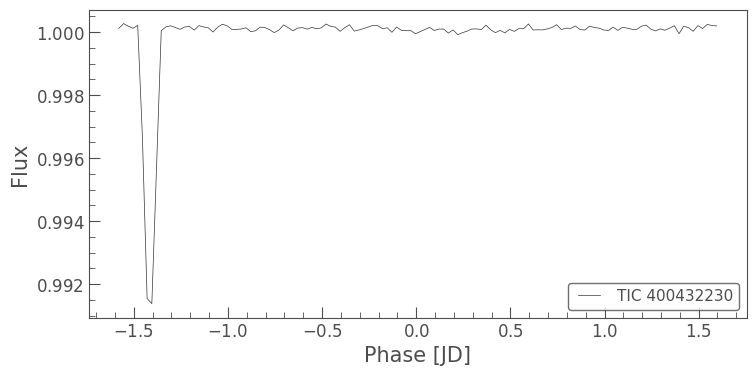

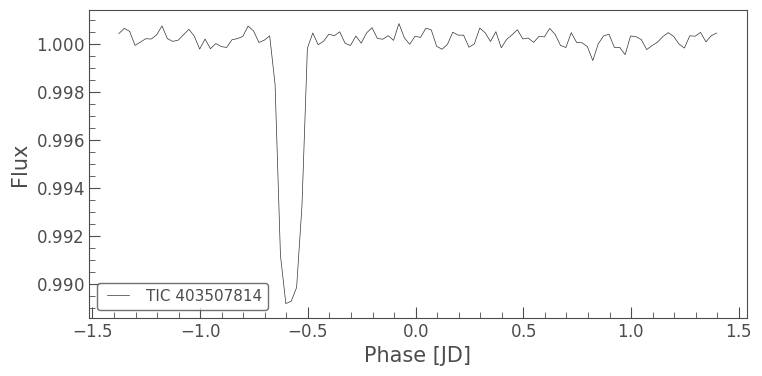

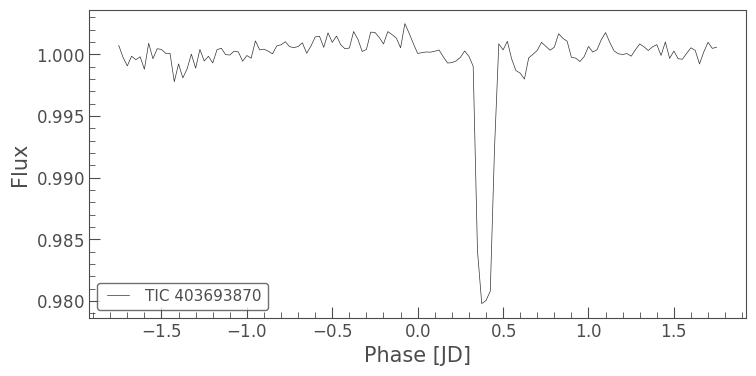

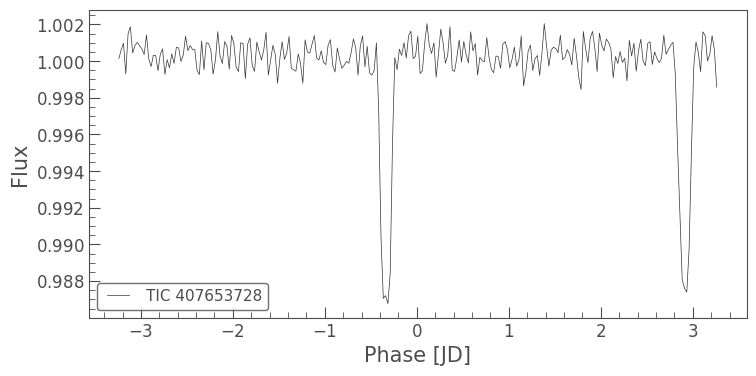

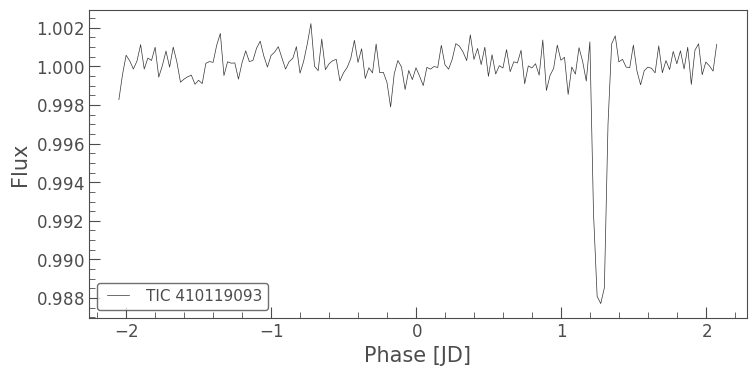

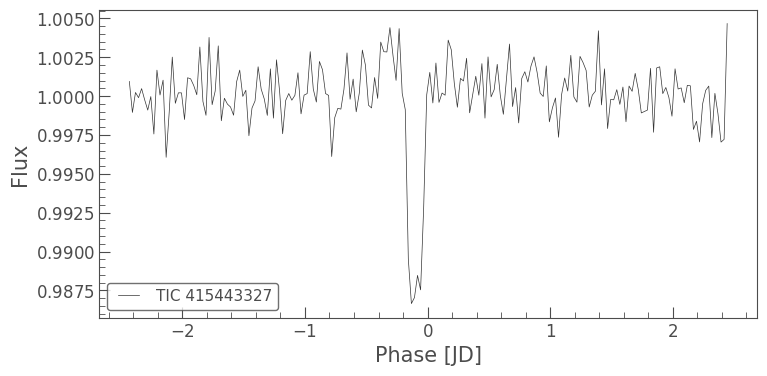

Skipping- Index 18 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000417646390_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000417646390_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


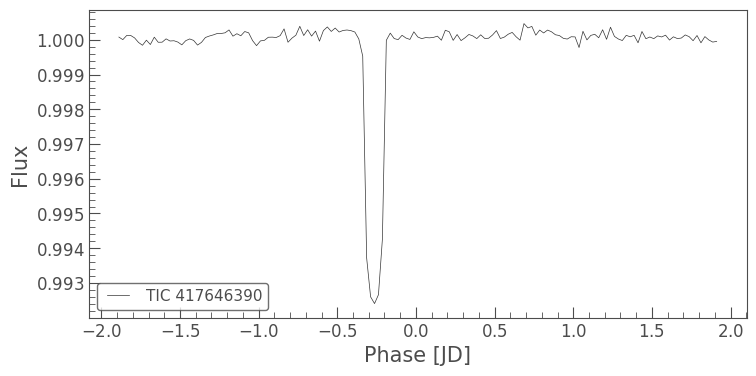

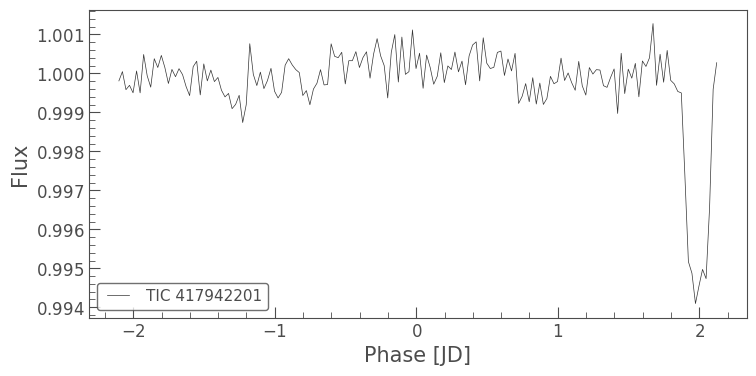

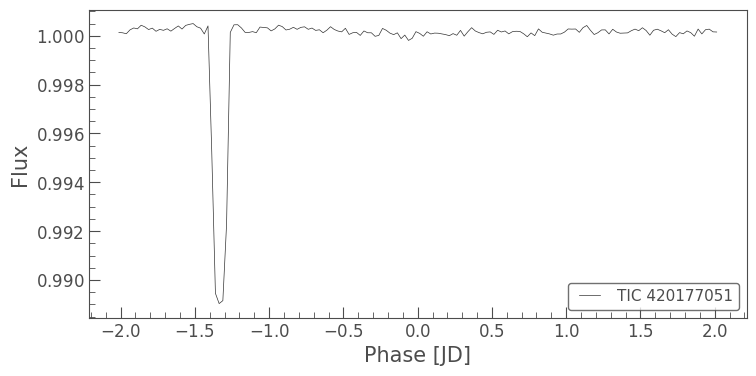

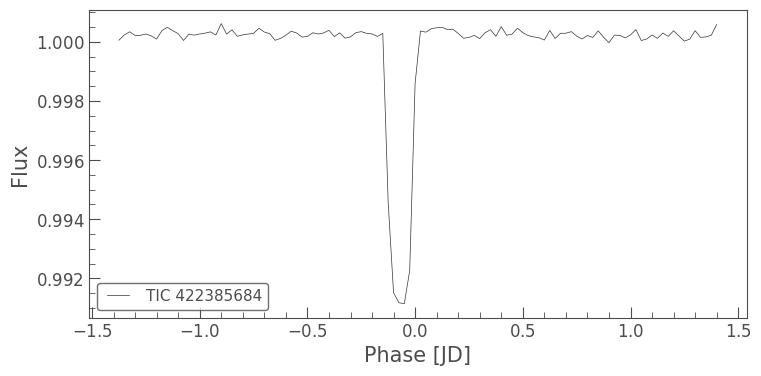

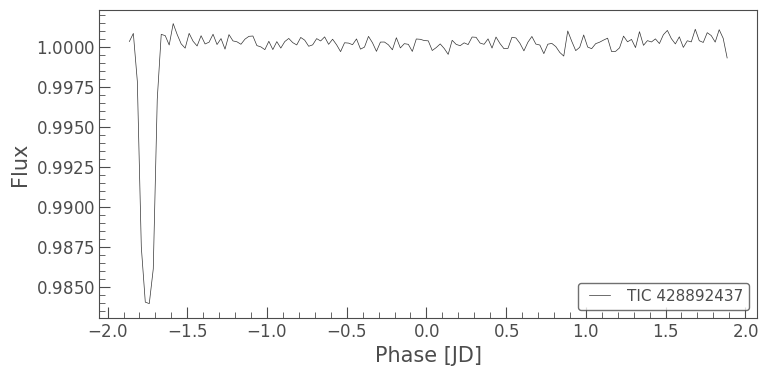

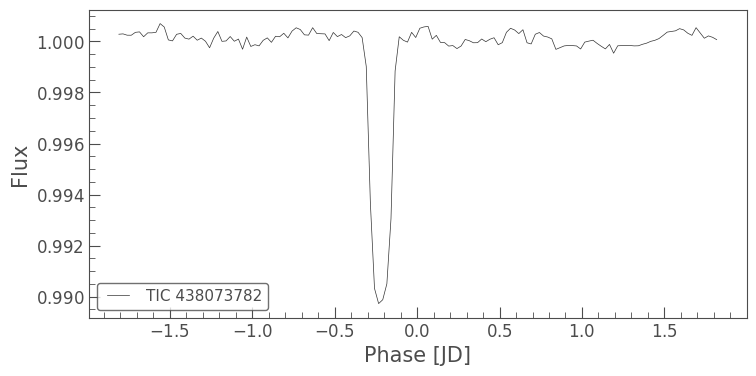

Skipping- Index 1 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam1-ccd3-06814649446912859904_tess_v01/hlsp_t16_tess_ffi_s0001-cam1-ccd3-06814649446912859904_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


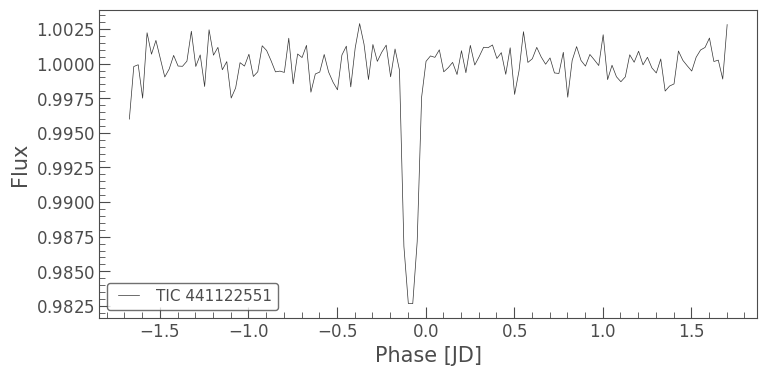

Skipping- Index 4 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam1-ccd3-06618938954148736000_tess_v01/hlsp_t16_tess_ffi_s0001-cam1-ccd3-06618938954148736000_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


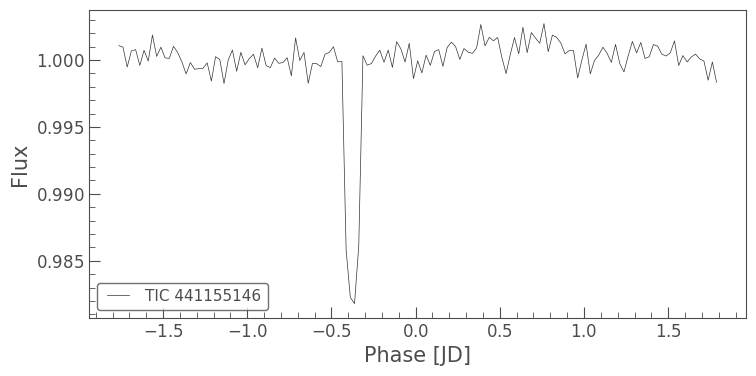

Skipping- Index 6 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam1-ccd4-06779228164430422400_tess_v01/hlsp_t16_tess_ffi_s0001-cam1-ccd4-06779228164430422400_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


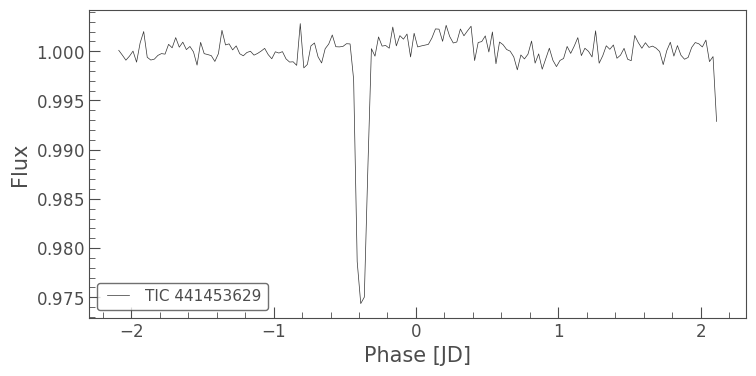

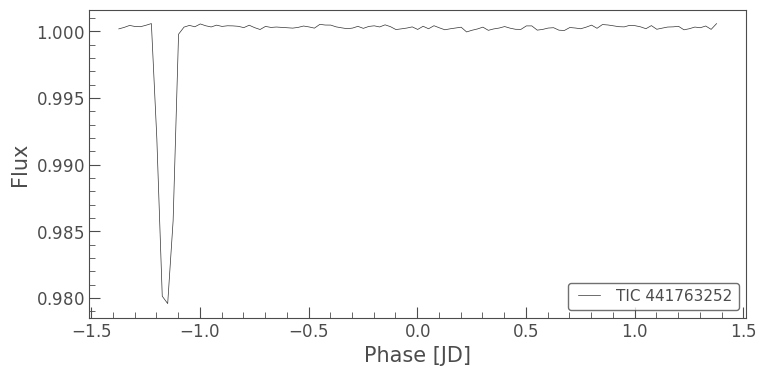

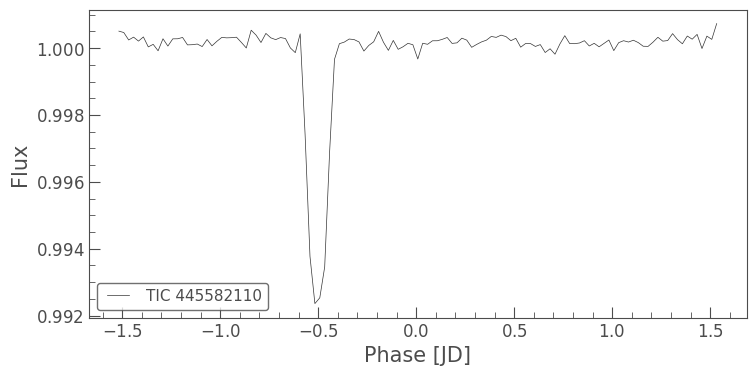

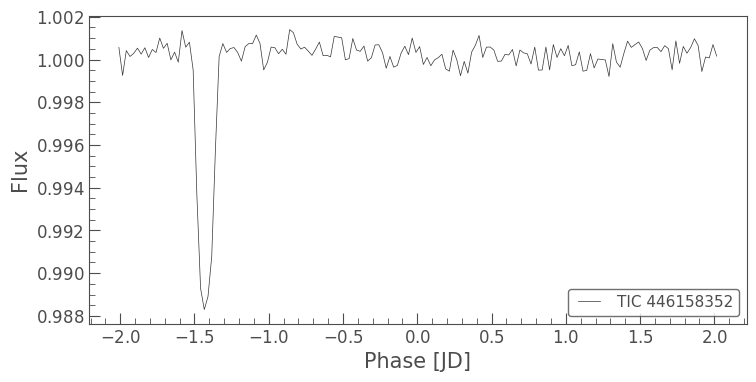

Skipping - No light curves passed SNR threshold for TIC 452810326


<Figure size 640x480 with 0 Axes>

Skipping - No light curves passed SNR threshold for TIC 452810327


<Figure size 640x480 with 0 Axes>

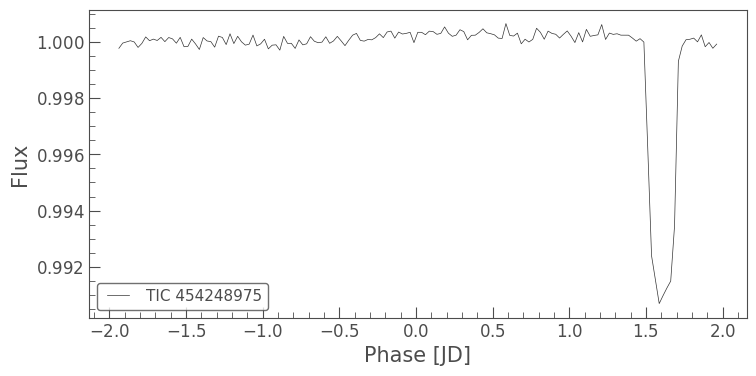

Skipping - No light curve sectors found for TIC 455006978


<Figure size 640x480 with 0 Axes>

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

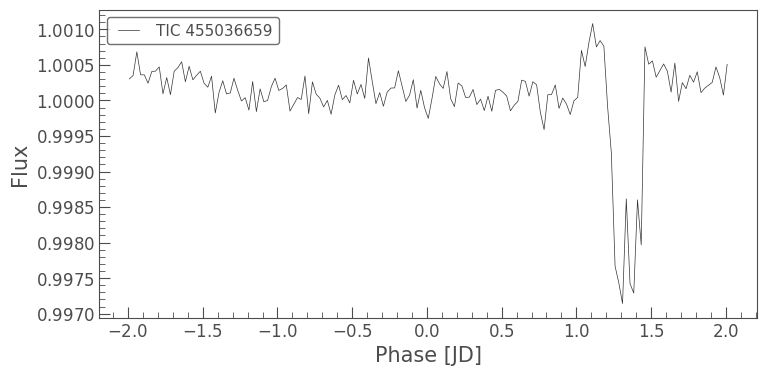

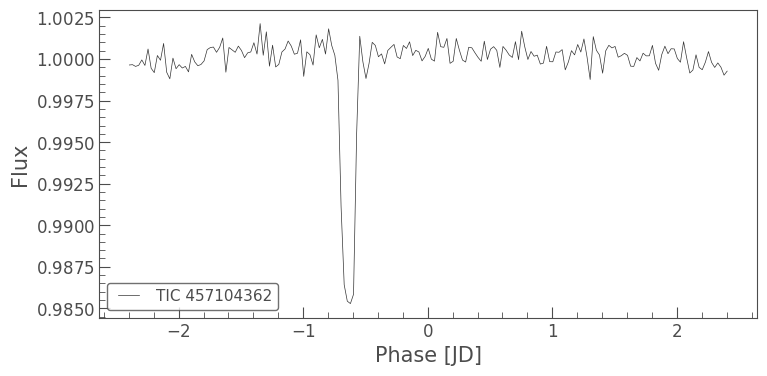

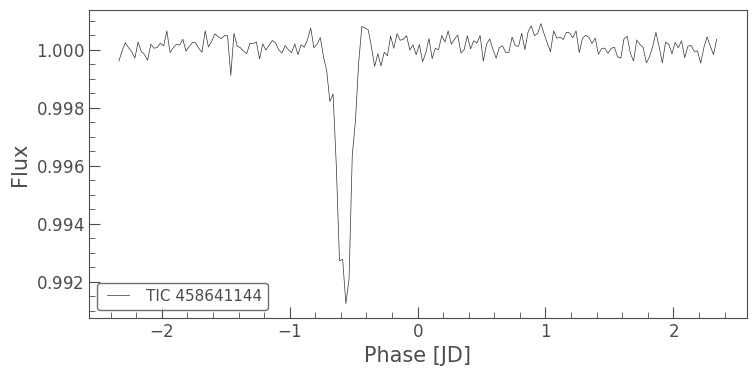

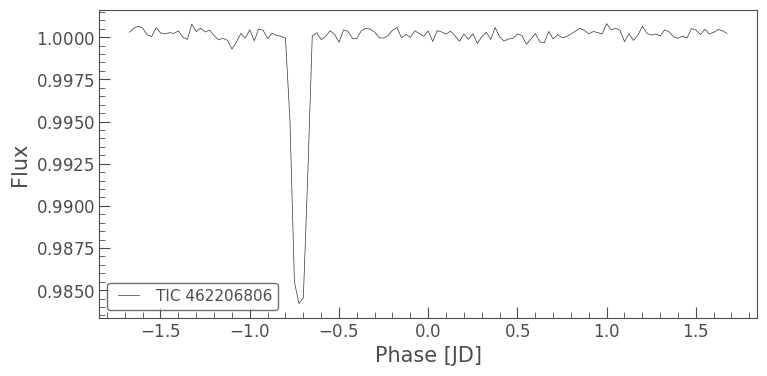

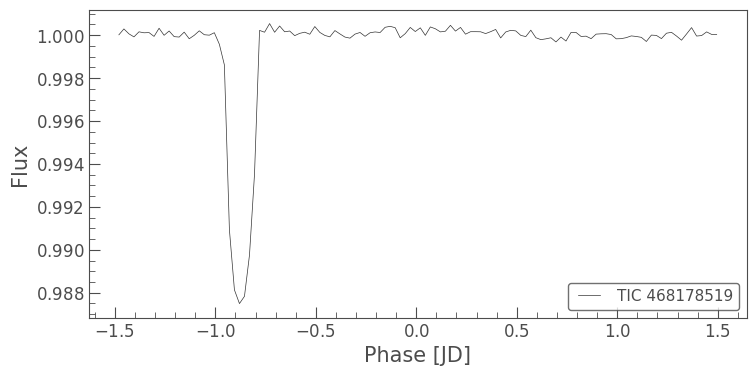

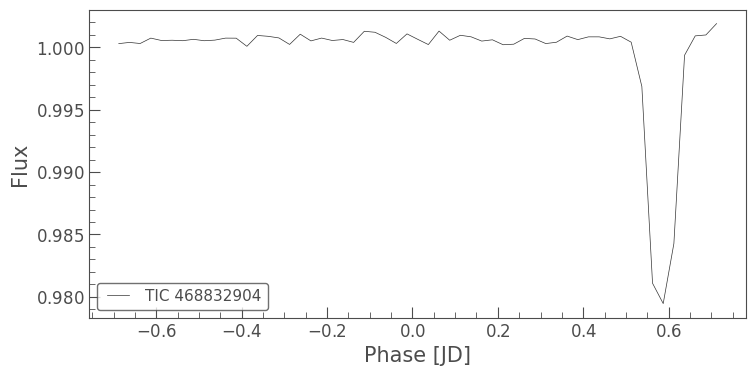

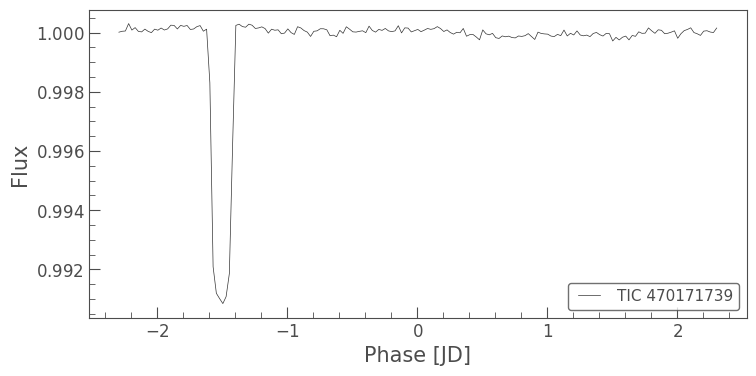

In [17]:
# Find, plot and save the light curves for the planetary signal data
planet_lc = []
for i,TIC_IDs in enumerate(df_planets_175['TIC']):
  time,flux = find_and_plot_LC(str(TIC_IDs), df_planets_175['P_orb_d'][i],  df_planets_175['Dur_h'][i])
  planet_lc.append({'label' : 0, 'tic': TIC_IDs, 'time': time, 'flux': flux})
  plt.savefig(f"training_images/planets/pl_curve_{i}.png", dpi=150)
  plt.show()

In [19]:
# Upload the csv file with the data for the binary signal and puts it into a pandas dataframe
uploaded = files.upload()
df_binaries = pd.read_csv("TESS_Binary_Data.csv")
df_binaries_175 = df_binaries.head(175)

Saving TESS_Binary_Data.csv to TESS_Binary_Data (1).csv


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


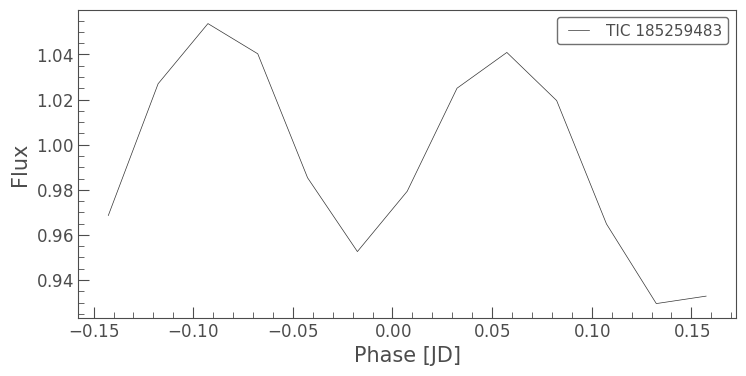

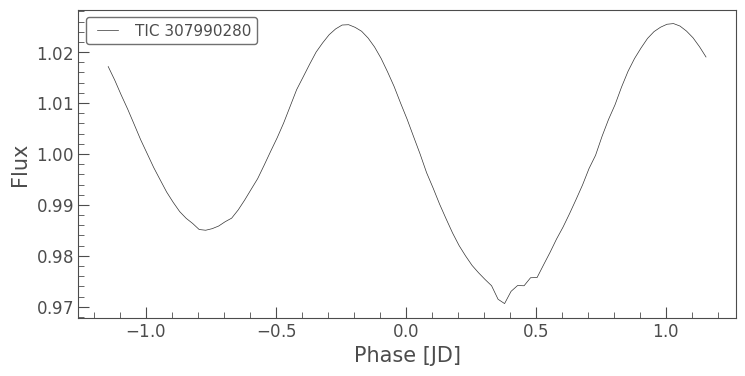

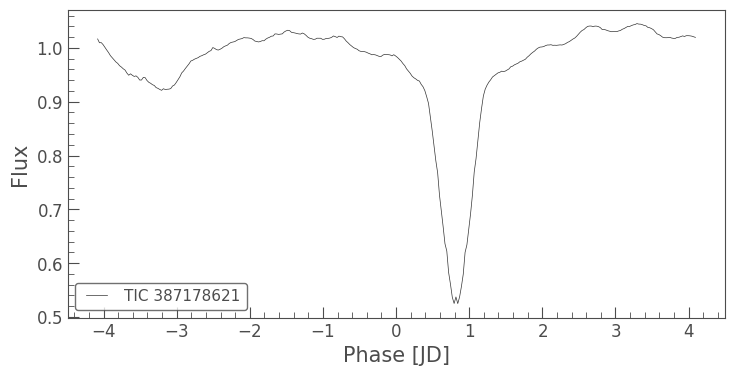

Skipping- Index 122 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05268829762908402560_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05268829762908402560_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


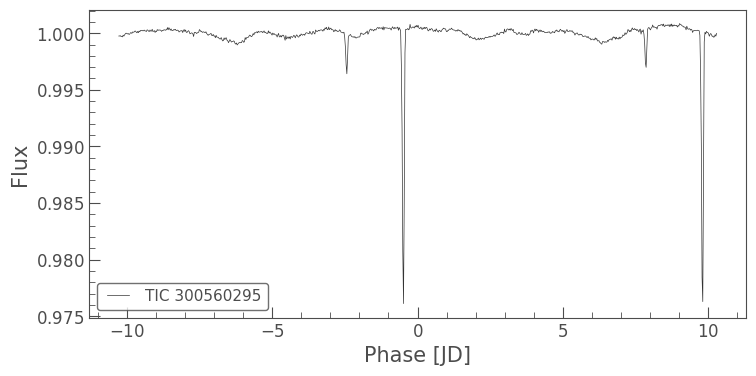

Skipping -No light curves passed SNR threshold for TIC 318185328


<Figure size 640x480 with 0 Axes>

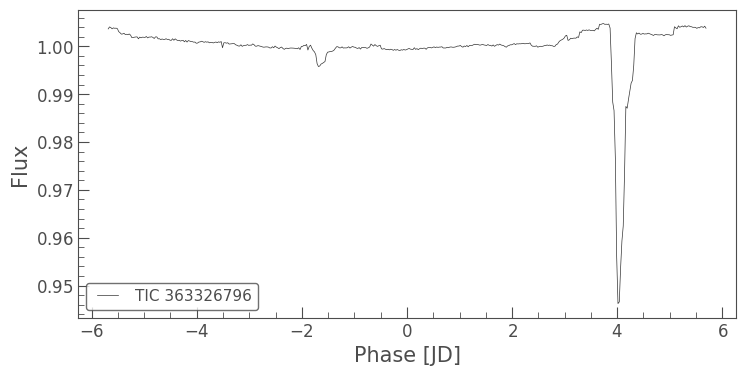

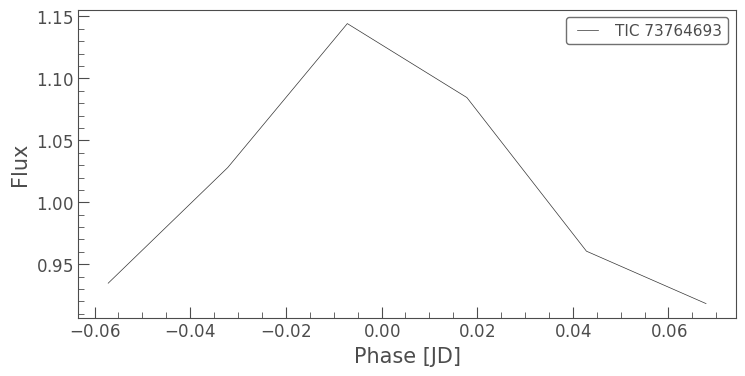

Skipping- Index 89 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04659189872865776384_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04659189872865776384_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


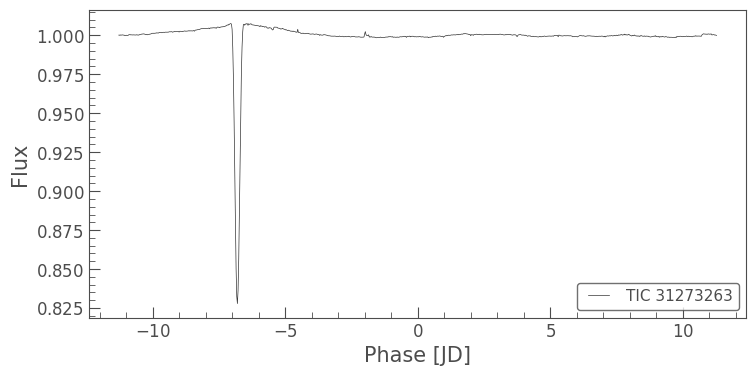

Skipping- Index 92 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04658516868697567872_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04658516868697567872_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


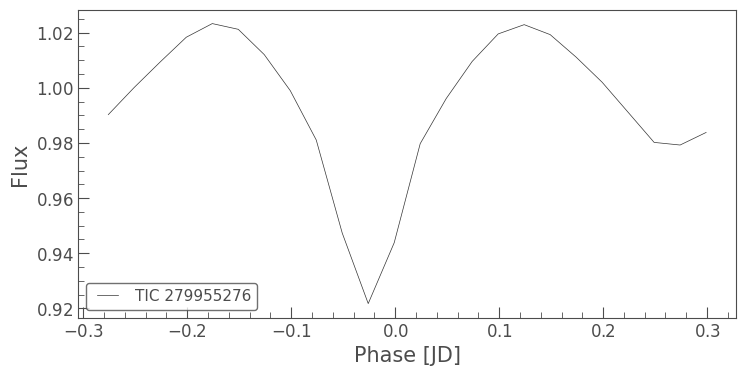

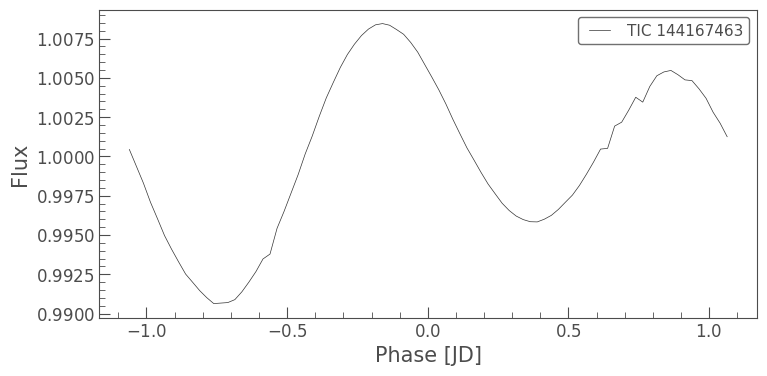

Skipping- Index 94 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05478980691635060608_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05478980691635060608_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


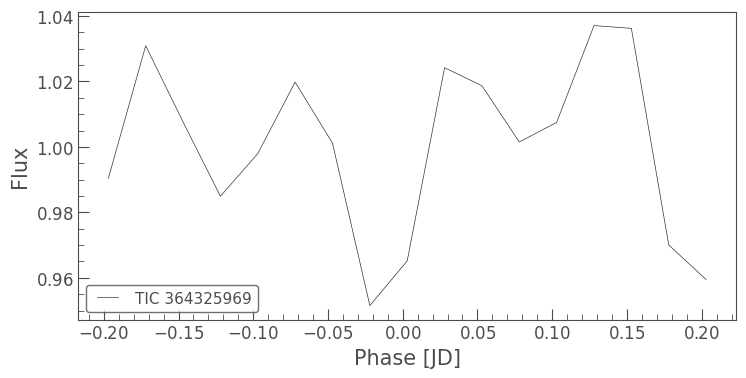

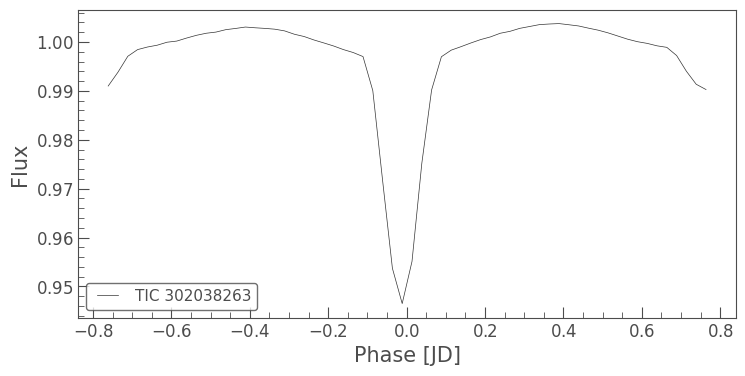

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Skipping- Index 74 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05280395388283428736_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05280395388283428736_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


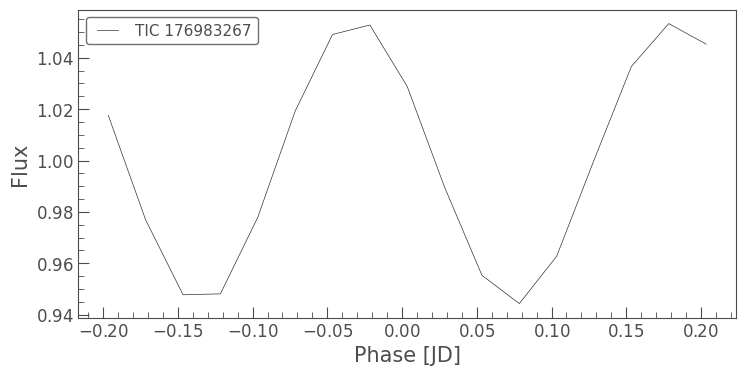

Skipping- Index 74 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05274745135464964992_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05274745135464964992_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


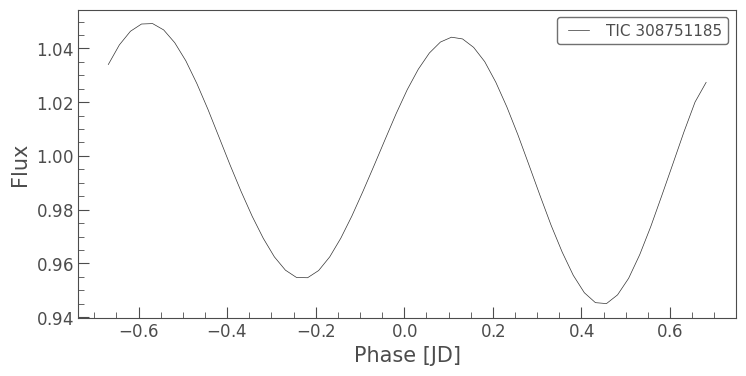

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

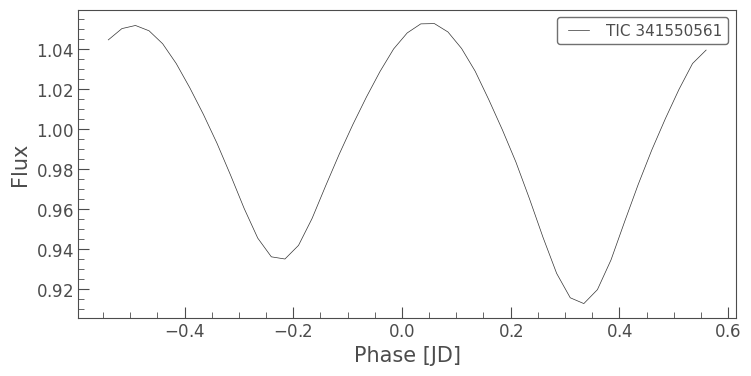

Skipping- Index 92 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04654488391189033344_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04654488391189033344_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.
Skipping -No light curves passed SNR threshold for TIC 140757590


<Figure size 640x480 with 0 Axes>

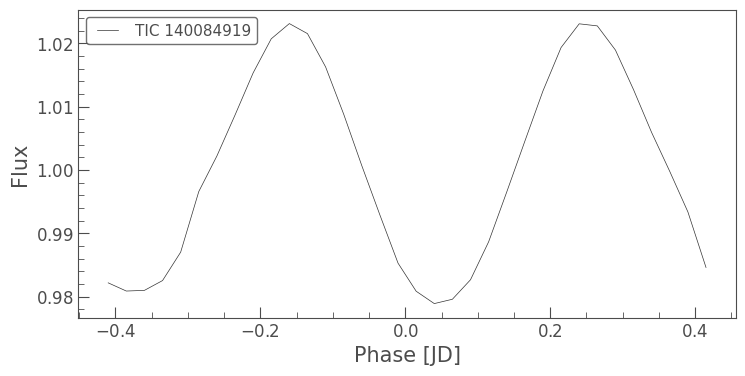

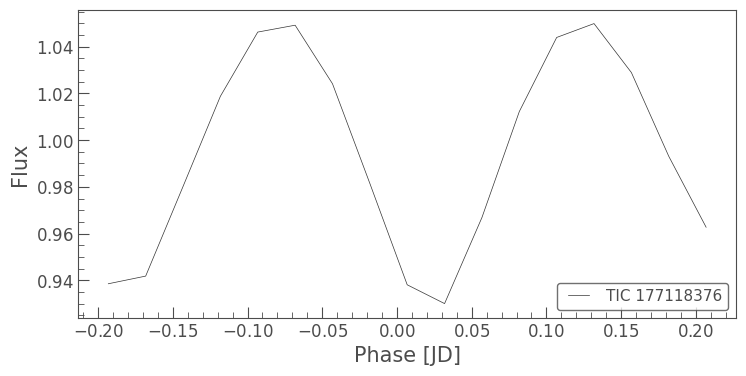

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


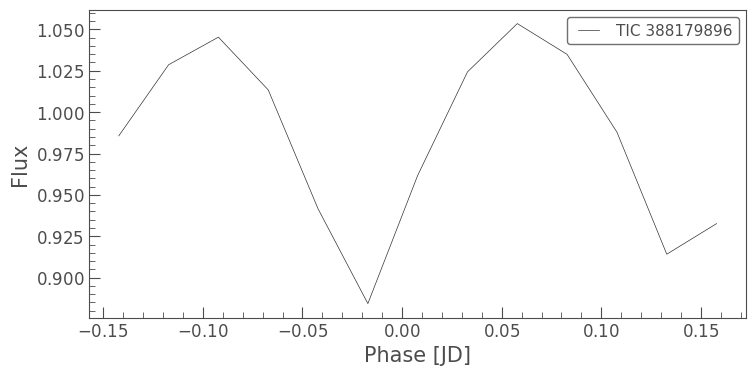

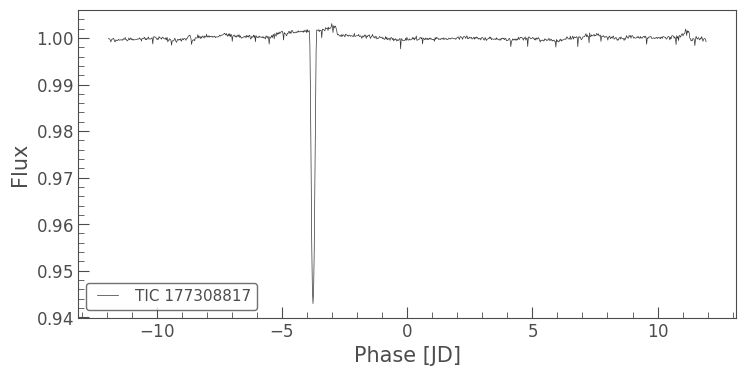

Skipping- Index 99 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05266101599685911168_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05266101599685911168_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


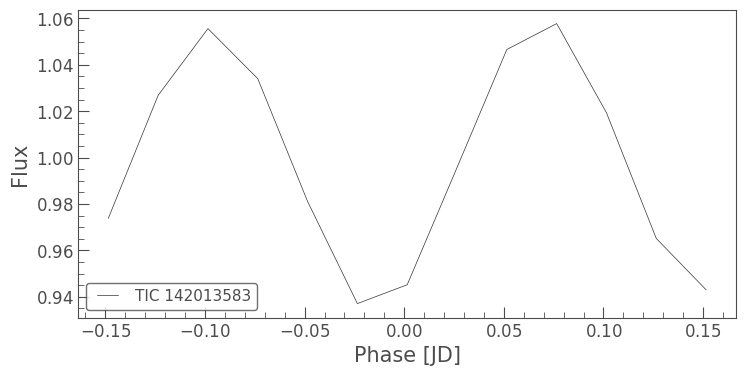

Skipping- Index 59 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04657339600951343744_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04657339600951343744_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


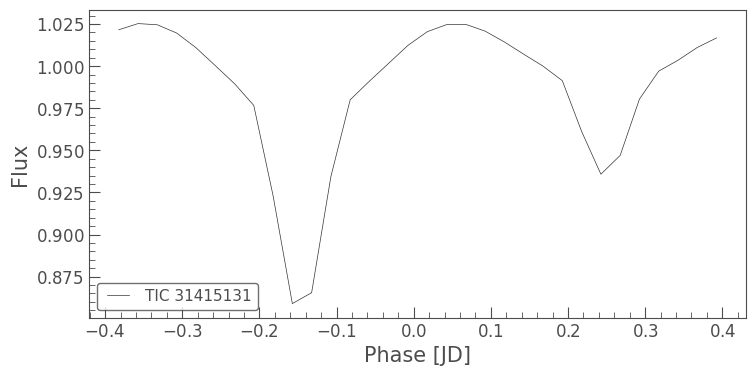

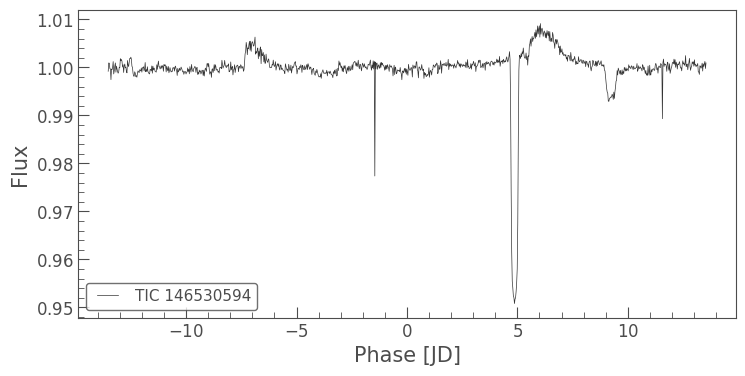

Skipping- Index 96 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05285020312146811136_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05285020312146811136_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


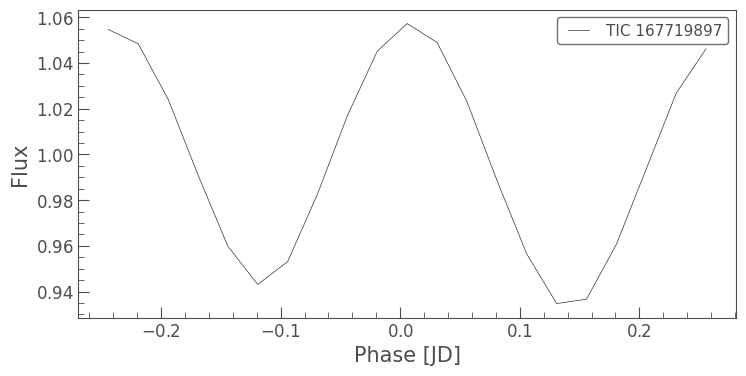

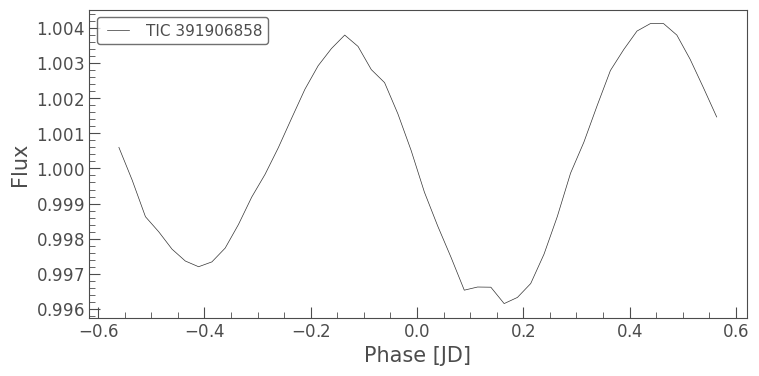

Skipping- Index 102 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05287275857171972480_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05287275857171972480_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


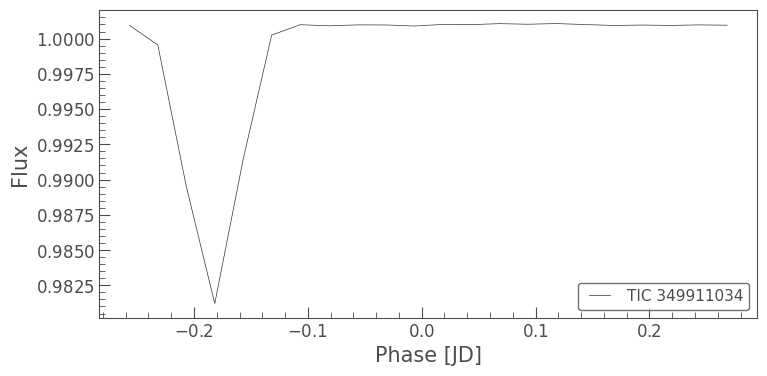

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Skipping- Index 53 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05292281040258310144_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05292281040258310144_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy num

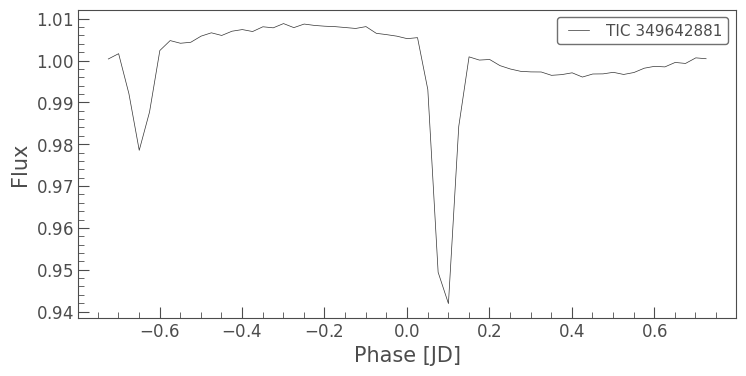

Skipping- Index 121 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05477851458835763328_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05477851458835763328_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


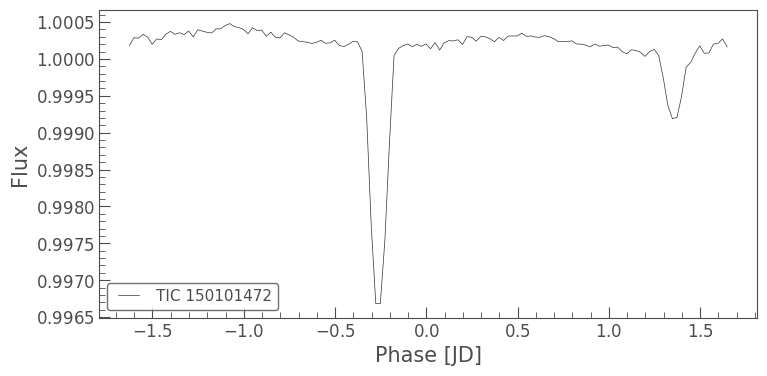

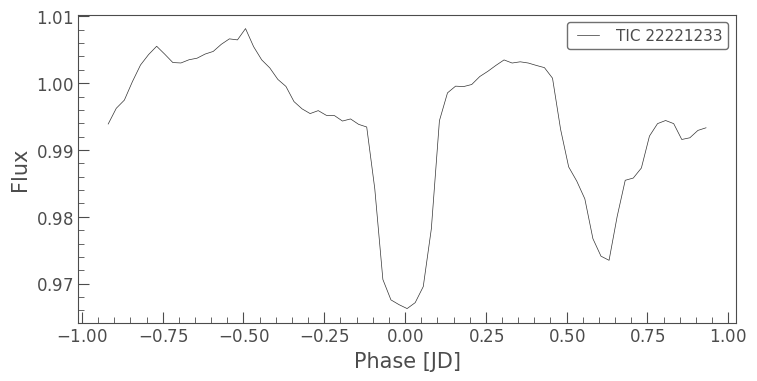

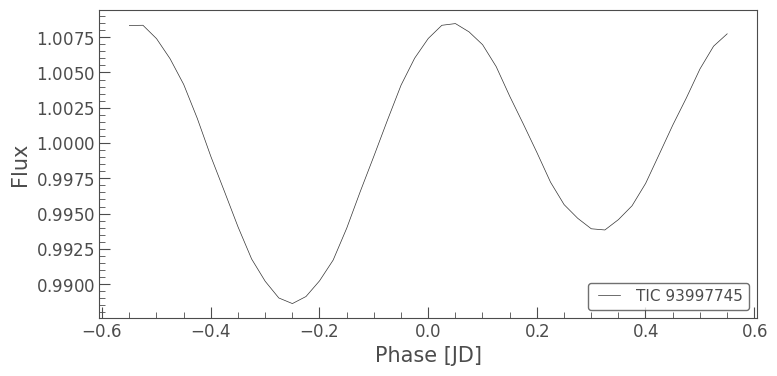

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Skipping- Index 93 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05262387552482092800_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05262387552482092800_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


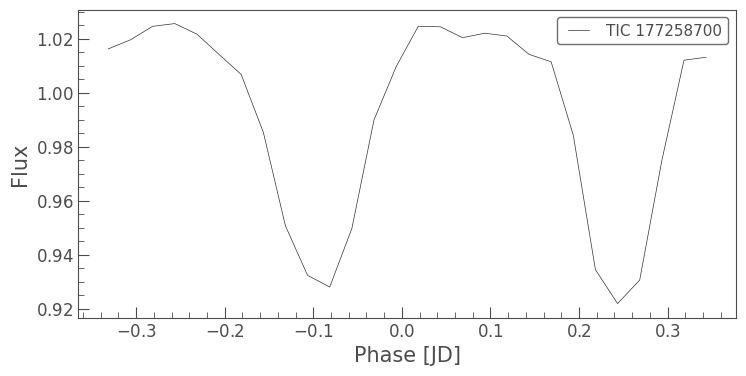

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

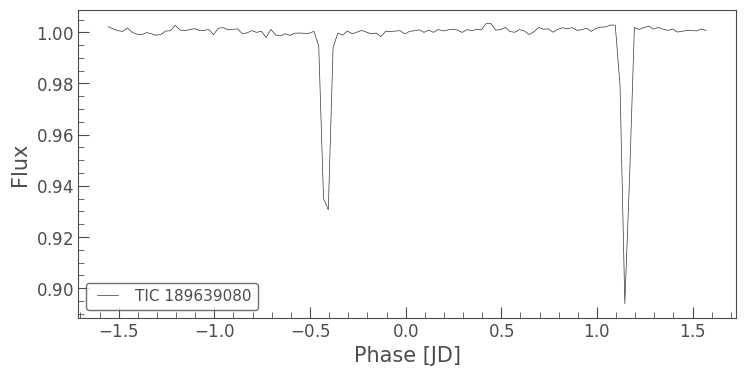

Skipping- Index 102 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04763215355145234048_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04763215355145234048_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


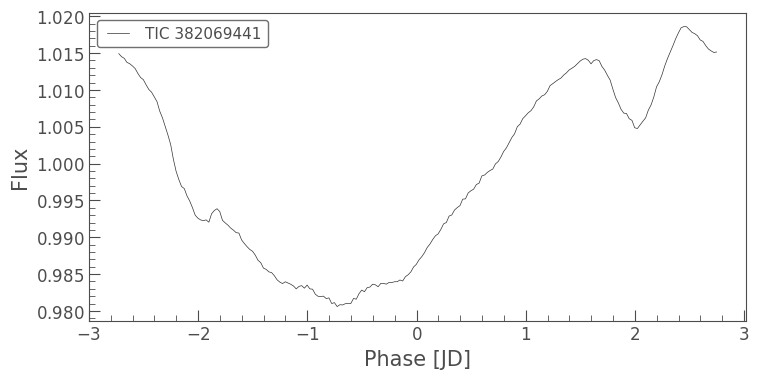

Skipping- Index 98 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05292229157053629056_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05292229157053629056_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

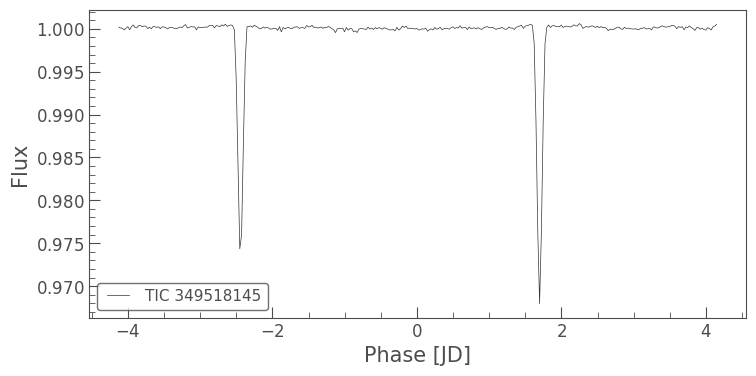

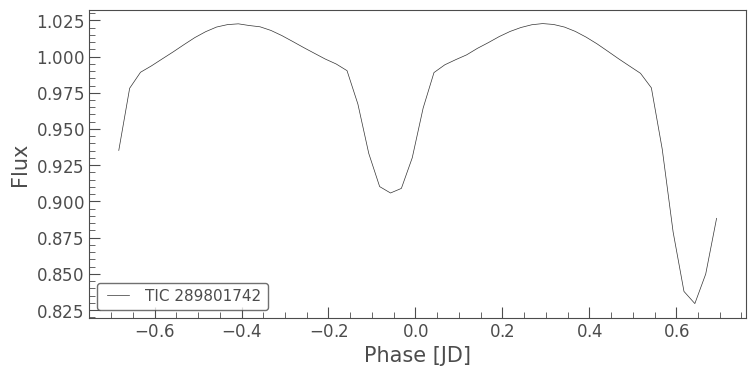

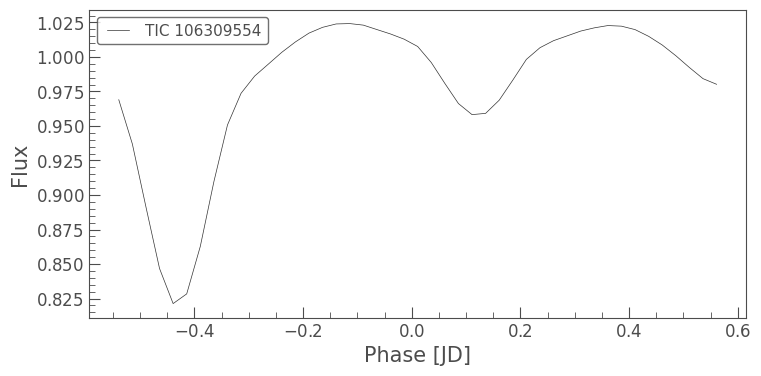

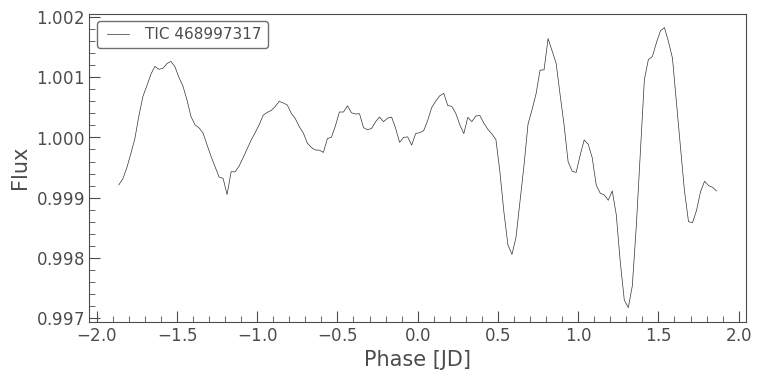

Skipping- Index 98 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05278764121045845504_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05278764121045845504_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


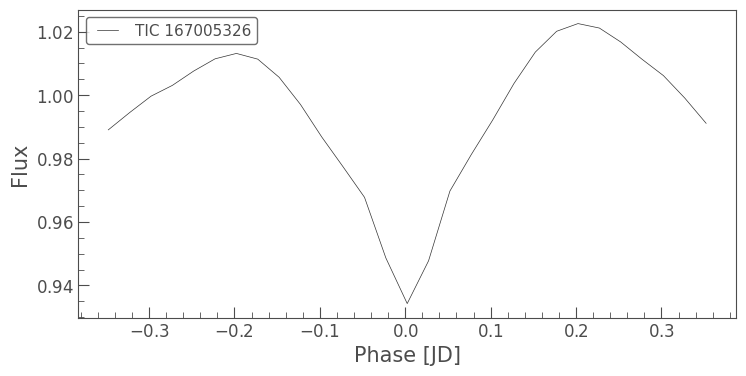

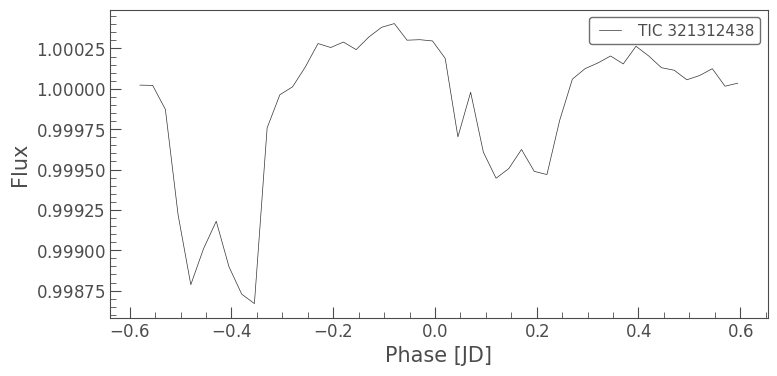

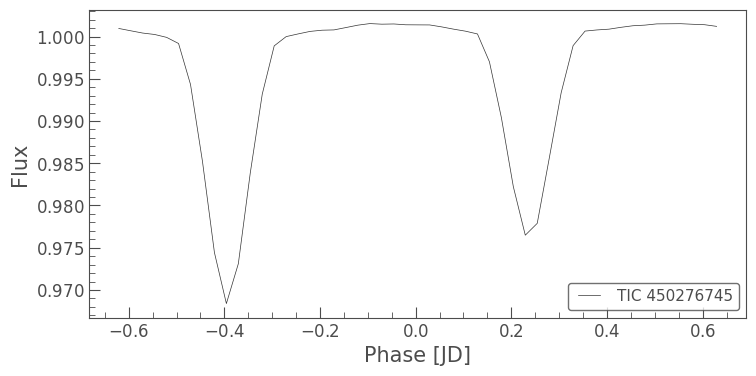

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


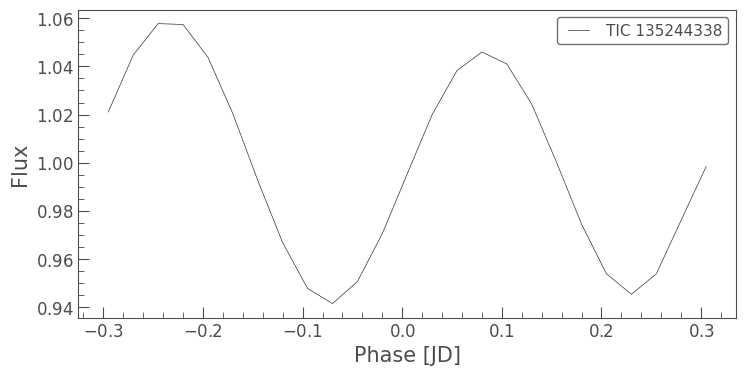

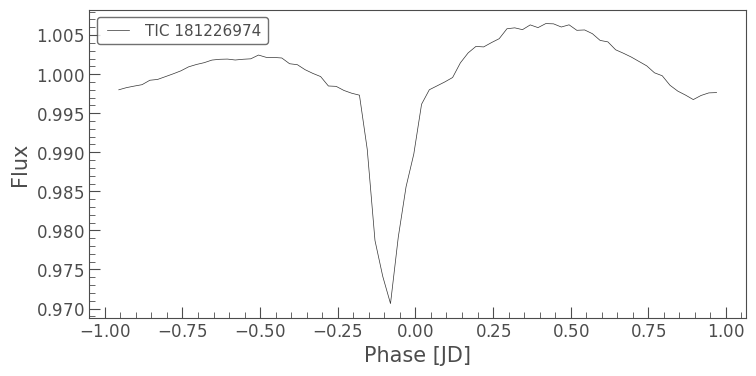

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


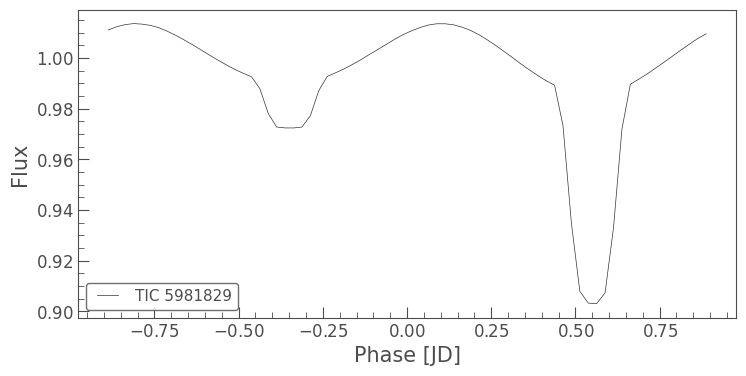

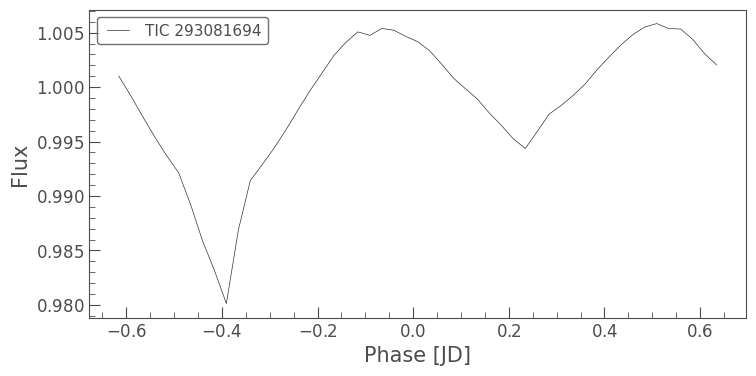

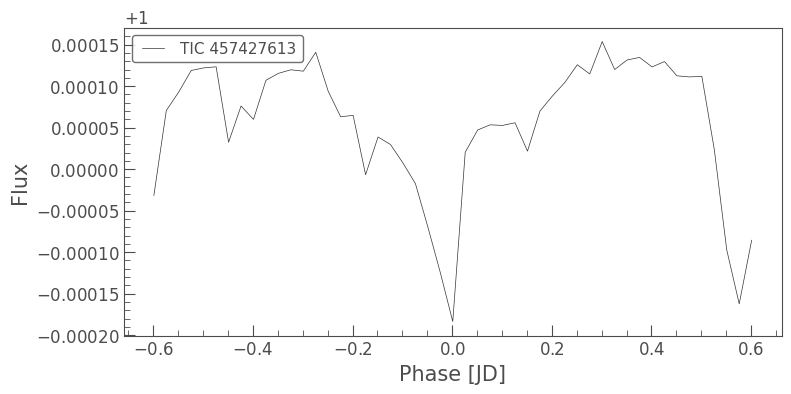

Skipping- Index 94 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05478885446438293376_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05478885446438293376_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


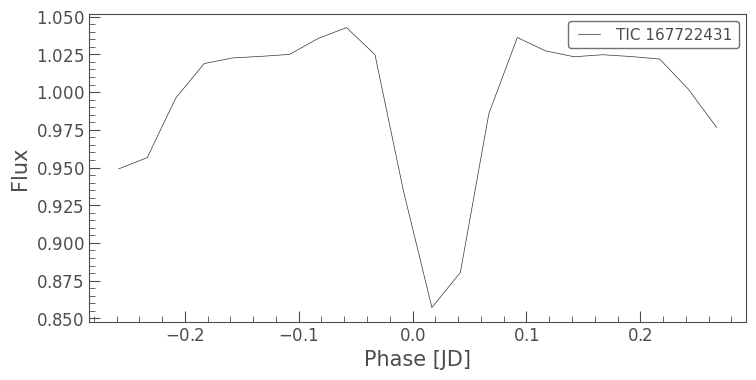

Skipping- Index 97 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05286333472626461696_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05286333472626461696_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


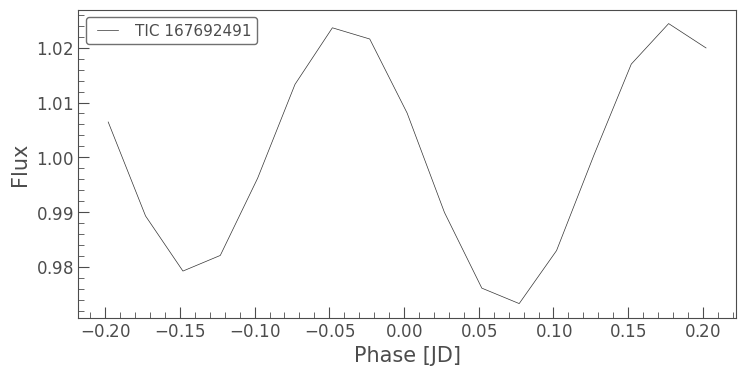

Skipping- Index 73 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05485677439003145728_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05485677439003145728_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


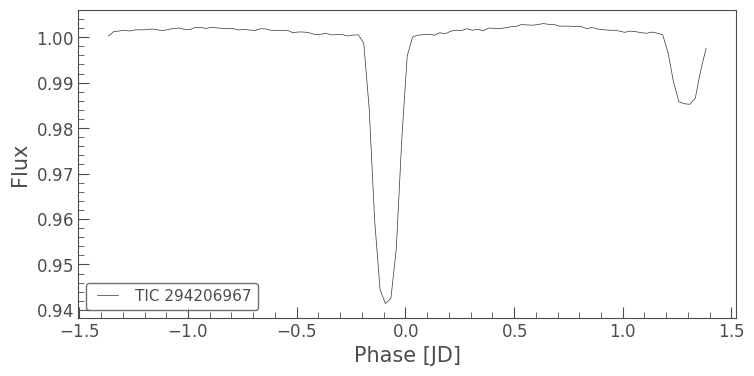

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


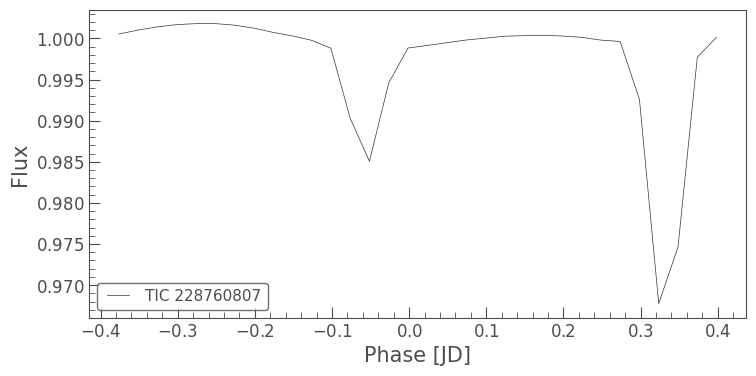

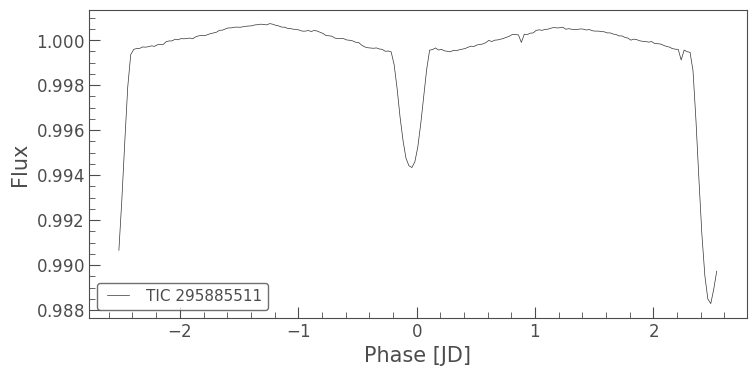

Skipping- Index 117 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04676564802265852032_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04676564802265852032_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


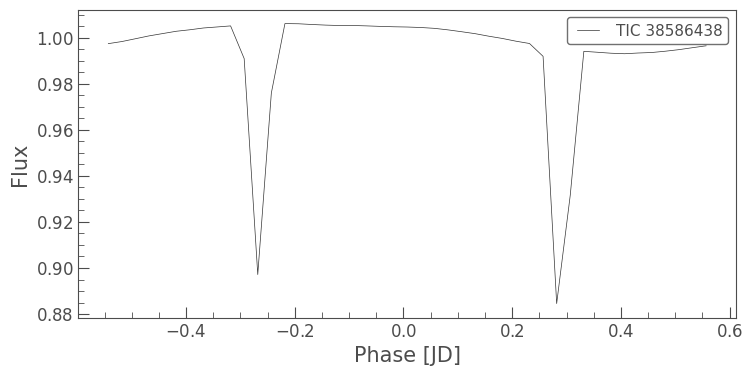

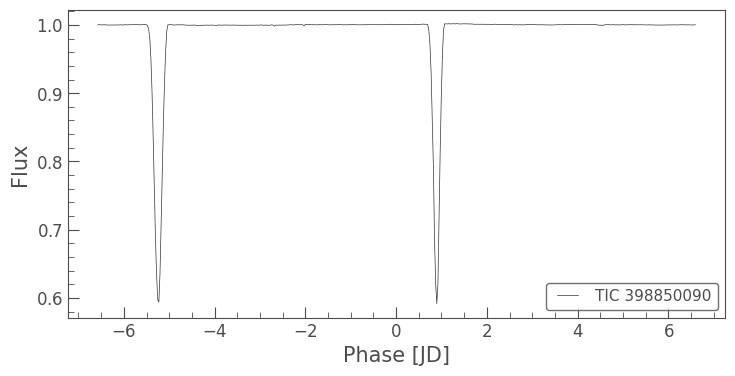

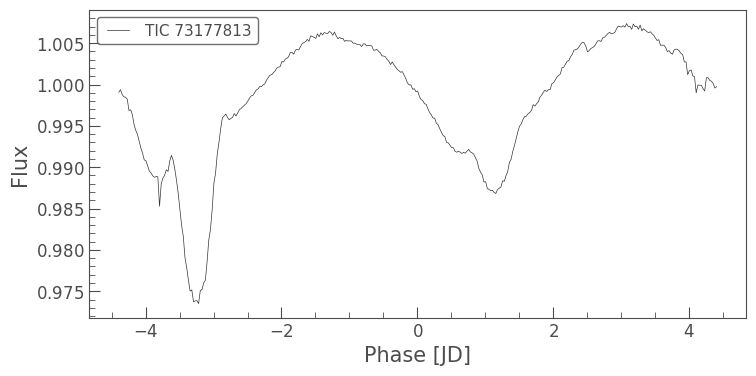

Skipping- Index 113 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04661764448060940416_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04661764448060940416_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


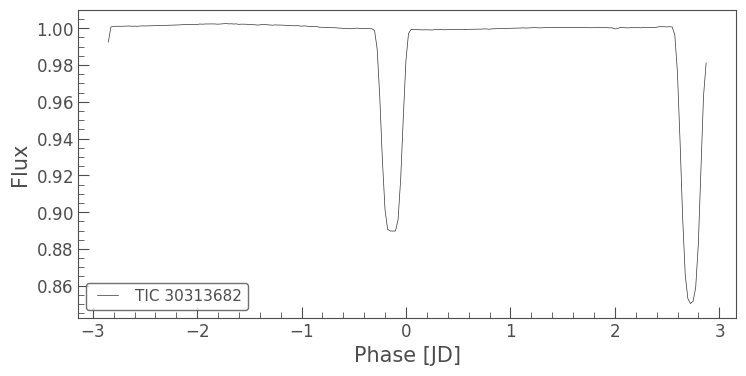

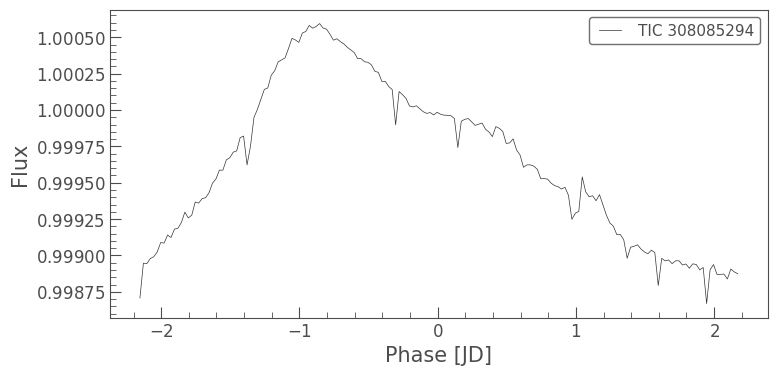

Skipping- Index 124 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05268755820751031296_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05268755820751031296_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


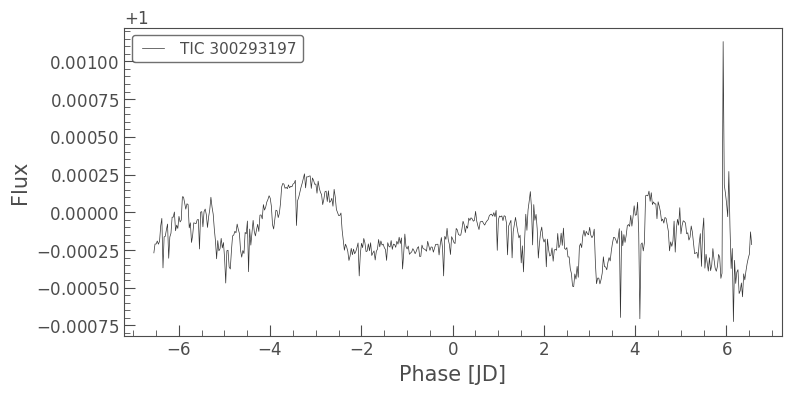

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Skipping- Index 129 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04760735986488486784_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04760735986488486784_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


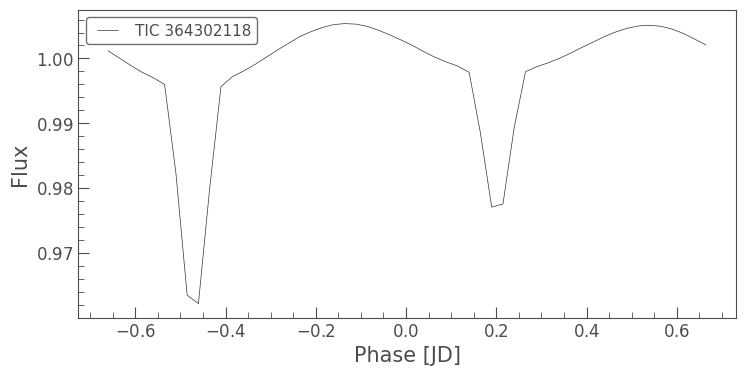

Skipping- Index 132 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05215043092888960384_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05215043092888960384_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


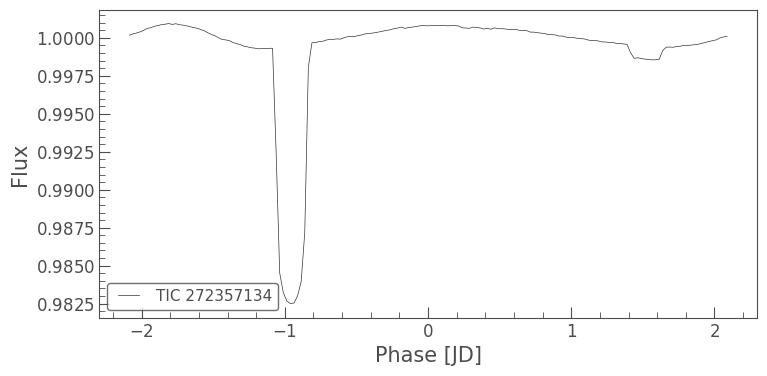

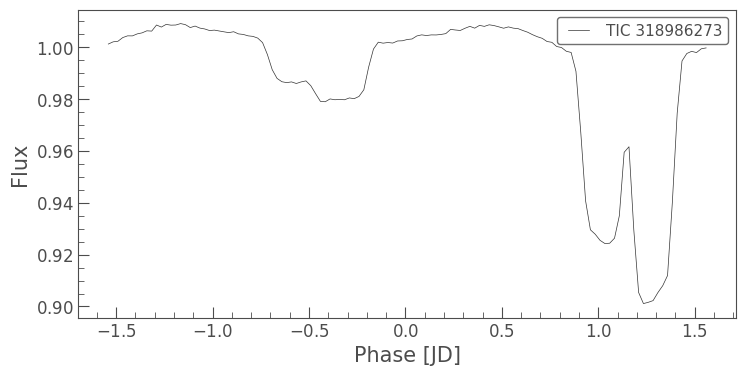

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

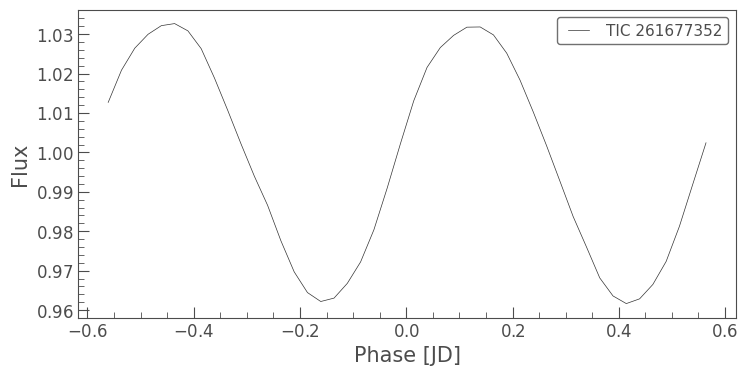

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

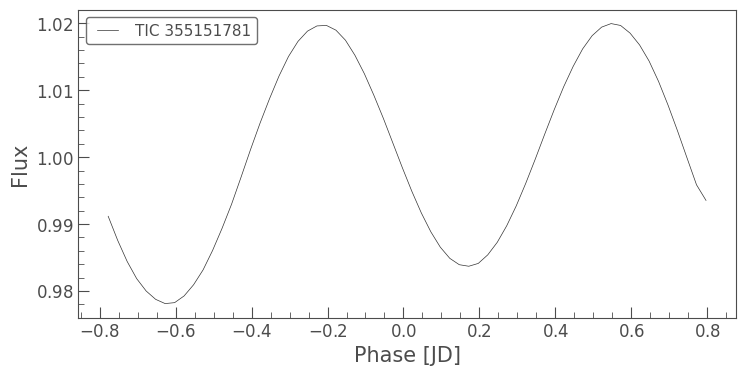

Skipping- Index 93 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04657274489310834176_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04657274489310834176_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


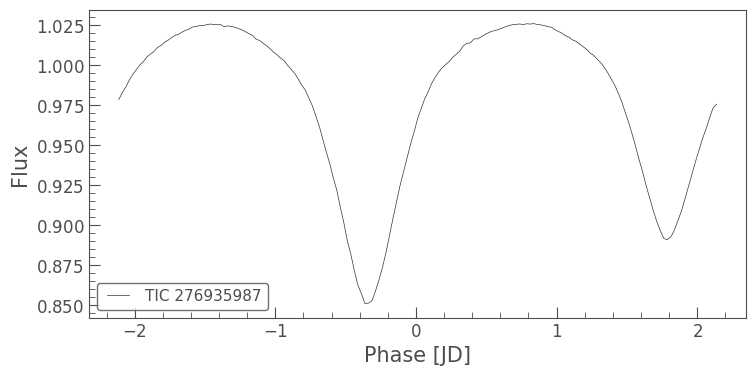

Skipping- Index 100 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05282346402944960896_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05282346402944960896_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


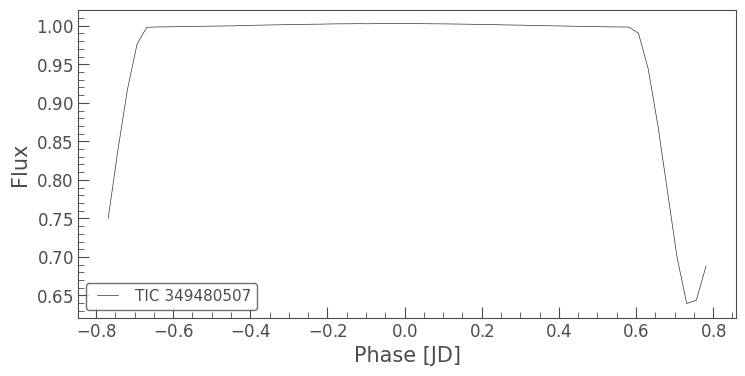

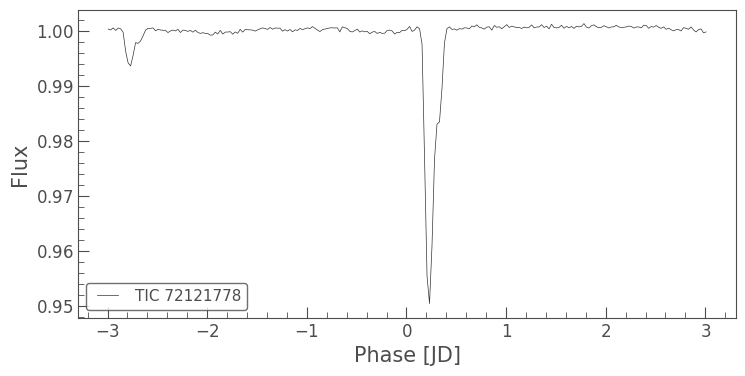

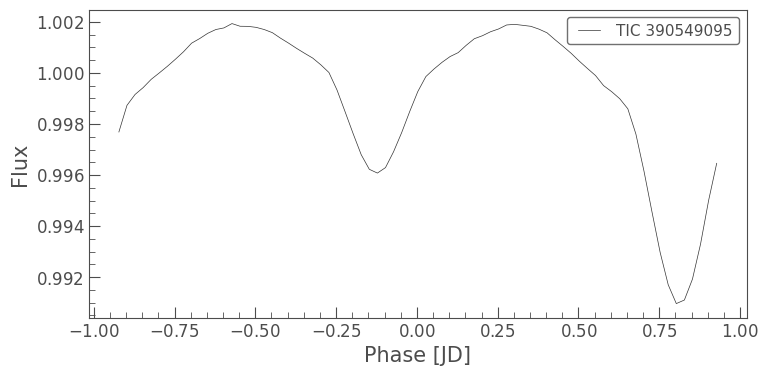

Skipping- Index 102 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05267846696433877504_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05267846696433877504_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


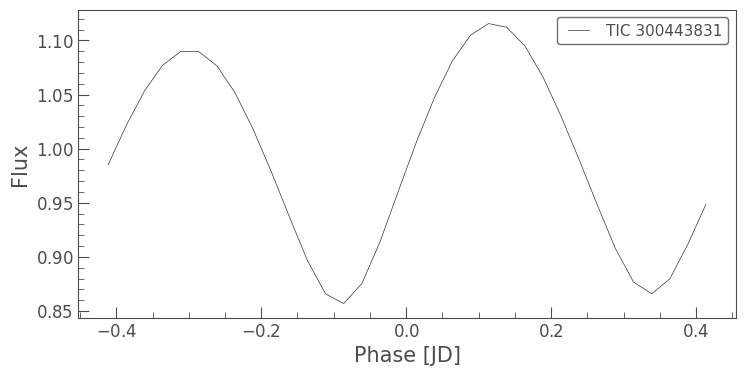

Skipping- Index 75 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05278887545525234688_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05278887545525234688_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.
Skipping -No light curves passed SNR threshold for TIC 167338355


<Figure size 640x480 with 0 Axes>

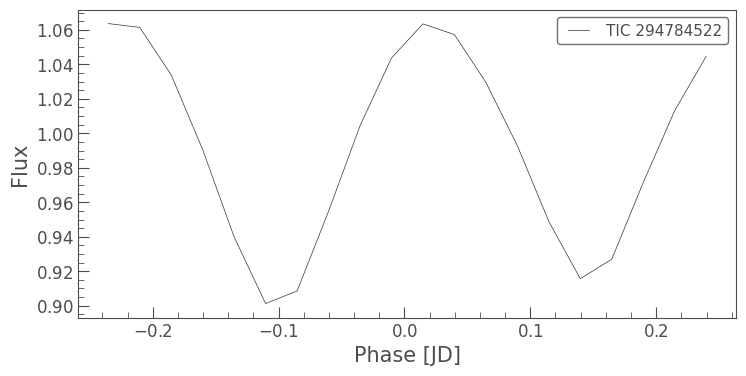

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


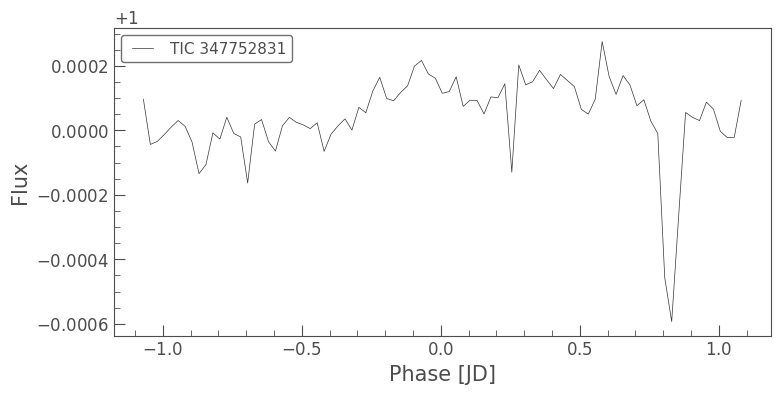

Skipping- Index 123 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04759179627779753600_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04759179627779753600_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


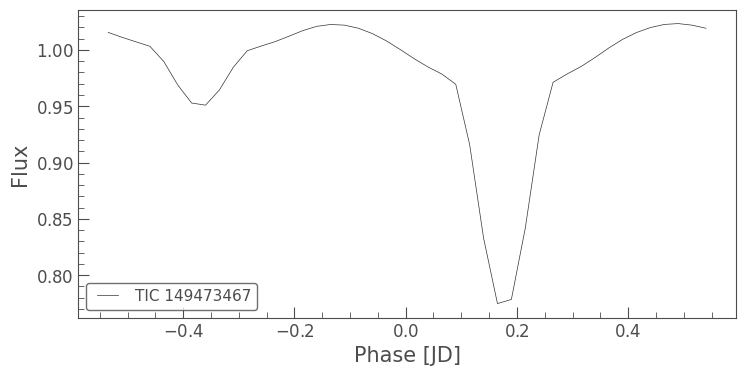

Skipping- Index 101 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05484592564623199232_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05484592564623199232_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


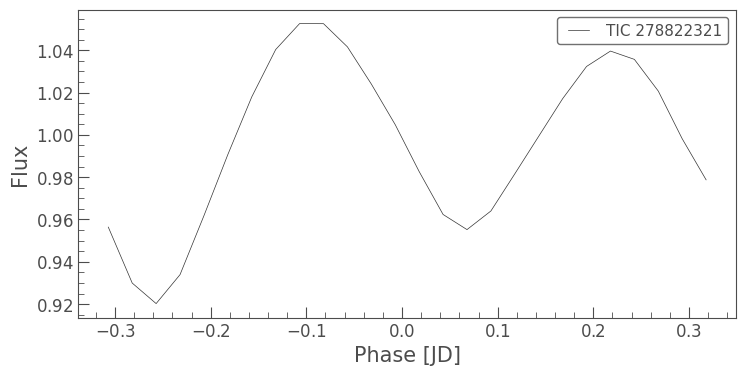

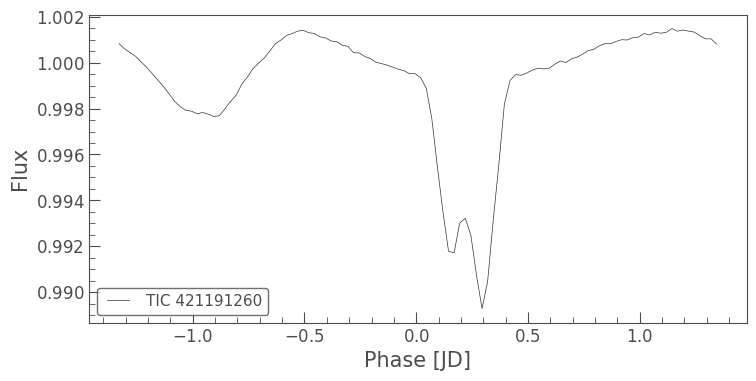

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


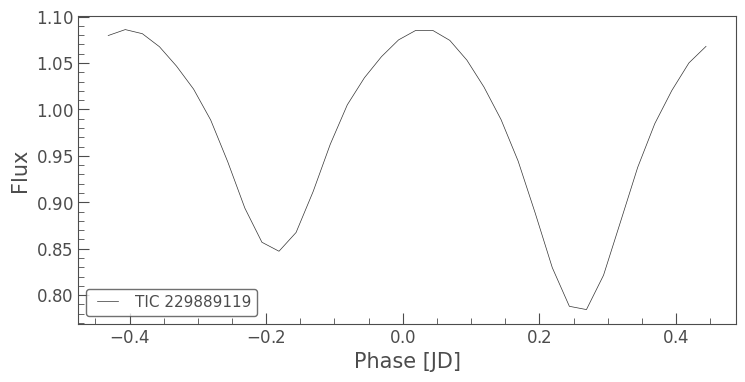

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


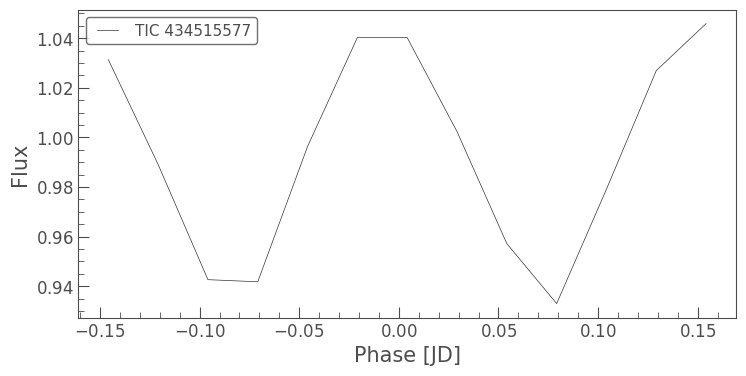

Skipping- Index 91 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05477873272970767360_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05477873272970767360_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


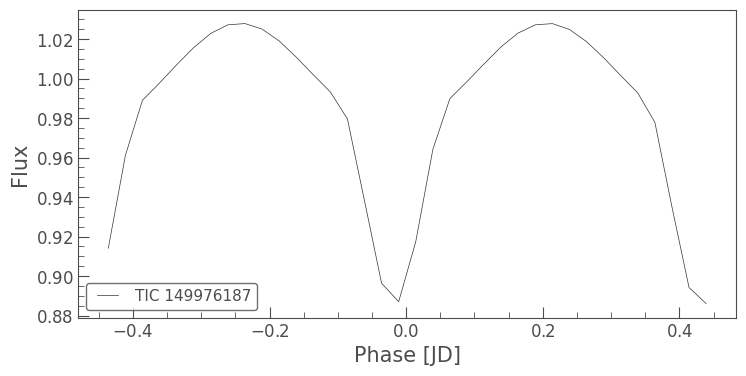

Skipping- Index 82 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam3-ccd3-04629236113793068160_tess_v01/hlsp_t16_tess_ffi_s0001-cam3-ccd3-04629236113793068160_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


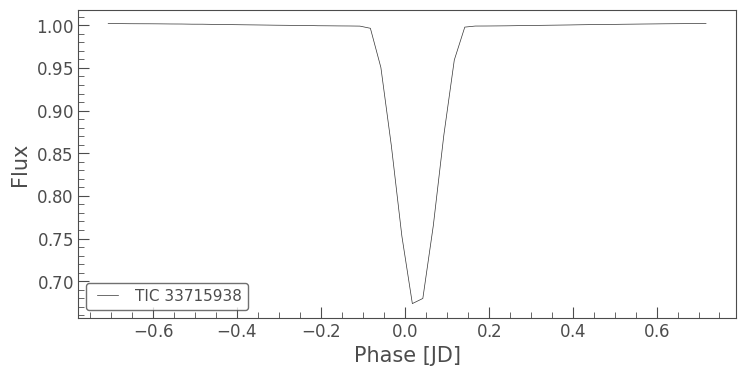

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

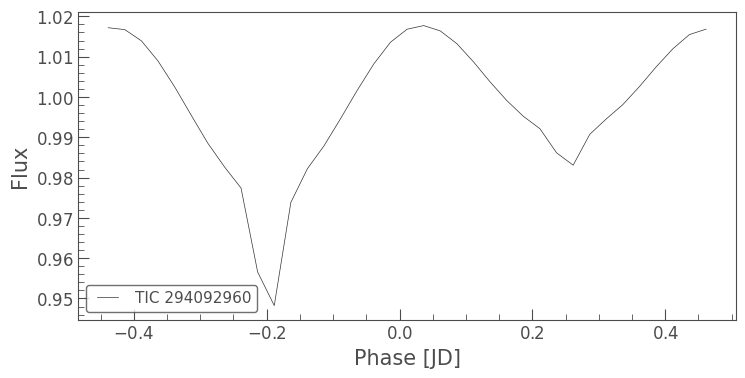

Skipping- Index 68 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04756821557595434880_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04756821557595434880_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


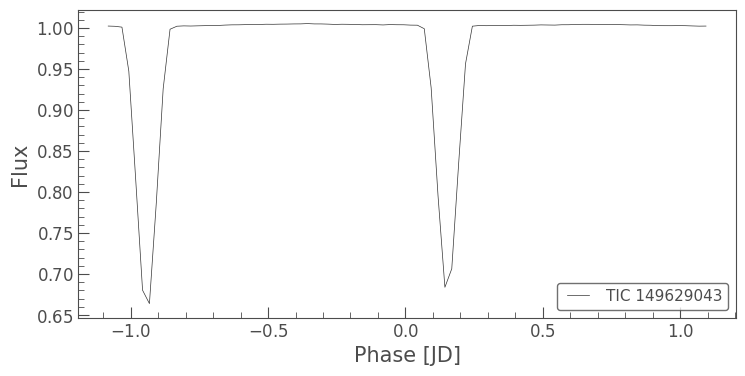

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

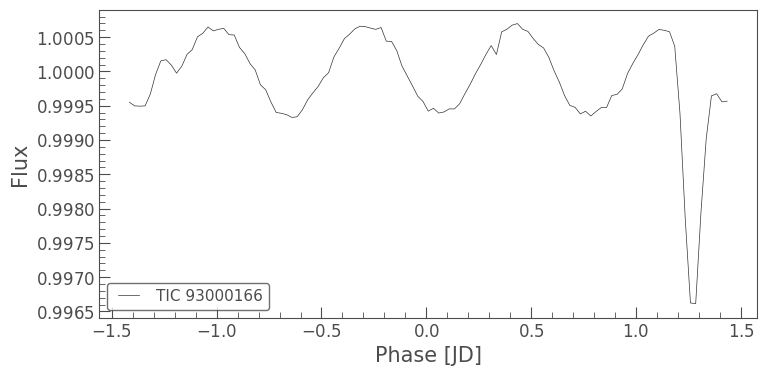

Skipping- Index 76 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05286761388808047872_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05286761388808047872_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


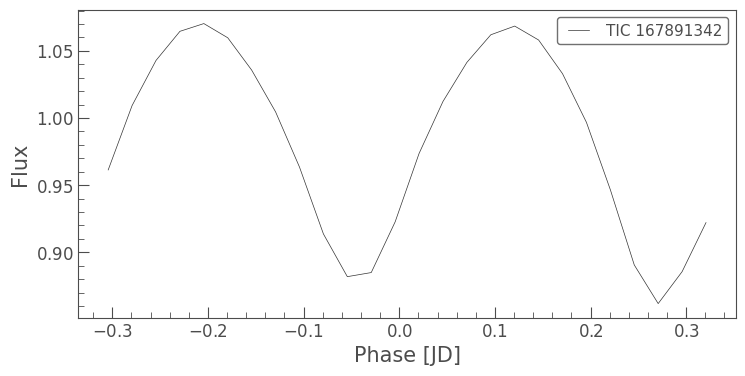

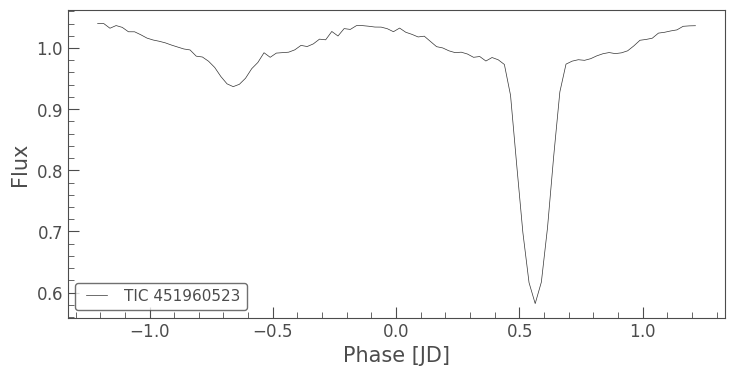

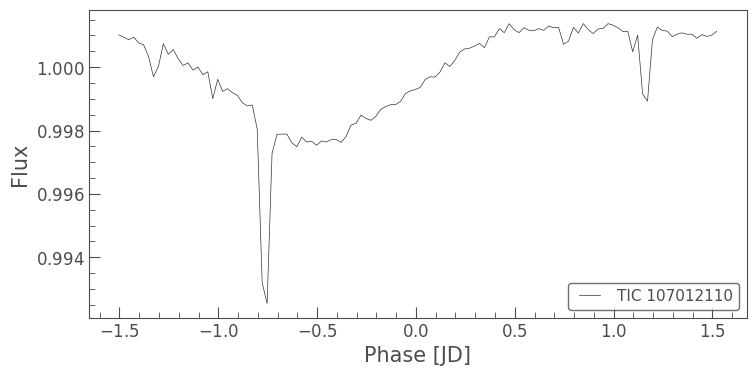

Skipping- Index 9 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000135050395_tess_v1_llc/hlsp_diamante_tess_lightcurve_tic-0000000135050395_tess_v1_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


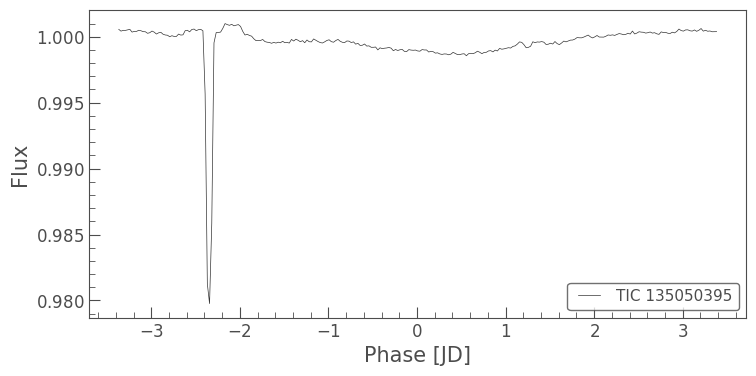

Skipping- Index 52 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05284439323331701504_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05284439323331701504_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

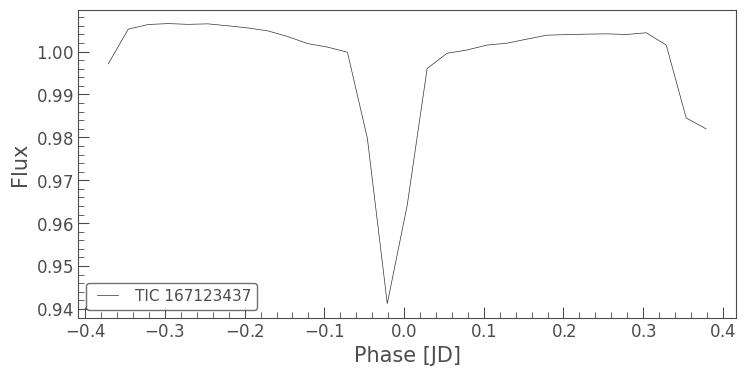

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


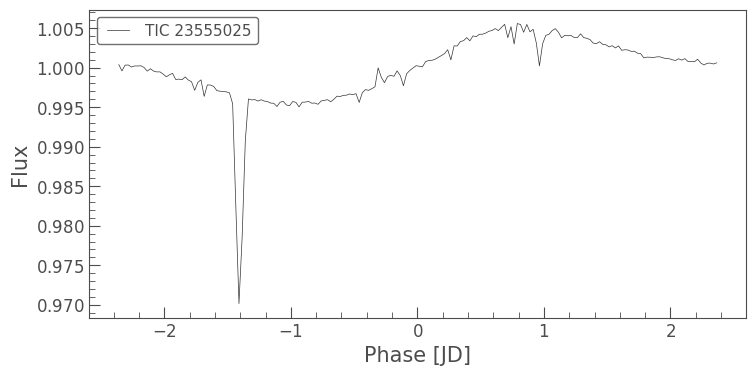

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

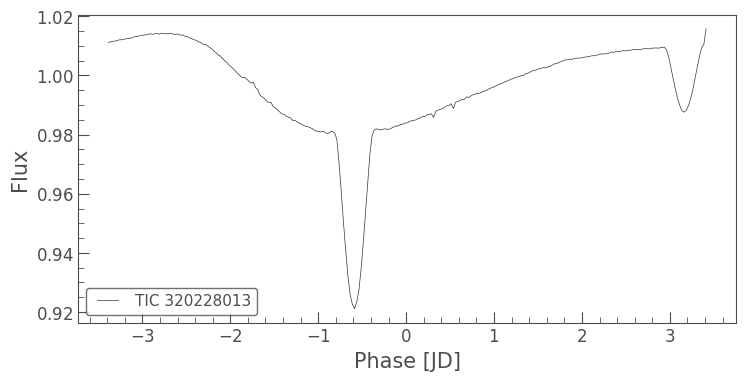

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

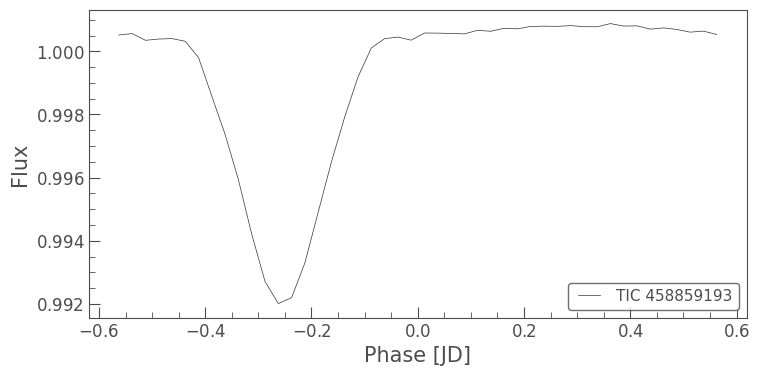

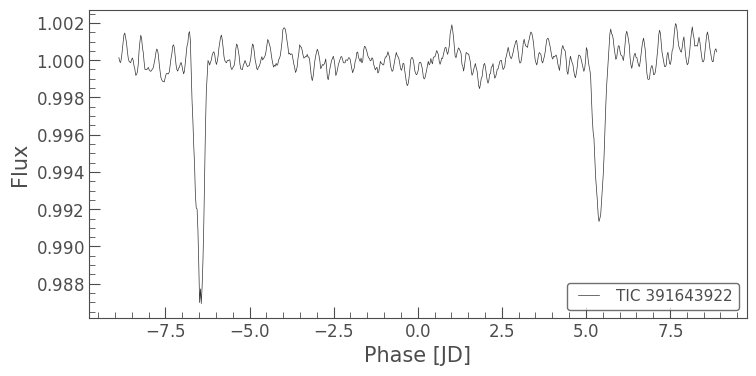

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


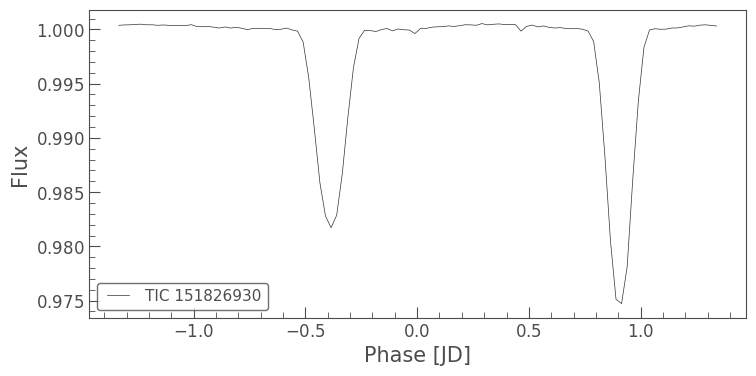

Skipping- Index 109 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04650697794795813504_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04650697794795813504_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Skipping -No light curves passed SNR threshold for TIC 141606986


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


<Figure size 640x480 with 0 Axes>

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


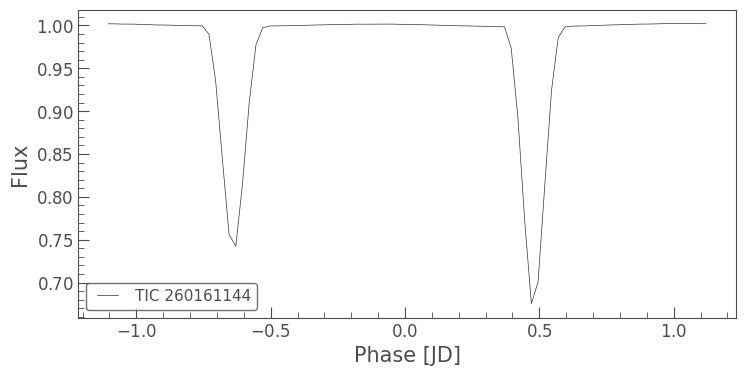

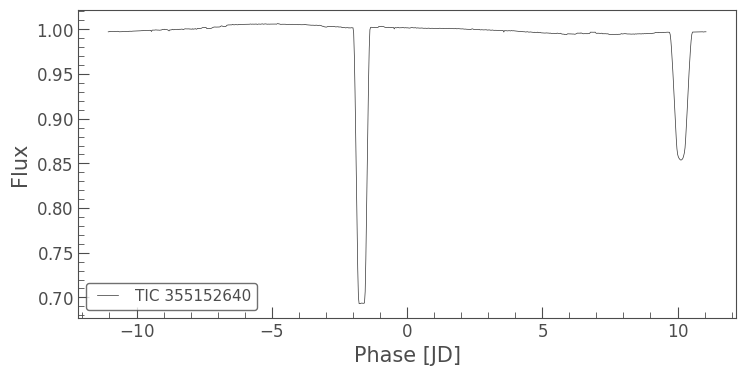

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


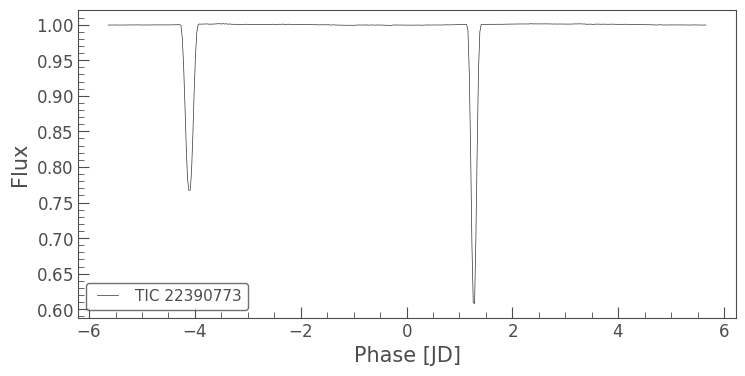

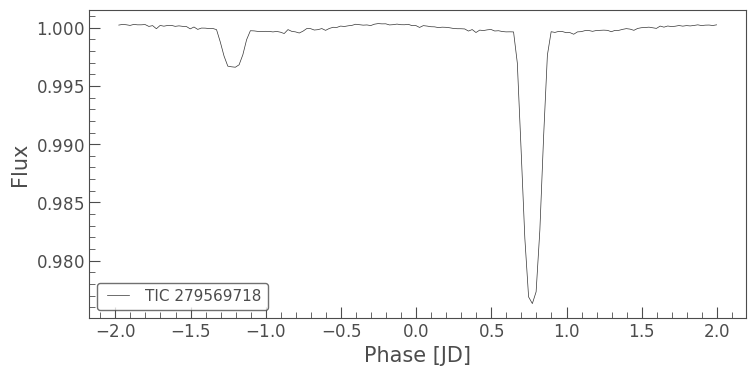

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

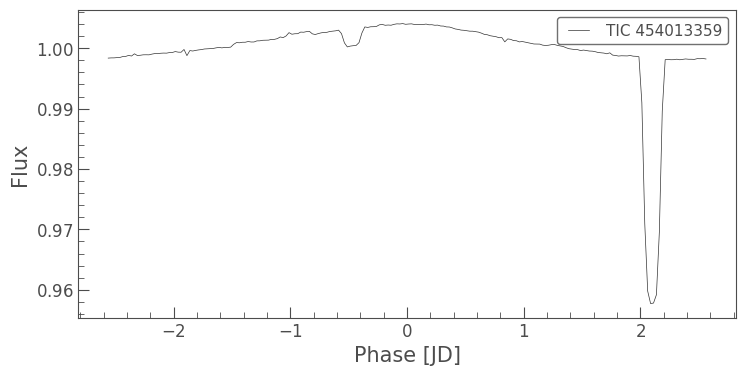

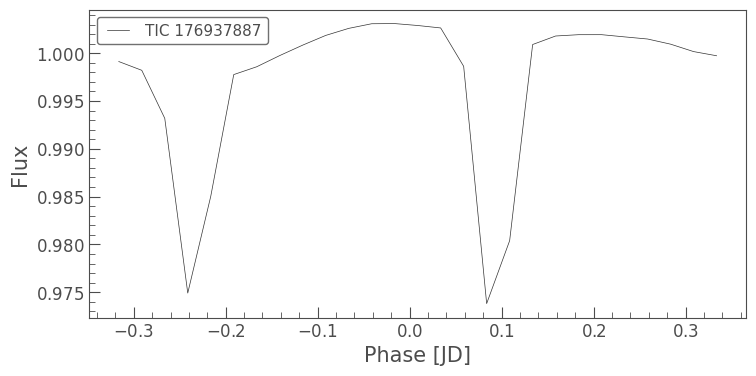

Skipping- Index 93 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05287554892607182720_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05287554892607182720_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


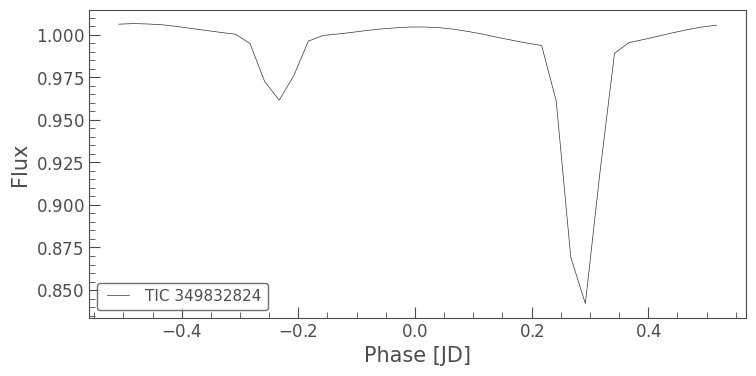

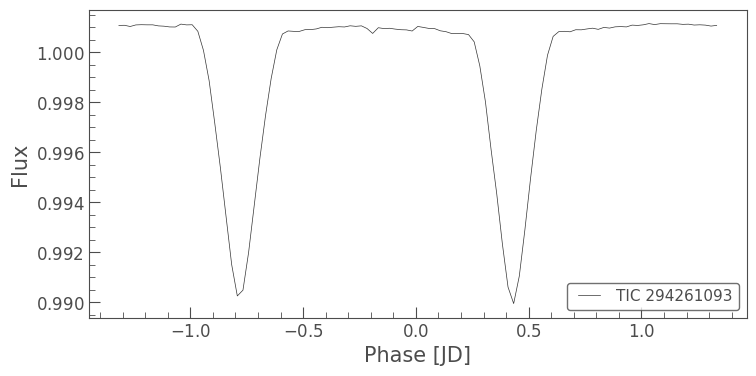

Skipping- Index 81 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05263973353190188416_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05263973353190188416_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


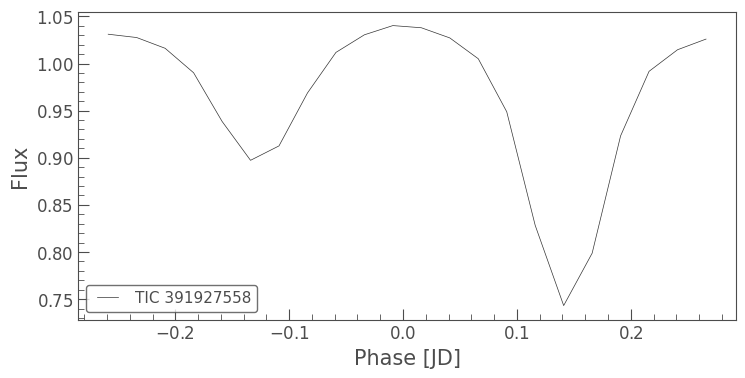

Skipping- Index 99 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04765792163723707776_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04765792163723707776_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


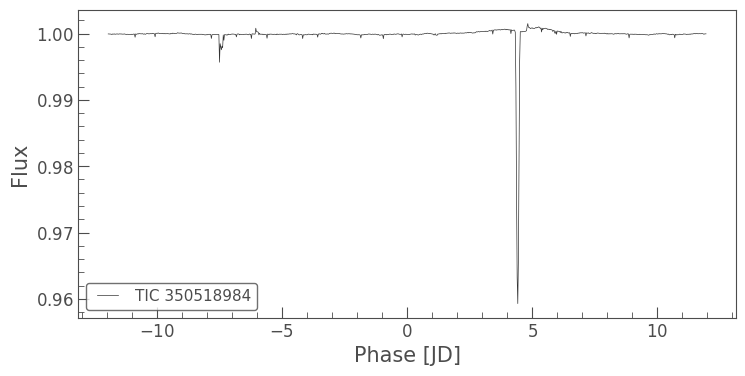

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

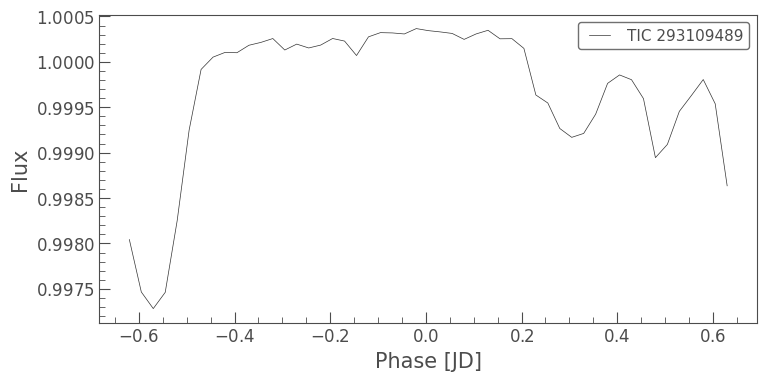

Skipping- Index 107 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04765186538975386240_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04765186538975386240_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


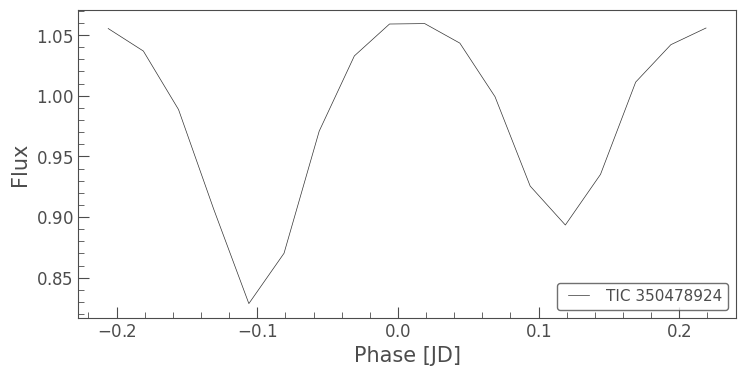

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value 

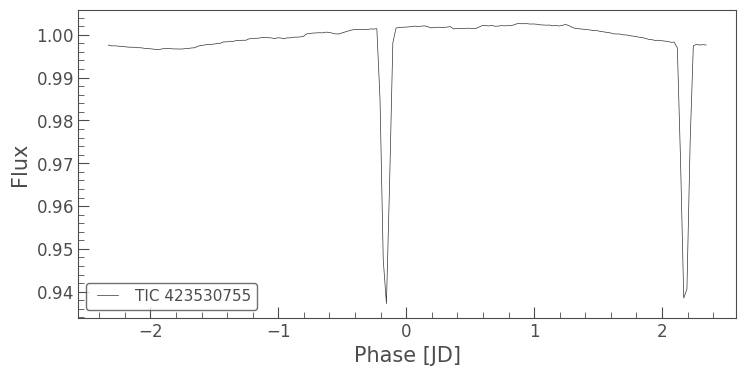

Skipping- Index 141 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05485514157229578112_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05485514157229578112_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


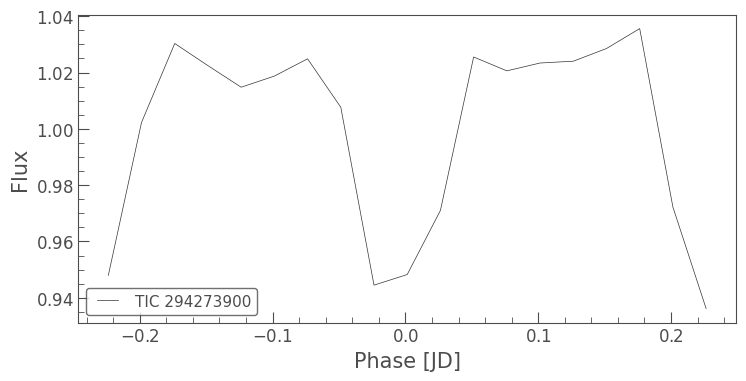

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)
<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


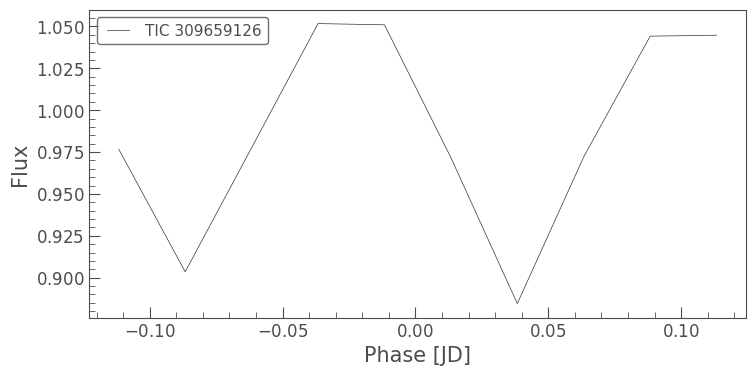

Skipping -No light curves passed SNR threshold for TIC 157175641


<Figure size 640x480 with 0 Axes>

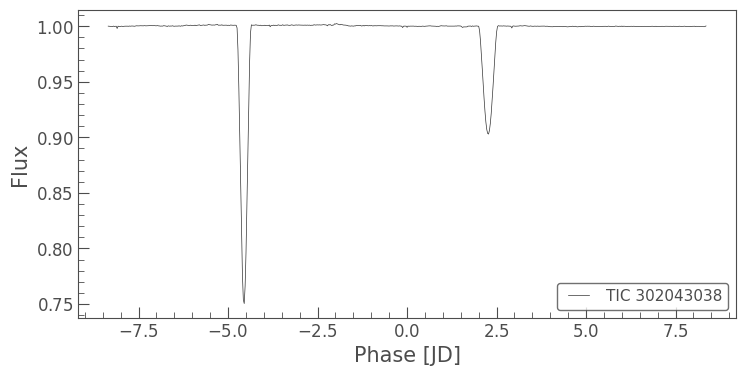

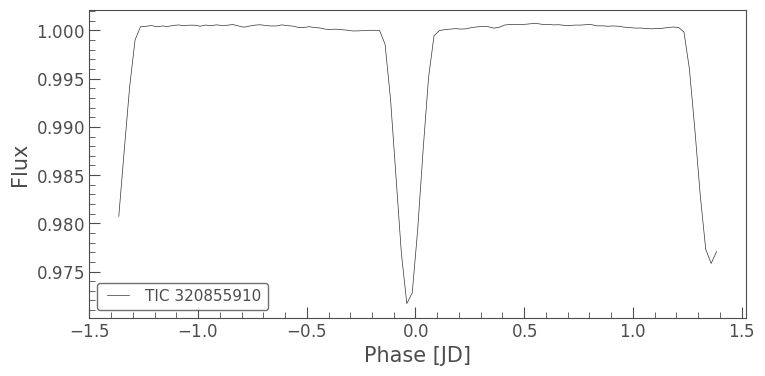

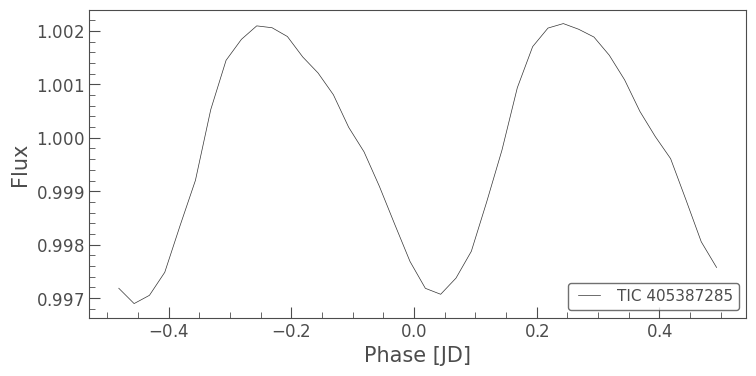

Skipping- Index 50 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05483668734338164224_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05483668734338164224_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

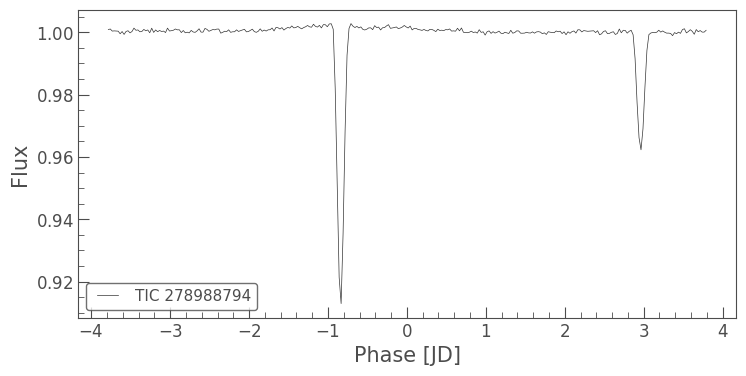

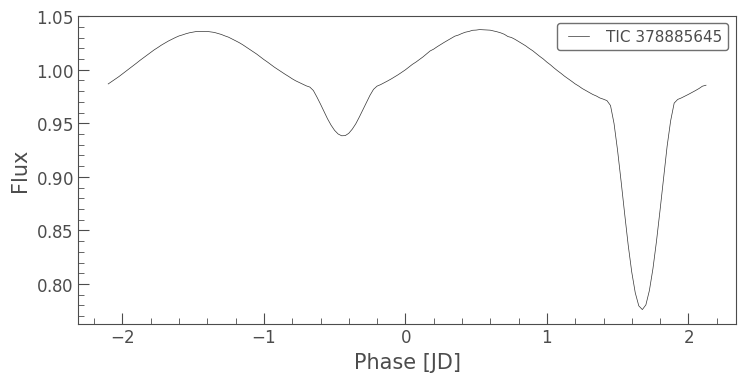

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

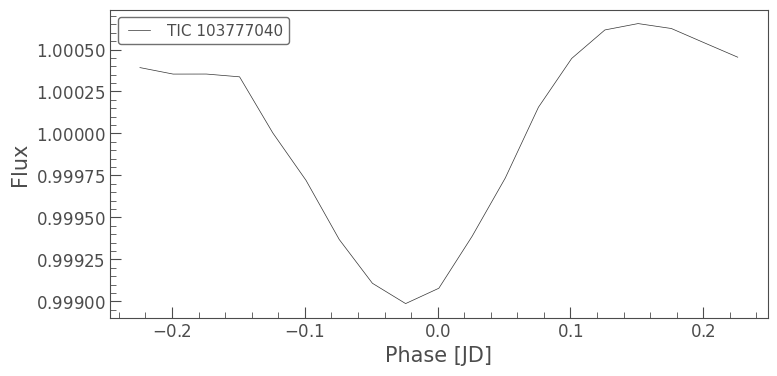

Skipping- Index 83 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05476952058323255552_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05476952058323255552_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


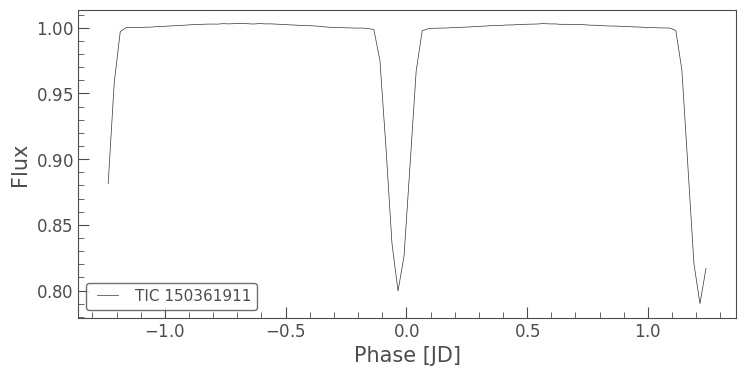

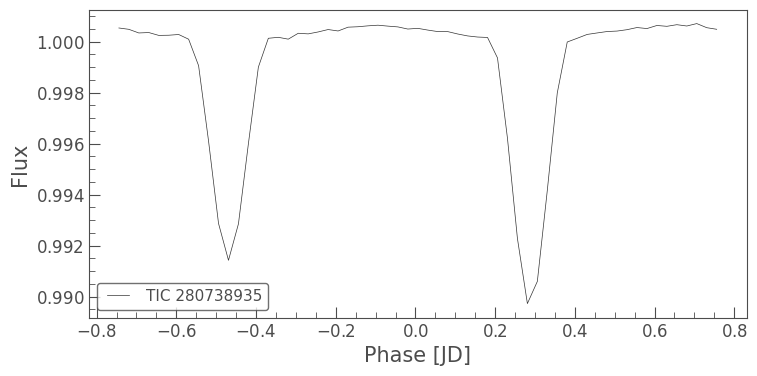

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

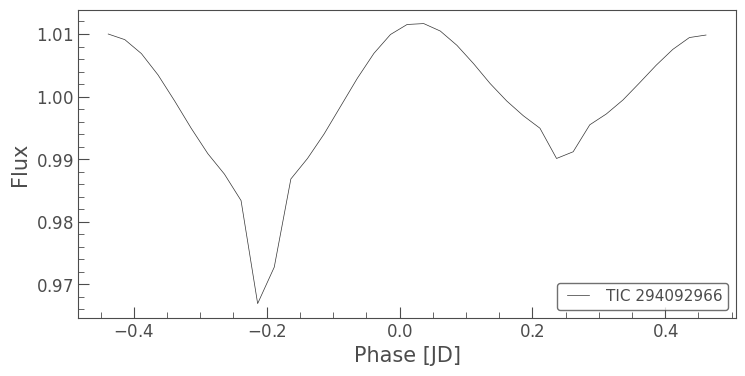

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

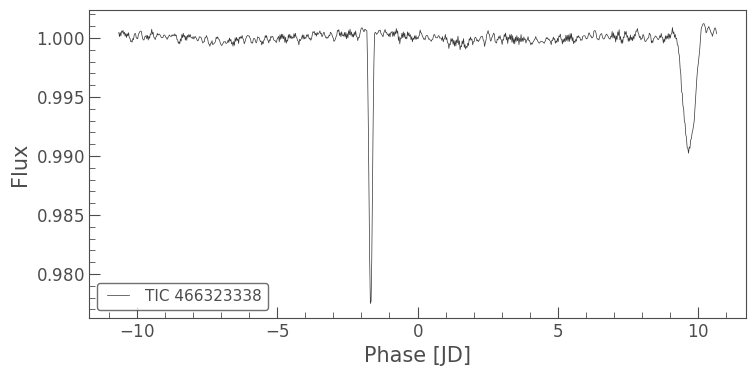

Skipping- Index 86 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05275908418769481216_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05275908418769481216_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


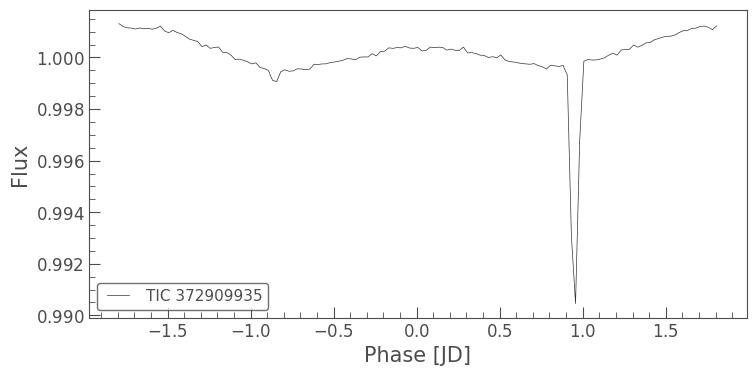

Skipping- Index 104 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04760221655563832320_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-04760221655563832320_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.
Skipping -No light curves passed SNR threshold for TIC 382266319


<Figure size 640x480 with 0 Axes>

Skipping- Index 86 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04676170696065780480_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04676170696065780480_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


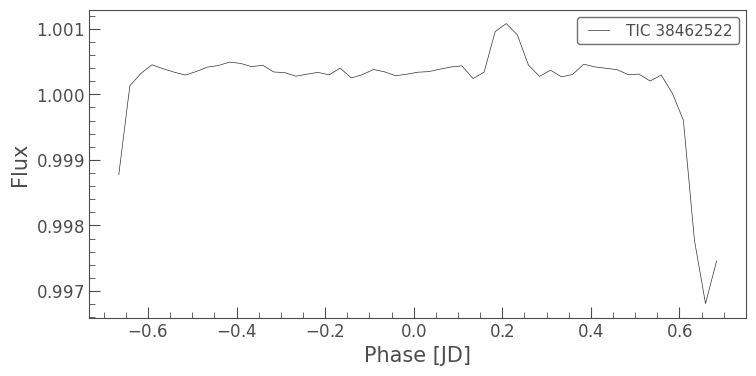

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


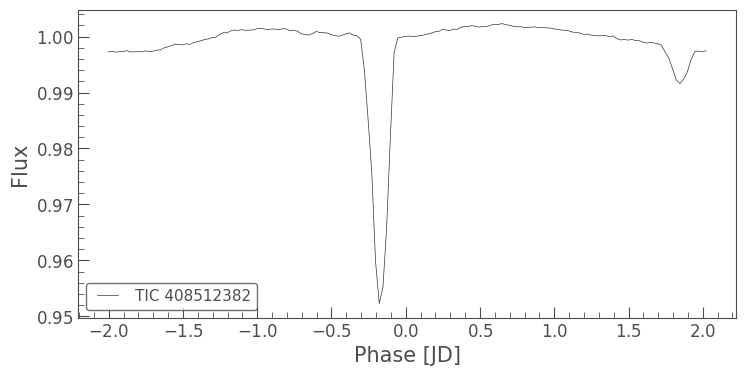

Skipping- Index 97 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04655651365254715648_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04655651365254715648_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


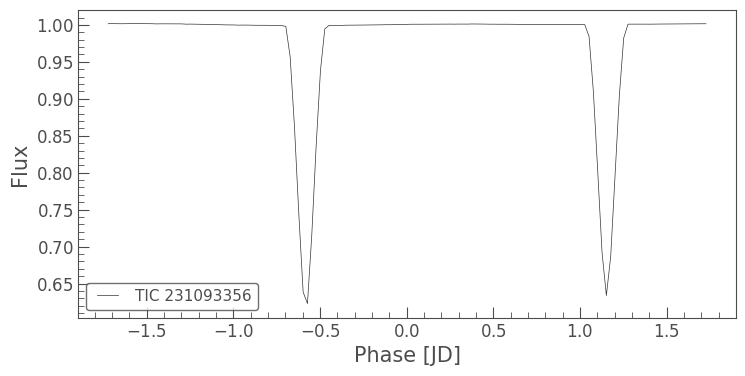

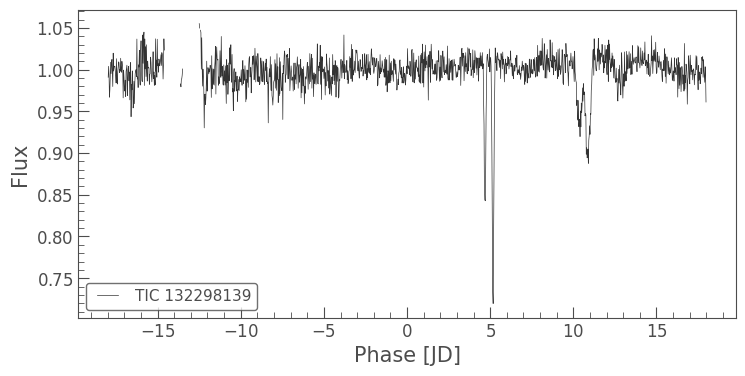

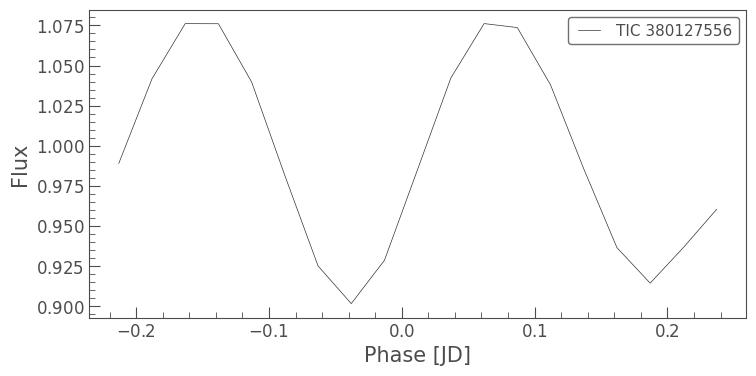

Skipping- Index 69 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam3-ccd4-04642053155197039104_tess_v01/hlsp_t16_tess_ffi_s0001-cam3-ccd4-04642053155197039104_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


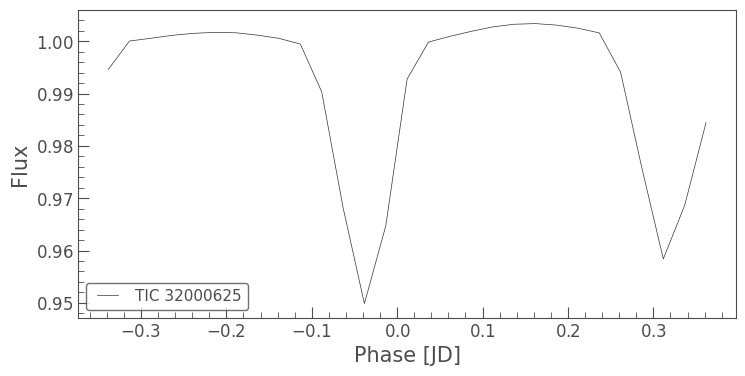

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

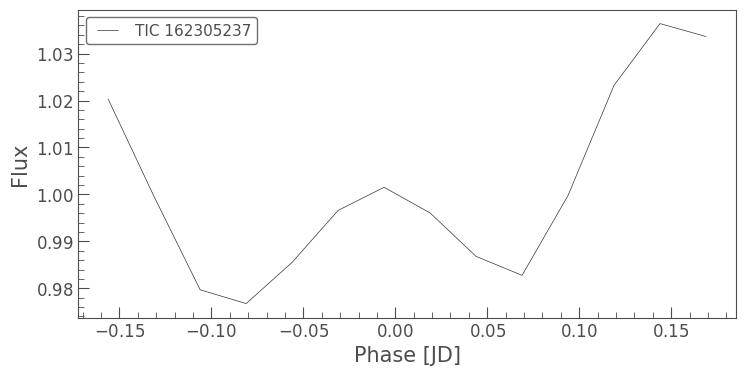

Skipping -No light curves passed SNR threshold for TIC 345899523


/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


<Figure size 640x480 with 0 Axes>

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

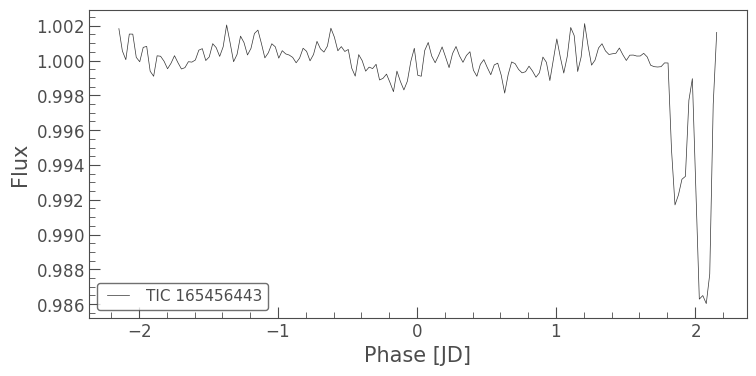

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Skipping- Index 106 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05484778171633161088_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05484778171633161088_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy num

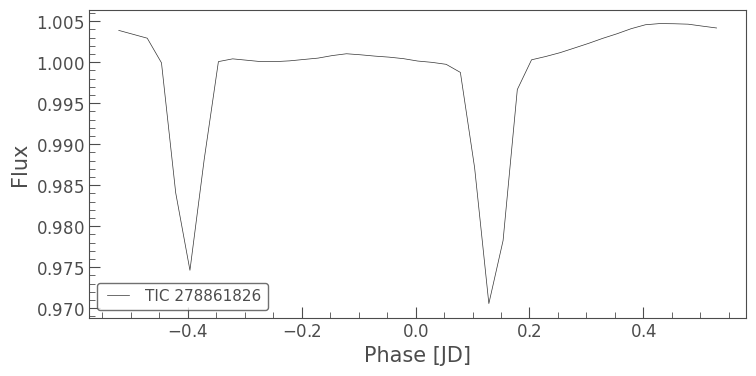

Skipping- Index 9 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_diamante_tess_lightcurve_tic-0000000229811538_tess_v2_llc/hlsp_diamante_tess_lightcurve_tic-0000000229811538_tess_v2_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

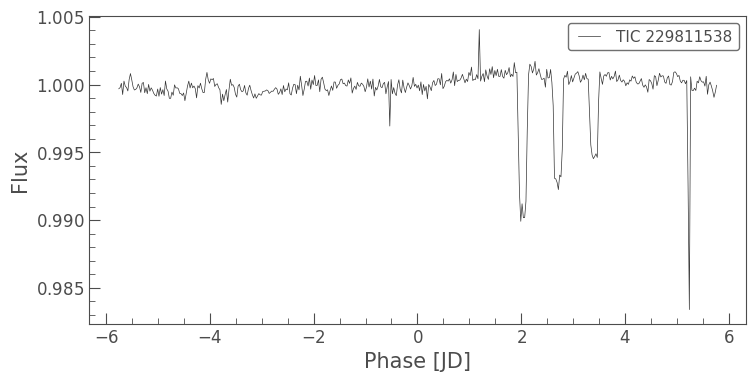

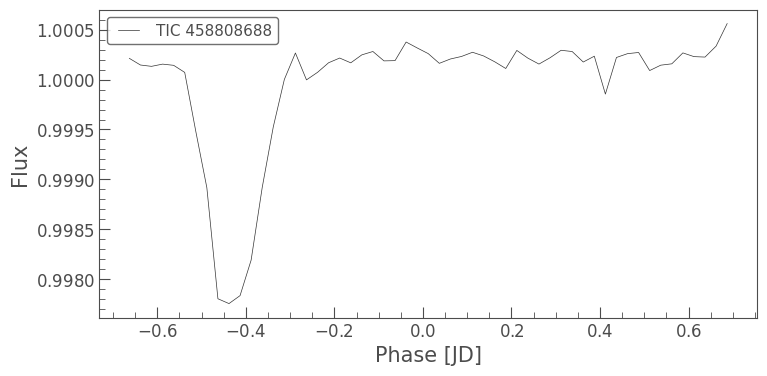

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

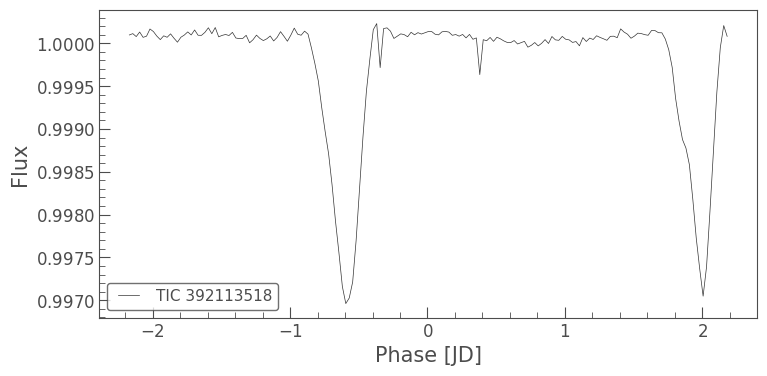

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

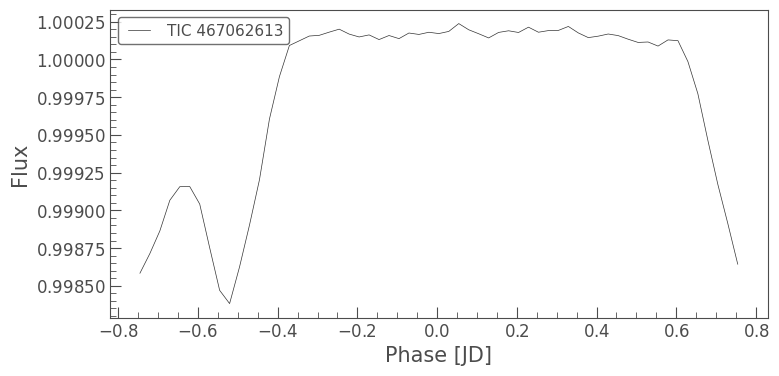

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

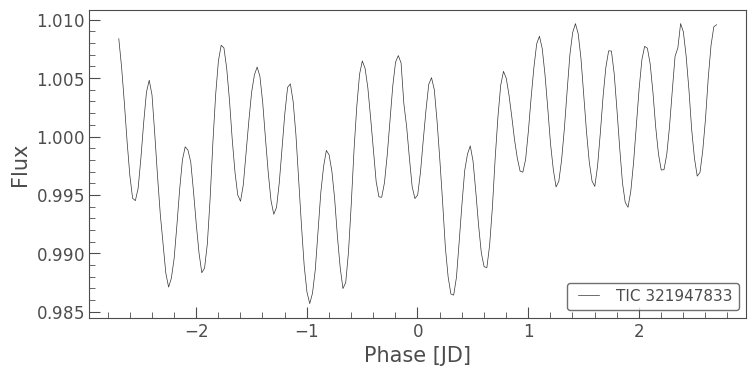

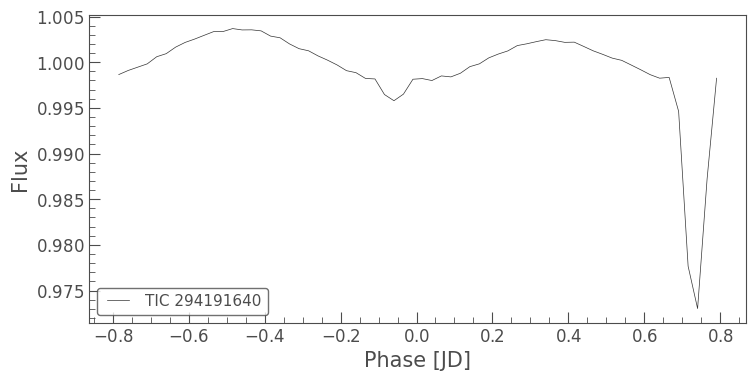

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Skipping- Index 69 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05292428306097203328_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05292428306097203328_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


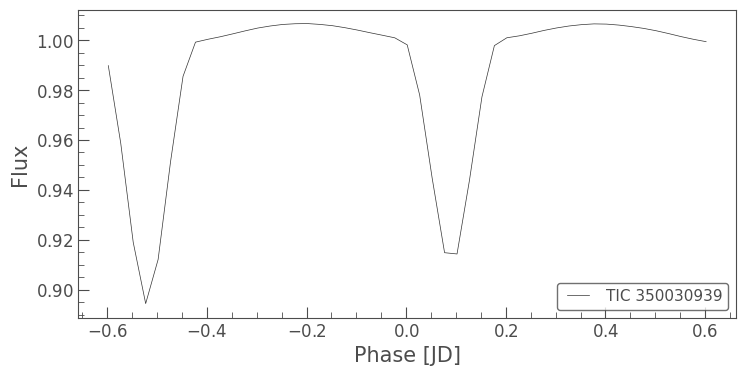

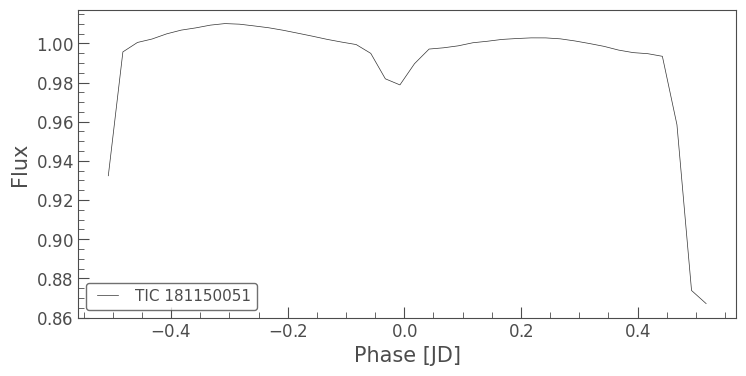

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


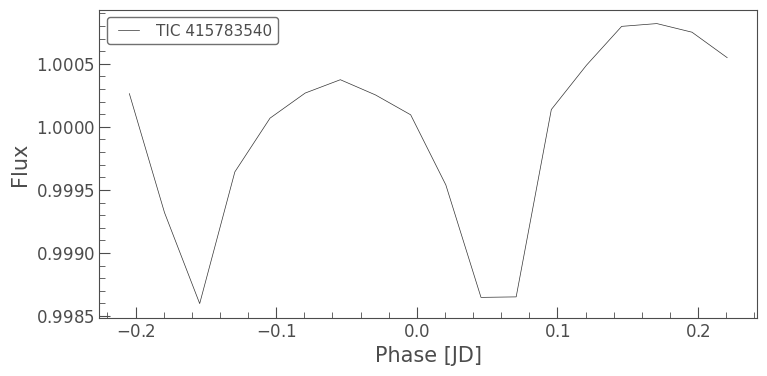

Skipping- Index 93 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05280249737354083200_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05280249737354083200_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


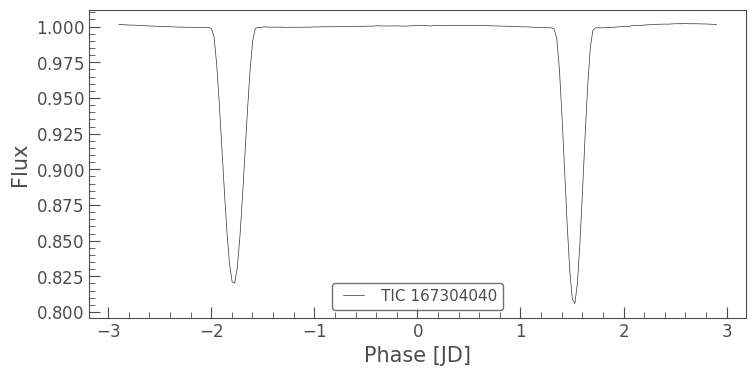

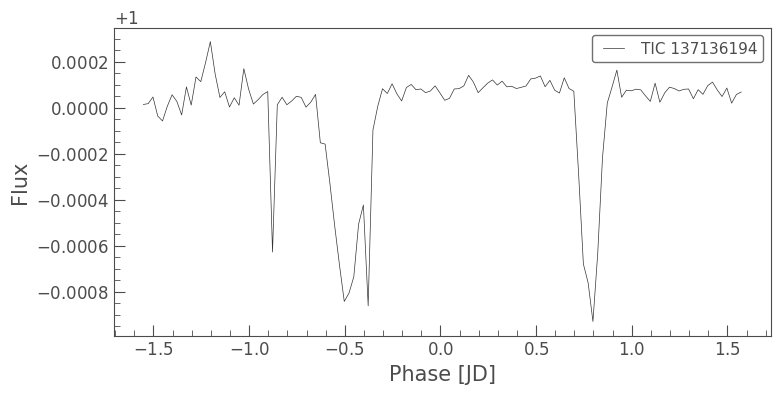

Skipping- Index 96 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05261762892438749696_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05261762892438749696_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


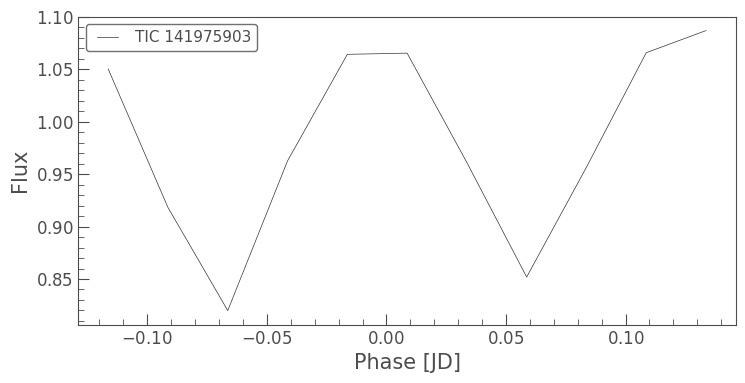

Skipping -No light curves passed SNR threshold for TIC 124205037


<Figure size 640x480 with 0 Axes>

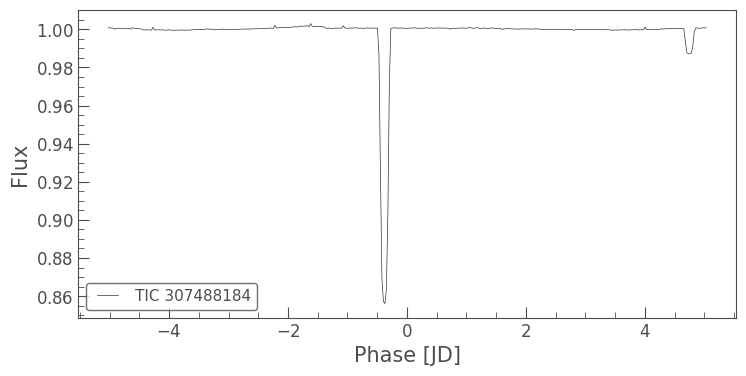

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

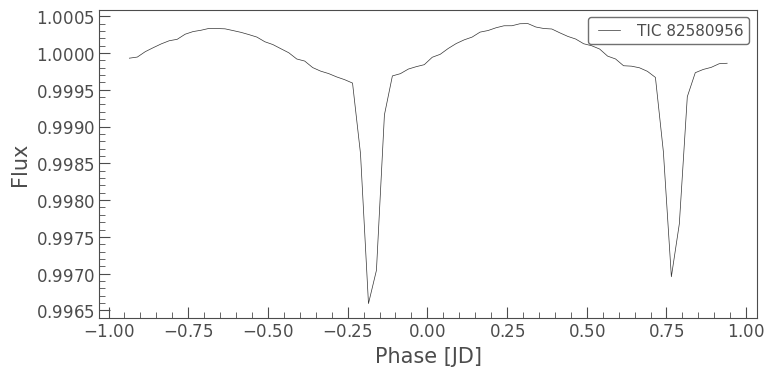

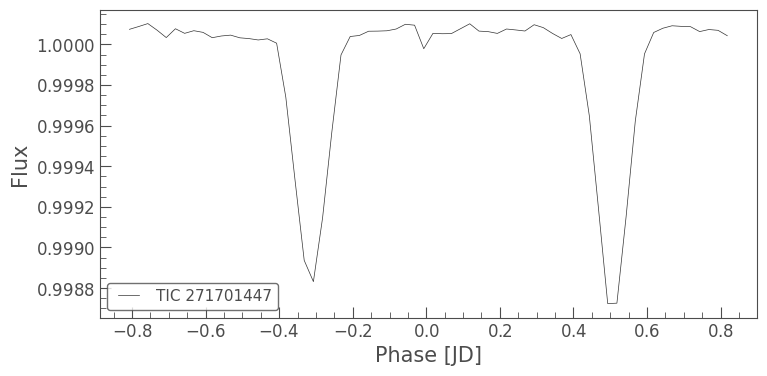

Skipping- Index 107 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04650570251448824960_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04650570251448824960_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


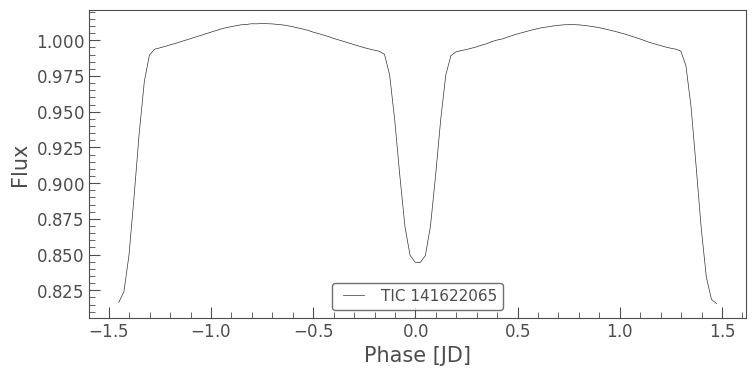

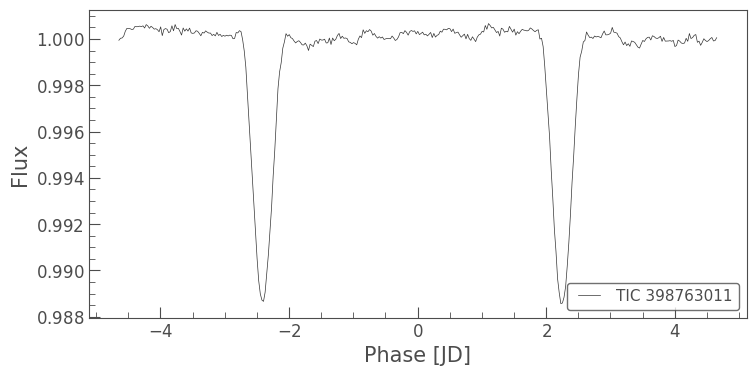

Skipping- Index 57 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05277215016536576512_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05277215016536576512_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


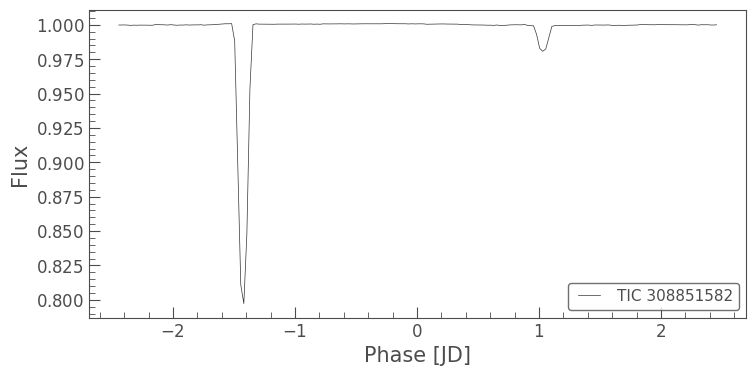

Skipping- Index 95 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05499070212183375872_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd4-05499070212183375872_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


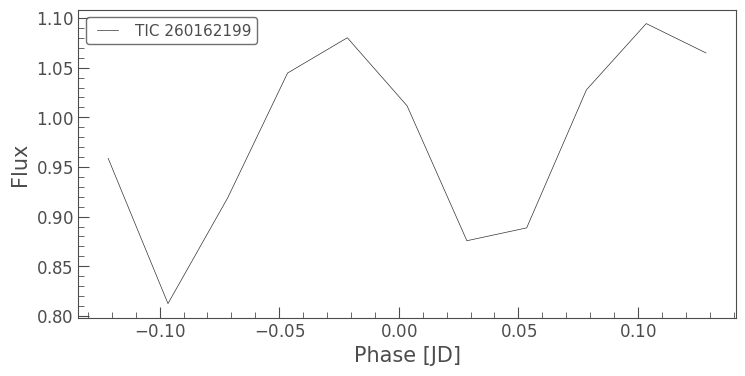

Skipping- Index 126 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04669741095664085120_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04669741095664085120_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


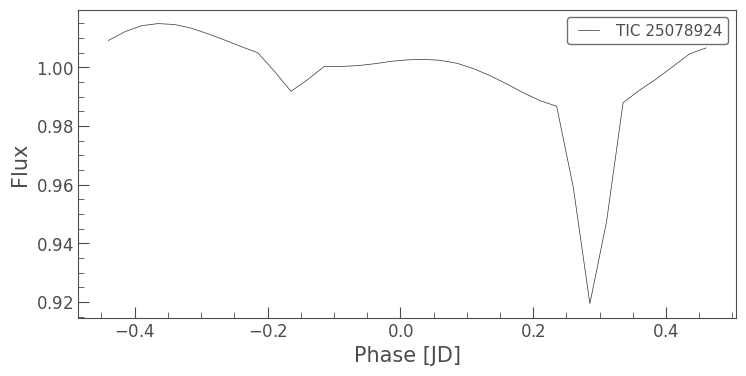

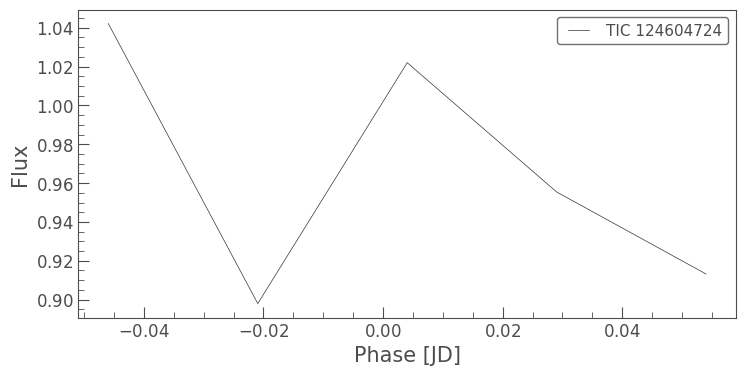

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


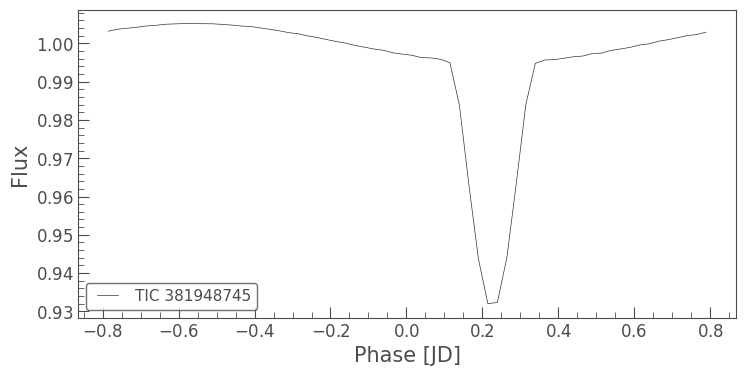

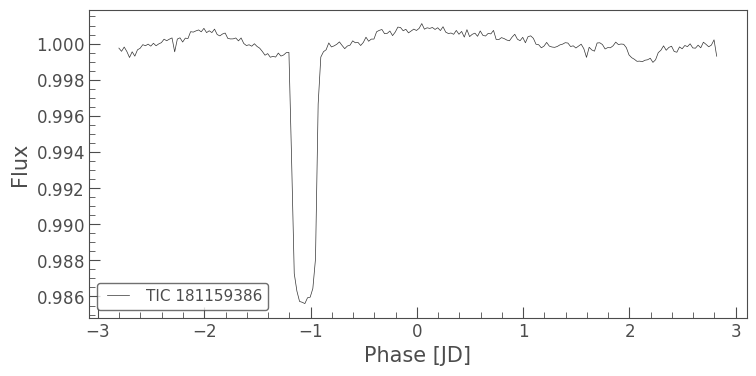

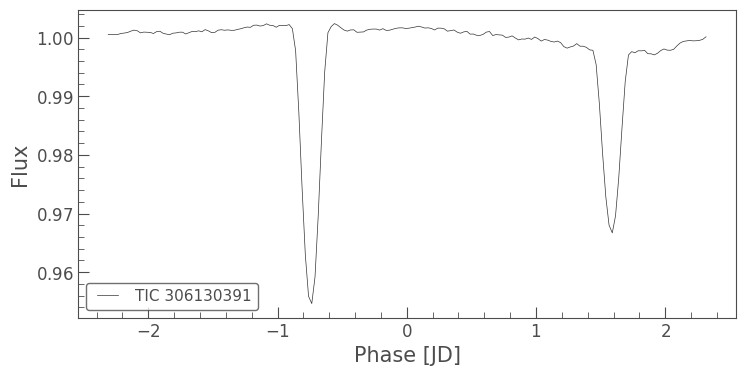

Skipping- Index 133 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04762104741025797120_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04762104741025797120_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


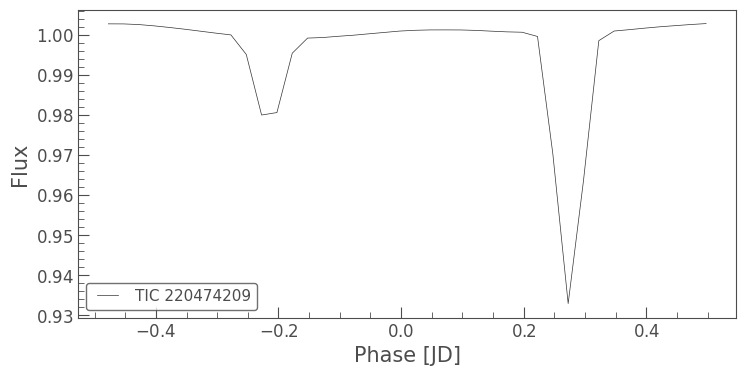

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Skipping- Index 94 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05266214918097230976_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05266214918097230976_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


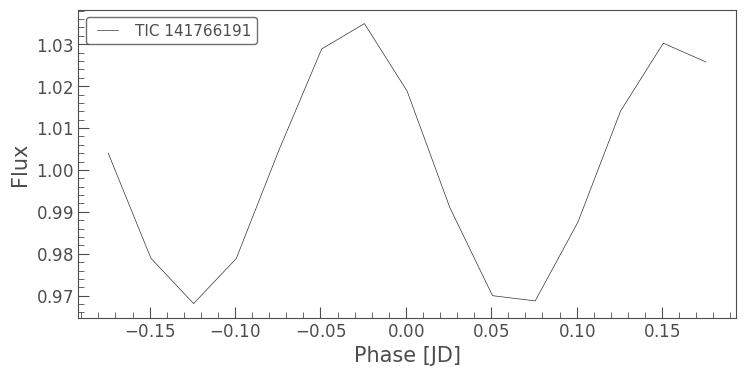

<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Skipping- Index 87 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05479695649071593216_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05479695649071593216_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


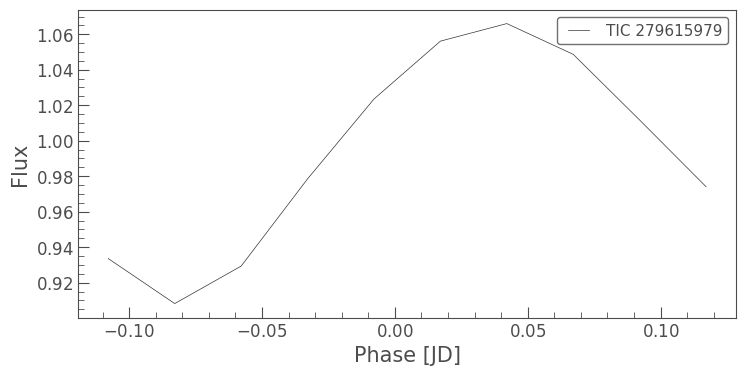

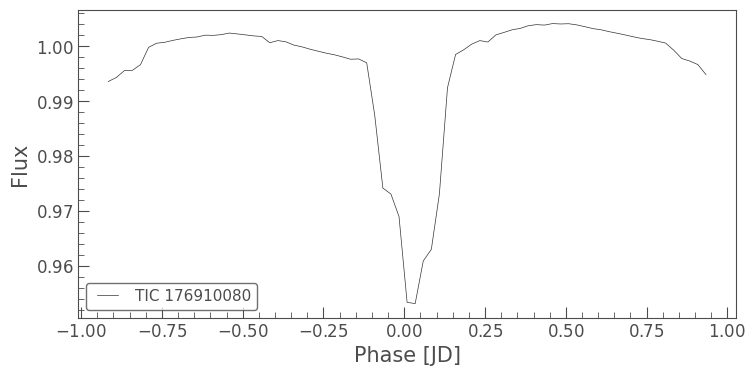

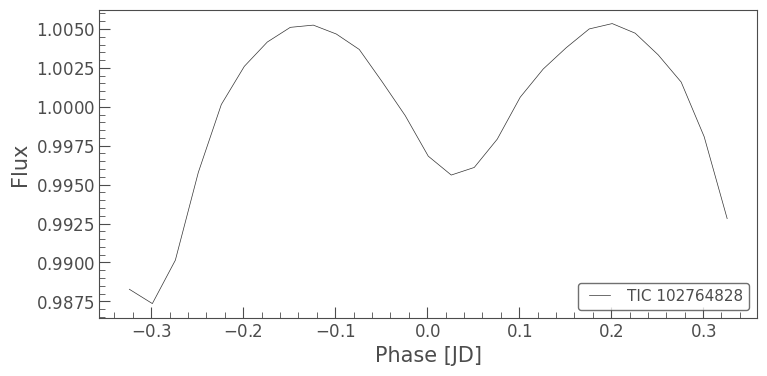

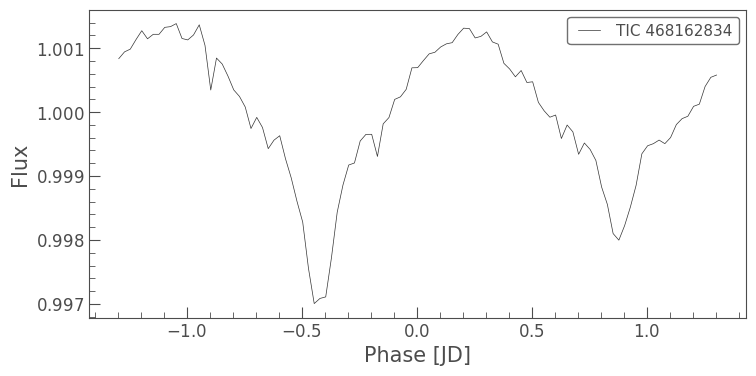

Skipping- Index 93 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05266407676232077056_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05266407676232077056_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


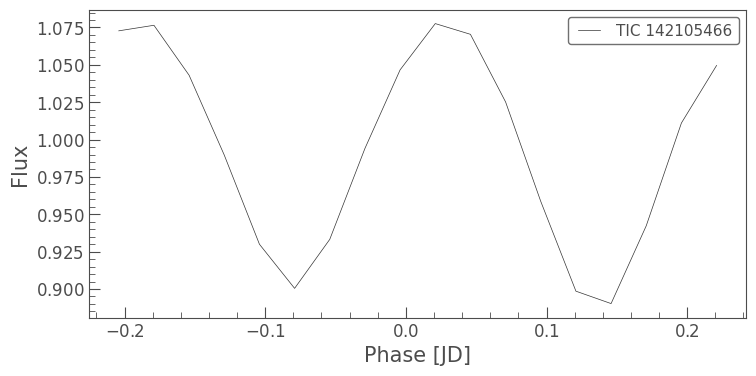

Skipping- Index 104 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04651292424425138560_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-04651292424425138560_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


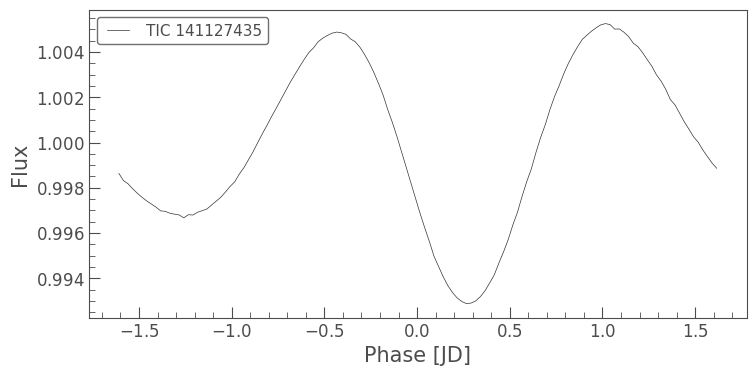

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)
/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


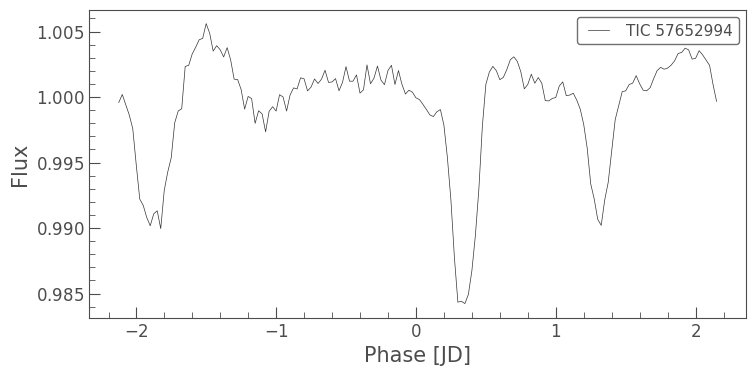

/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


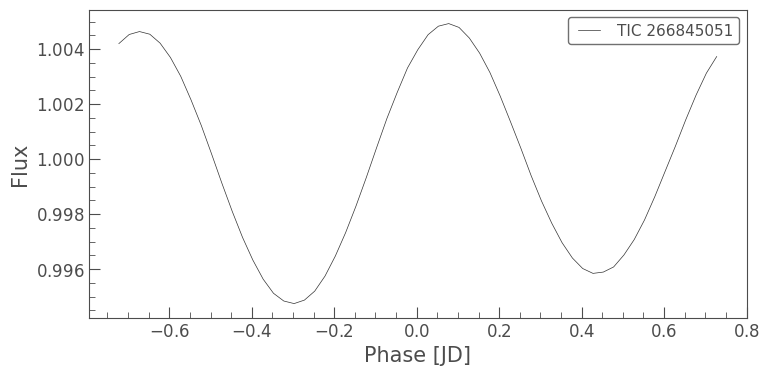

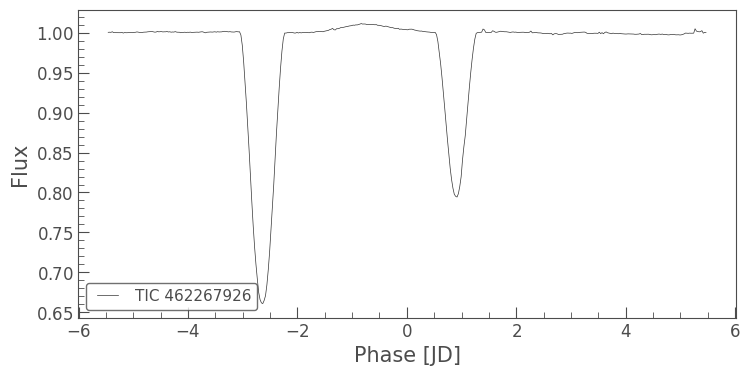

Skipping- Index 108 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04664921592603188224_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd1-04664921592603188224_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


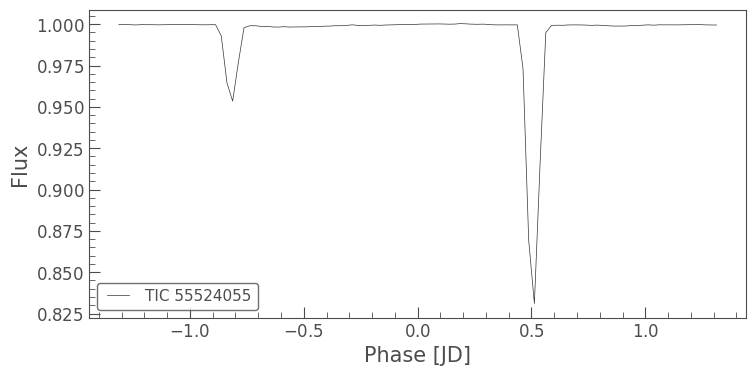

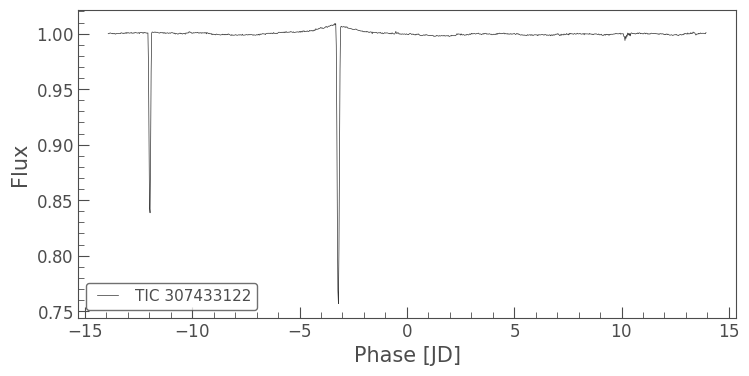

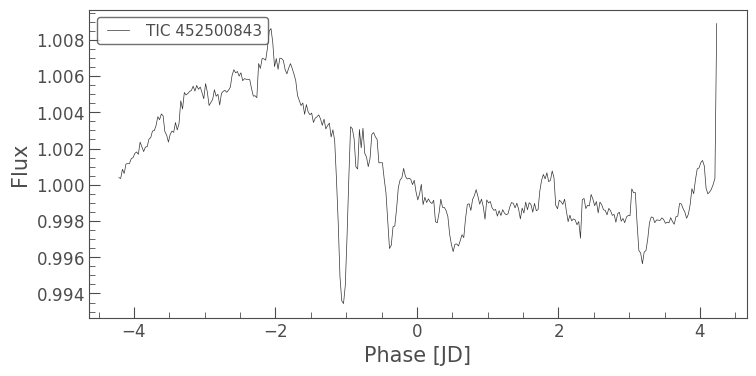

Skipping- Index 83 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05292370921038853760_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd3-05292370921038853760_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

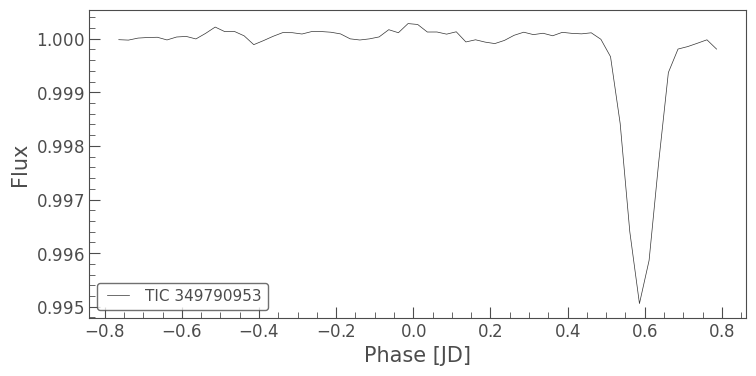

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
/usr/local/lib/python3.11/dist-packages/astropy/utils/masked/core.py:848: RuntimeWarning: invalid value encountered in divide
  result = getattr(ufunc, method)(*unmasked, **kwargs)


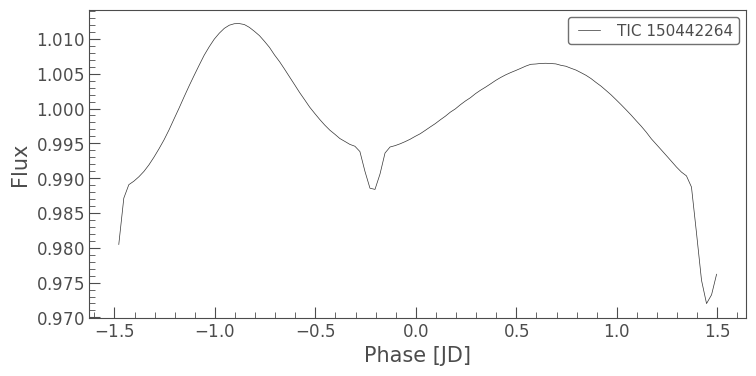

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


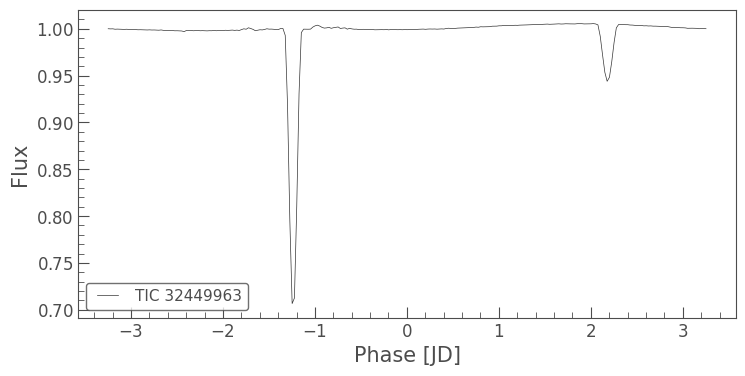

Skipping -No light curves passed SNR threshold for TIC 92902951


<Figure size 640x480 with 0 Axes>

TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Python or Numpy numeric type.') [astropy.table.table]
TypeError('The value must be a valid Python or Numpy numeric type.')
TypeError('The value must be a valid Pyt

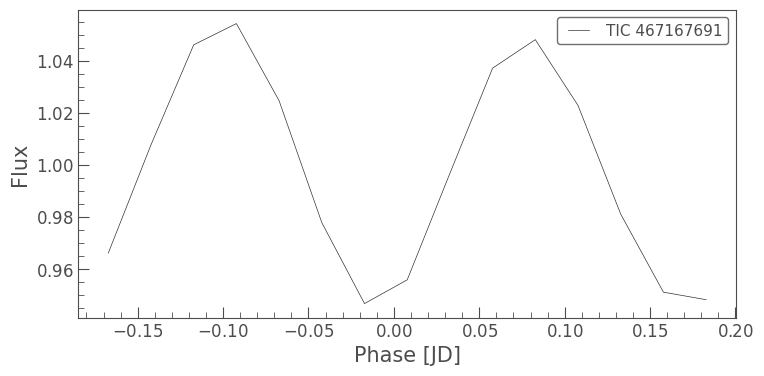

/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:1887: RuntimeWarning: overflow encountered in multiply
  sqr = np.multiply(arr, arr, out=arr, where=where)


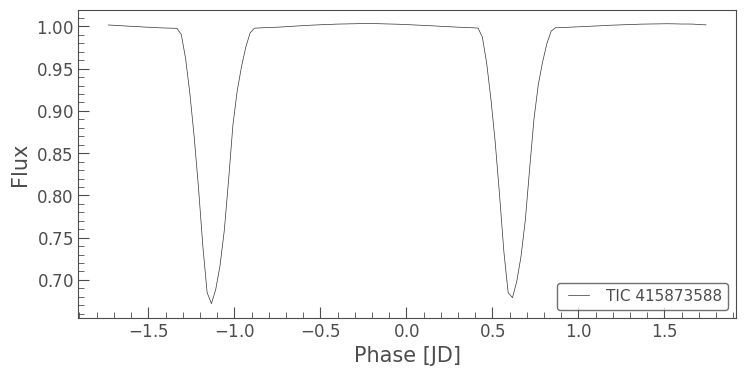

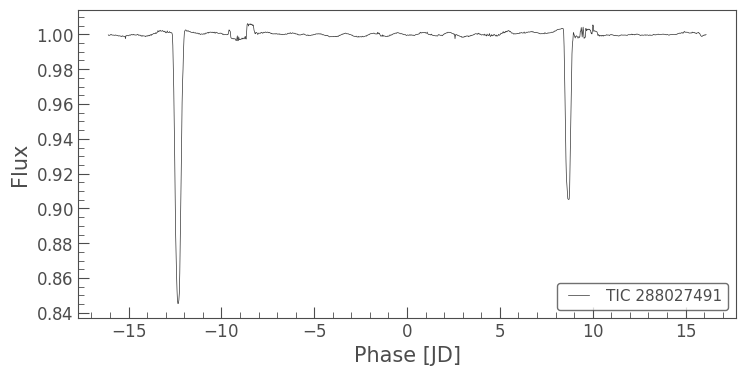

Skipping- Index 99 due to error: Not recognized as a supported data product:
/root/.lightkurve/cache/mastDownload/HLSP/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05265856885329446400_tess_v01/hlsp_t16_tess_ffi_s0001-cam4-ccd2-05265856885329446400_tess_v01_llc.fits
This file may be corrupt due to an interrupted download. Please remove it from your disk and try again.


<ipython-input-14-e8f2c558fea3>:13: RuntimeWarning: All-NaN slice encountered
  median_flux = np.nanmedian(flux)
/usr/local/lib/python3.11/dist-packages/numpy/lib/_nanfunctions_impl.py:2035: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


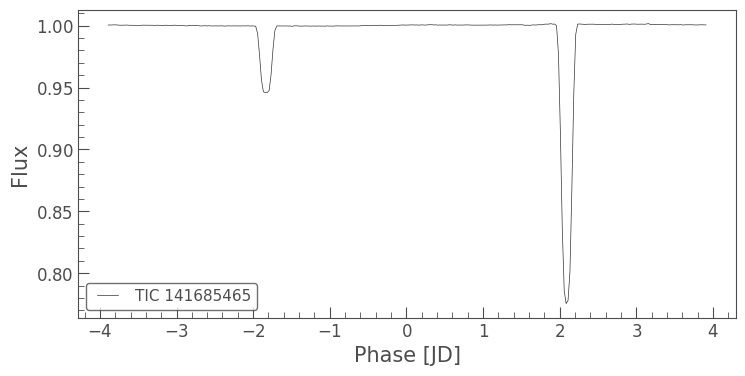

In [21]:
# Find, plot and save the light curves for the eclipsing binary signal data
eb_lc = []
for j,TIC_IDs in enumerate(df_binaries_175['tess_id']):
  time,flux = find_and_plot_LC_EB(str(TIC_IDs), df_binaries_175['period'][j])
  eb_lc.append({'label' : 1,'tic': TIC_IDs, 'time': time, 'flux': flux})
  plt.savefig(f"training_images/binaries/eb_curve_{j}.png", dpi=150)
  plt.show()

In [53]:
# Finding training images and creating training/validation sets

# Parameters
img_size = (64, 64)
batch_size = 16
data_dir = 'training_images'

# Load and split dataset
train_ds = image_dataset_from_directory(data_dir,validation_split=0.2, subset="training", seed=42, image_size=img_size, batch_size=batch_size)
val_ds = image_dataset_from_directory(data_dir, validation_split=0.2, subset="validation", seed=42, image_size=img_size,batch_size=batch_size')
class_names = ['binaries','planets']
print("Class Names:", class_names)

Found 349 files belonging to 2 classes.
Using 280 files for training.
Found 349 files belonging to 2 classes.
Using 69 files for validation.
Class Names: ['binaries', 'planets']


In [111]:
# 2D Convolusional Neural Network

model = models.Sequential([
    layers.Rescaling(1./255, input_shape=(64, 64, 1)),
    layers.Conv2D(16, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(64, 3, activation='relu'),
    layers.Dropout(0.25),
    layers.MaxPooling2D(),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(2, activation='softmax')])
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model.summary()
history = model.fit(train_ds, validation_data=val_ds, epochs=26)
val_loss, val_acc = model.evaluate(val_ds)
print("Validation accuracy: " + str(val_acc))

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_19 (Rescaling)        │ (None, 64, 64, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_57 (Conv2D)              │ (None, 62, 62, 16)     │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_54 (MaxPooling2D) │ (None, 31, 31, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 29, 29, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_55 (MaxPooling2D) │ (None, 14, 14, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 12, 12, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_19 (Flatten)            │ (None, 2304)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 64)             │       147,520 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 170,946 (667.76 KB)

 Trainable params: 170,946 (667.76 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/26
18/18 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - accuracy: 0.4865 - loss: 0.7056 - val_accuracy: 0.5362 - val_loss: 0.6925
Epoch 2/26
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.4532 - loss: 0.6972 - val_accuracy: 0.6232 - val_loss: 0.6925
Epoch 3/26
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.4655 - loss: 0.6991 - val_accuracy: 0.4638 - val_loss: 0.6933
Epoch 4/26
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - accuracy: 0.5057 - loss: 0.6934 - val_accuracy: 0.4638 - val_loss: 0.6956
Epoch 5/26
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.5462 - loss: 0.6897 - val_accuracy: 0.4638 - val_loss: 0.6923
Epoch 6/26
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.5857 - loss: 0.6893 - val_accuracy: 0.4638 - val_loss: 0.6888
Epoch 7/26
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.5760 - loss: 0.6776 - val_accuracy: 0.6377 - val_loss: 0.6446
Epoch 8/26
18/18 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - accuracy: 0.6278 - loss: 0.6434 - val_accuracy: 0.8261 - v

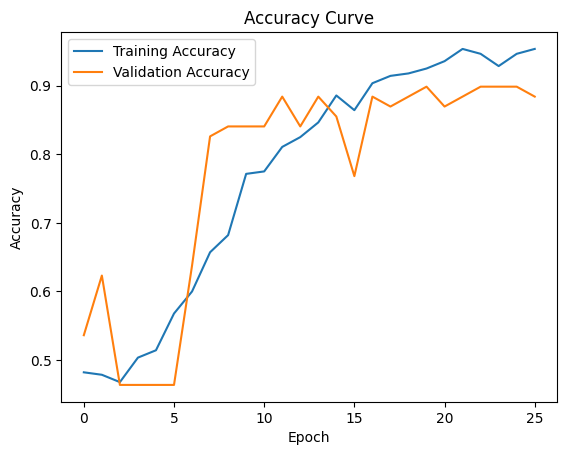

In [114]:
# Plot accuracy curves
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Curve')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step


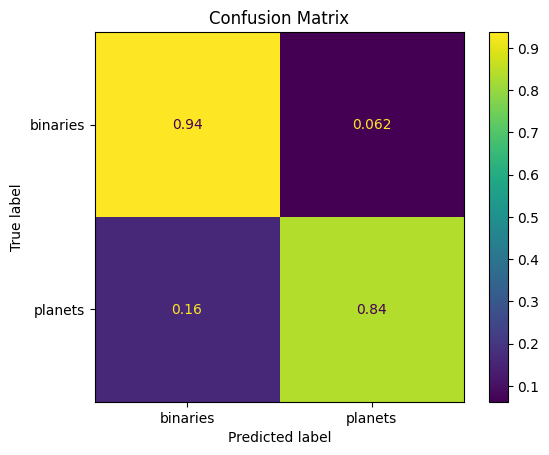

In [113]:
# Create the confusion matrix
y_true = []
y_pred = []
for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
conf = confusion_matrix(y_true, y_pred,normalize='true')
labels = class_names
disp = ConfusionMatrixDisplay(confusion_matrix=conf, display_labels=labels)
disp.plot()
plt.title("Confusion Matrix")
plt.show()

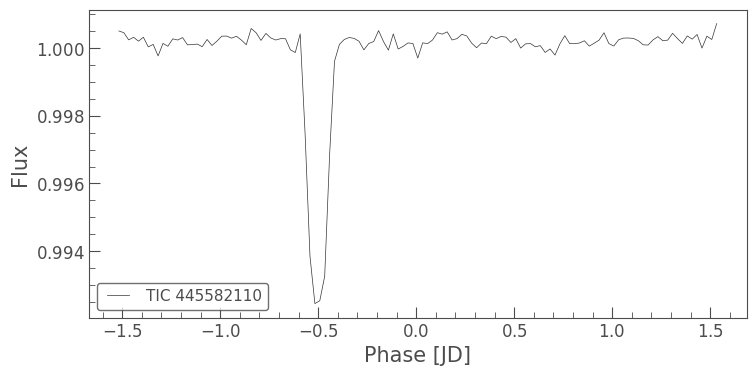

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
Prediction: Planet Signal (confidence: 0.9729508)
Yay, you found a planet, use MCMC code in next notebook to get planetary parameters


In [115]:
# Lets try to use it now!
TIC_ID = '445582110' # Put your TIC ID here
Period = 3.0581 # Put period here

give_TIC_ID_get_class(TIC_ID, Period , model)